In [1]:
# Notebook 13 setup: OpenCV report generation milestone

from __future__ import annotations

import json
import platform
import sys
from datetime import datetime, timezone
from hashlib import sha256
from pathlib import Path
from typing import Any

import numpy as np
import pandas as pd
from IPython.display import Markdown, display


PROJECT_ROOT = Path.cwd().resolve()

if PROJECT_ROOT.name == "notebooks":
    PROJECT_ROOT = PROJECT_ROOT.parent

SRC_DIR = PROJECT_ROOT / "src"

if str(SRC_DIR) not in sys.path:
    sys.path.insert(
        0,
        str(SRC_DIR),
    )


NOTEBOOK_NAME = "13_opencv_report_generation"

MODEL_NAME = "opencv_telea"

REPORT_SCHEMA_VERSION = "1.0.0"

RUN_STARTED_AT_UTC = datetime.now(timezone.utc)

DATA_DIR = PROJECT_ROOT / "data"

PROCESSED_DIR = DATA_DIR / "processed"

METADATA_DIR = PROCESSED_DIR / "metadata"

PROCESSED_METRICS_DIR = PROCESSED_DIR / "metrics"

OUTPUTS_DIR = PROJECT_ROOT / "outputs"

NOTEBOOK_OUTPUT_DIR = OUTPUTS_DIR / "13_opencv_report_generation"

REPORT_ASSET_DIR = OUTPUTS_DIR / "reports" / "opencv_report_assets"

REPORT_OUTPUT_DIR = OUTPUTS_DIR / "reports"

FIGURE_OUTPUT_DIR = OUTPUTS_DIR / "figures" / "opencv_report_generation"


for output_directory in (
    NOTEBOOK_OUTPUT_DIR,
    REPORT_ASSET_DIR,
    REPORT_OUTPUT_DIR,
    FIGURE_OUTPUT_DIR,
):
    output_directory.mkdir(
        parents=True,
        exist_ok=True,
    )


def project_relative_path(
    path: Path,
) -> str:
    path = Path(path)

    try:
        return path.relative_to(PROJECT_ROOT).as_posix()
    except ValueError:
        return path.as_posix()


def file_sha256(
    path: Path,
) -> str:
    digest = sha256()

    with Path(path).open("rb") as file:
        for block in iter(lambda: file.read(1024 * 1024), b""):
            digest.update(block)

    return digest.hexdigest()


def build_check(
    check_name: str,
    actual: Any,
    expected: Any,
    passed: bool,
) -> dict[str, Any]:
    return {
        "check": check_name,
        "actual": actual,
        "expected": expected,
        "passed": bool(passed),
    }


runtime_environment_df = pd.DataFrame(
    [
        {"component": "python", "version": platform.python_version()},
        {"component": "platform", "version": platform.platform()},
        {"component": "numpy", "version": np.__version__},
        {"component": "pandas", "version": pd.__version__},
    ]
)

display(runtime_environment_df)

display(
    Markdown(
        "## Notebook 13 — OpenCV Report Generation\n\n"
        "This notebook consolidates OpenCV Telea evaluation artifacts into standardized report assets. "
        "It reports metric behavior, runtime/failure information, region-aware results, difference-map links, "
        "representative cases, and preliminary texture/colour/seam evidence where available. "
        "It does **not** make final trustworthiness conclusions before cross-model analysis."
    )
)

,component,version
0,python,3.12.6
1,platform,Windows-11-10.0.26200-SP0
2,numpy,1.26.4
3,pandas,2.3.3


## Notebook 13 — OpenCV Report Generation

This notebook consolidates OpenCV Telea evaluation artifacts into standardized report assets. It reports metric behavior, runtime/failure information, region-aware results, difference-map links, representative cases, and preliminary texture/colour/seam evidence where available. It does **not** make final trustworthiness conclusions before cross-model analysis.

In [2]:
# Canonical and optional input paths

CLEAN_METADATA_PATH = (
    METADATA_DIR / "metadata_processed_clean.csv"
)

RESTORATION_METADATA_PATH = (
    METADATA_DIR / "metadata_restored_opencv_telea.csv"
)

CLASSICAL_METRICS_PATH = (
    PROCESSED_METRICS_DIR / "metrics_opencv_telea_classical.csv"
)

LPIPS_METRICS_PATH = (
    PROCESSED_METRICS_DIR / "metrics_opencv_telea_lpips.csv"
)

FEATURE_METRICS_PATH = (
    PROCESSED_METRICS_DIR / "metrics_opencv_telea_feature_similarity.csv"
)

SPATIAL_DIAGNOSTICS_PATH = (
    PROCESSED_METRICS_DIR / "spatial_diagnostics_opencv_telea.csv"
)

SPATIAL_SCALES_PATH = (
    PROCESSED_METRICS_DIR / "spatial_diagnostic_scales_opencv_telea.csv"
)


CLASSICAL_AUDIT_PATH = (
    OUTPUTS_DIR
    / "09_opencv_metrics_classical"
    / "opencv_metrics_classical_audit.csv"
)

DIFFERENCE_MAP_FIGURE_DIR = (
    OUTPUTS_DIR
    / "figures"
    / "opencv_difference_maps"
    / "all_cases"
)

LPIPS_AUDIT_PATH = (
    OUTPUTS_DIR
    / "11_opencv_lpips_metrics"
    / "opencv_lpips_metrics_audit.csv"
)

FEATURE_AUDIT_PATH = (
    OUTPUTS_DIR
    / "12_opencv_feature_similarity"
    / "opencv_feature_similarity_audit.csv"
)


REPORT_CASE_METRICS_OUTPUT_PATH = (
    REPORT_ASSET_DIR / "opencv_telea_report_case_metrics.csv"
)

REPORT_SUMMARY_BY_DATASET_OUTPUT_PATH = (
    REPORT_ASSET_DIR / "opencv_telea_report_summary_by_dataset.csv"
)

REPORT_SUMMARY_BY_MASK_OUTPUT_PATH = (
    REPORT_ASSET_DIR / "opencv_telea_report_summary_by_mask_type.csv"
)

REPORT_SUMMARY_BY_REGION_OUTPUT_PATH = (
    REPORT_ASSET_DIR / "opencv_telea_report_summary_by_region.csv"
)

REPORT_REPRESENTATIVE_CASES_OUTPUT_PATH = (
    REPORT_ASSET_DIR / "opencv_telea_report_representative_cases.csv"
)

REPORT_RUNTIME_FAILURE_OUTPUT_PATH = (
    REPORT_ASSET_DIR / "opencv_telea_report_runtime_failure_summary.csv"
)

REPORT_ASSET_MANIFEST_OUTPUT_PATH = (
    REPORT_ASSET_DIR / "opencv_telea_report_asset_manifest.json"
)

REPORT_MARKDOWN_OUTPUT_PATH = (
    REPORT_OUTPUT_DIR / "opencv_telea_report_generation.md"
)


required_input_paths = {
    "clean_metadata": CLEAN_METADATA_PATH,
    "restoration_metadata": RESTORATION_METADATA_PATH,
    "classical_metrics": CLASSICAL_METRICS_PATH,
    "lpips_metrics": LPIPS_METRICS_PATH,
    "feature_similarity_metrics": FEATURE_METRICS_PATH,
}

optional_input_paths = {
    "spatial_diagnostics": SPATIAL_DIAGNOSTICS_PATH,
    "spatial_visualization_scales": SPATIAL_SCALES_PATH,
    "classical_audit": CLASSICAL_AUDIT_PATH,
    "lpips_audit": LPIPS_AUDIT_PATH,
    "feature_similarity_audit": FEATURE_AUDIT_PATH,
    "difference_map_figure_dir": DIFFERENCE_MAP_FIGURE_DIR,
}

In [3]:
# Input artifact inventory

def describe_artifact(
    artifact_name: str,
    path: Path,
    required: bool,
) -> dict[str, Any]:
    exists = path.exists()

    if path.is_file():
        artifact_kind = "file"
        file_size_bytes = path.stat().st_size
        sha256_value = file_sha256(path)
    elif path.is_dir():
        artifact_kind = "directory"
        file_size_bytes = np.nan
        sha256_value = ""
    else:
        artifact_kind = "missing"
        file_size_bytes = 0
        sha256_value = ""

    return {
        "artifact_name": artifact_name,
        "required": required,
        "artifact_kind": artifact_kind,
        "path": project_relative_path(path),
        "exists": exists,
        "file_size_bytes": file_size_bytes,
        "sha256": sha256_value,
    }


input_inventory_df = pd.DataFrame(
    [
        describe_artifact(
            artifact_name,
            artifact_path,
            required=True,
        )
        for artifact_name, artifact_path in required_input_paths.items()
    ]
    + [
        describe_artifact(
            artifact_name,
            artifact_path,
            required=False,
        )
        for artifact_name, artifact_path in optional_input_paths.items()
    ]
)

display(input_inventory_df)

missing_required_inputs = input_inventory_df.loc[
    input_inventory_df["required"].astype(bool)
    & ~input_inventory_df["exists"].astype(bool),
    "artifact_name",
].tolist()

empty_required_inputs = input_inventory_df.loc[
    input_inventory_df["required"].astype(bool)
    & input_inventory_df["exists"].astype(bool)
    & input_inventory_df["artifact_kind"].eq("file")
    & input_inventory_df["file_size_bytes"].eq(0),
    "artifact_name",
].tolist()

input_validation_df = pd.DataFrame(
    [
        build_check(
            "required_inputs_exist",
            missing_required_inputs,
            [],
            len(missing_required_inputs) == 0,
        ),
        build_check(
            "required_inputs_non_empty",
            empty_required_inputs,
            [],
            len(empty_required_inputs) == 0,
        ),
    ]
)

display(input_validation_df)

if not input_validation_df["passed"].astype(bool).all():
    raise RuntimeError(
        "Notebook 13 input validation failed. Resolve missing required artifacts before report generation."
    )

print("Notebook 13 required input inventory passed.")

,artifact_name,required,artifact_kind,path,exists,file_size_bytes,sha256
0,clean_metadata,True,file,data/processed/metadata/metadata_processed_cle...,True,30443.0,b5f11a01dd3ea1ed14193d4a942f702a2b0cb712d2b8b3...
1,restoration_metadata,True,file,data/processed/metadata/metadata_restored_open...,True,762016.0,c76e783cb0b1b6deb7de72b05de070c8ac8ea72d1d2e30...
2,classical_metrics,True,file,data/processed/metrics/metrics_opencv_telea_cl...,True,1690289.0,1b8d018cfdb7254c5b65ee1f371015f4cf7da67f50ca10...
3,lpips_metrics,True,file,data/processed/metrics/metrics_opencv_telea_lp...,True,845169.0,99f0d27dc96d950f193242e7d01229f236a50eb0d51fd4...
4,feature_similarity_metrics,True,file,data/processed/metrics/metrics_opencv_telea_fe...,True,1407056.0,70a32457f3adb2ad59409b93ded14852a4f28508c0e7ee...
5,spatial_diagnostics,False,file,data/processed/metrics/spatial_diagnostics_ope...,True,843614.0,014636c9421fad90b0529cc57a0e7acbbe1ecb602a0060...
6,spatial_visualization_scales,False,file,data/processed/metrics/spatial_diagnostic_scal...,True,482.0,0cc123cc892dd87089d79da37601240fb98666ed58aecb...
7,classical_audit,False,file,outputs/09_opencv_metrics_classical/opencv_met...,True,6148.0,c8b562cd21a6f161e482e11f1db717c52ec411e1145324...
8,lpips_audit,False,file,outputs/11_opencv_lpips_metrics/opencv_lpips_m...,True,671.0,e671f04340c374f72b98355976c96d70a79fdbd765da1b...
9,feature_similarity_audit,False,file,outputs/12_opencv_feature_similarity/opencv_fe...,True,1272.0,d7cdbdb8a9eddd46a0f4766f4f84d831973f69d58fadef...


,check,actual,expected,passed
0,required_inputs_exist,[],[],True
1,required_inputs_non_empty,[],[],True


Notebook 13 required input inventory passed.


In [4]:
# Load required and optional report inputs

clean_metadata_df = pd.read_csv(CLEAN_METADATA_PATH)

restoration_metadata_df = pd.read_csv(RESTORATION_METADATA_PATH)

classical_metrics_df = pd.read_csv(CLASSICAL_METRICS_PATH)

lpips_metrics_df = pd.read_csv(LPIPS_METRICS_PATH)

feature_metrics_df = pd.read_csv(FEATURE_METRICS_PATH)


optional_loaded_frames: dict[str, pd.DataFrame] = {}

for optional_name, optional_path in {
    "spatial_diagnostics": SPATIAL_DIAGNOSTICS_PATH,
    "spatial_visualization_scales": SPATIAL_SCALES_PATH,
    "classical_audit": CLASSICAL_AUDIT_PATH,
    "lpips_audit": LPIPS_AUDIT_PATH,
    "feature_similarity_audit": FEATURE_AUDIT_PATH,
}.items():
    if optional_path.is_file() and optional_path.stat().st_size > 0:
        optional_loaded_frames[optional_name] = pd.read_csv(optional_path)


loaded_table_summary_df = pd.DataFrame(
    [
        {
            "table_name": "clean_metadata",
            "rows": len(clean_metadata_df),
            "columns": len(clean_metadata_df.columns),
        },
        {
            "table_name": "restoration_metadata",
            "rows": len(restoration_metadata_df),
            "columns": len(restoration_metadata_df.columns),
        },
        {
            "table_name": "classical_metrics",
            "rows": len(classical_metrics_df),
            "columns": len(classical_metrics_df.columns),
        },
        {
            "table_name": "lpips_metrics",
            "rows": len(lpips_metrics_df),
            "columns": len(lpips_metrics_df.columns),
        },
        {
            "table_name": "feature_similarity_metrics",
            "rows": len(feature_metrics_df),
            "columns": len(feature_metrics_df.columns),
        },
        *[
            {
                "table_name": optional_name,
                "rows": len(optional_df),
                "columns": len(optional_df.columns),
            }
            for optional_name, optional_df in optional_loaded_frames.items()
        ],
    ]
)

display(loaded_table_summary_df)

print("Required tables loaded.")

,table_name,rows,columns
0,clean_metadata,50,47
1,restoration_metadata,410,194
2,classical_metrics,2295,48
3,lpips_metrics,1175,47
4,feature_similarity_metrics,1175,59
5,spatial_diagnostics,410,142
6,spatial_visualization_scales,2,14
7,classical_audit,48,7
8,lpips_audit,1,20
9,feature_similarity_audit,1,35


Required tables loaded.


In [5]:
# Basic scope check: report remains OpenCV-only

def first_existing_column(
    dataframe: pd.DataFrame,
    candidates: list[str],
) -> str | None:
    for column in candidates:
        if column in dataframe.columns:
            return column

    return None


model_columns_by_table = {
    "restoration_metadata": first_existing_column(
        restoration_metadata_df,
        ["model_name", "model", "restoration_model"],
    ),
    "classical_metrics": first_existing_column(
        classical_metrics_df,
        ["model_name", "model", "restoration_model"],
    ),
    "lpips_metrics": first_existing_column(
        lpips_metrics_df,
        ["model_name", "model", "restoration_model"],
    ),
    "feature_similarity_metrics": first_existing_column(
        feature_metrics_df,
        ["model_name", "model", "restoration_model"],
    ),
}

model_scope_records = []

for table_name, model_column in model_columns_by_table.items():
    if model_column is None:
        unique_models = []
        passed = True
    else:
        table_df = {
            "restoration_metadata": restoration_metadata_df,
            "classical_metrics": classical_metrics_df,
            "lpips_metrics": lpips_metrics_df,
            "feature_similarity_metrics": feature_metrics_df,
        }[table_name]

        unique_models = sorted(
            table_df[model_column].dropna().astype(str).unique().tolist()
        )

        passed = unique_models == [MODEL_NAME]

    model_scope_records.append(
        build_check(
            f"{table_name}_opencv_only",
            unique_models,
            [MODEL_NAME],
            passed,
        )
    )

model_scope_validation_df = pd.DataFrame(model_scope_records)

display(model_scope_validation_df)

if not model_scope_validation_df["passed"].astype(bool).all():
    raise RuntimeError(
        "Notebook 13 found non-OpenCV model rows in an OpenCV-only report input."
    )

print("Notebook 13 model-scope validation passed.")

,check,actual,expected,passed
0,restoration_metadata_opencv_only,[opencv_telea],[opencv_telea],True
1,classical_metrics_opencv_only,[opencv_telea],[opencv_telea],True
2,lpips_metrics_opencv_only,[opencv_telea],[opencv_telea],True
3,feature_similarity_metrics_opencv_only,[opencv_telea],[opencv_telea],True


Notebook 13 model-scope validation passed.


In [6]:
# Display upstream schema inventory before normalization

upstream_schema_inventory_df = pd.DataFrame(
    [
        {
            "table_name": table_name,
            "rows": len(table_df),
            "columns": len(table_df.columns),
            "column_names": ", ".join(table_df.columns.astype(str).tolist()),
        }
        for table_name, table_df in {
            "clean_metadata": clean_metadata_df,
            "restoration_metadata": restoration_metadata_df,
            "classical_metrics": classical_metrics_df,
            "lpips_metrics": lpips_metrics_df,
            "feature_similarity_metrics": feature_metrics_df,
            **optional_loaded_frames,
        }.items()
    ]
)

display(upstream_schema_inventory_df)

,table_name,rows,columns,column_names
0,clean_metadata,50,47,"painting_id, category, title, artist, date, st..."
1,restoration_metadata,410,194,"restoration_case_id, model_name, algorithm, in..."
2,classical_metrics,2295,48,"metric_row_id, metric_case_id, restoration_cas..."
3,lpips_metrics,1175,47,"lpips_row_id, lpips_case_id, metric_case_id, r..."
4,feature_similarity_metrics,1175,59,"feature_row_id, feature_case_id, metric_case_i..."
5,spatial_diagnostics,410,142,"spatial_case_id, restoration_case_id, case_id,..."
6,spatial_visualization_scales,2,14,"scale_name, cmap, vmin, vmax, percentile, samp..."
7,classical_audit,48,7,"notebook, audit_stage, check, observed, expect..."
8,lpips_audit,1,20,"notebook, stage, model_name, run_completed_at_..."
9,feature_similarity_audit,1,35,"notebook, model_name, run_timestamp_utc, featu..."


In [7]:
# Normalization helpers for IDs, regions, mask types, and numeric metric deltas

def normalize_text_token(
    value: Any,
) -> str:
    if pd.isna(value):
        return ""

    return (
        str(value)
        .strip()
        .lower()
        .replace("-", "_")
        .replace(" ", "_")
    )


def normalize_evaluation_region_value(
    value: Any,
) -> str:
    token = normalize_text_token(value)

    if token in {
        "full",
        "image",
        "full_image",
        "all",
        "all_regions",
        "global",
    }:
        return "full_image"

    if token in {
        "content",
        "content_region",
        "painting_content",
        "valid_content",
        "content_box",
    }:
        return "content_region"

    if token in {
        "mask",
        "masked",
        "masked_region",
        "damage_region",
        "damaged_region",
        "inpaint_region",
    }:
        return "masked_region"

    if token in {
        "mask_bbox",
        "mask_bbox_crop",
        "bbox",
        "damage_bbox",
        "damaged_bbox",
        "inpaint_bbox",
    }:
        return "mask_bbox_crop"

    if token in {
        "outside_mask",
        "outside_mask_region",
        "unmasked_region",
        "background_outside_mask",
    }:
        return "outside_mask_region"

    if token in {
        "boundary",
        "boundary_region",
        "mask_boundary",
        "seam",
        "seam_region",
    }:
        return "boundary_region"

    if token == "":
        return "unknown"

    return token


def normalize_mask_type_value(
    value: Any,
) -> str:
    token = normalize_text_token(value)

    mask_type_map = {
        "zero": "zero_control",
        "zero_control": "zero_control",
        "no_damage": "zero_control",
        "scratch": "scratch_thin",
        "scratch_thin": "scratch_thin",
        "thin_scratch": "scratch_thin",
        "loss_small": "loss_small",
        "small_loss": "loss_small",
        "loss_large": "loss_large",
        "large_loss": "loss_large",
        "mixed": "mixed_damage",
        "mixed_damage": "mixed_damage",
    }

    return mask_type_map.get(token, token)


def coalesce_columns(
    dataframe: pd.DataFrame,
    candidates: list[str],
    default: Any = np.nan,
) -> pd.Series:
    output = pd.Series(
        default,
        index=dataframe.index,
        dtype="object",
    )

    for column in candidates:
        if column not in dataframe.columns:
            continue

        candidate = dataframe[column]

        missing_output = (
            output.isna()
            | output.astype(str).str.strip().eq("")
        )

        present_candidate = (
            candidate.notna()
            & candidate.astype(str).str.strip().ne("")
        )

        output = output.where(
            ~(missing_output & present_candidate),
            candidate,
        )

    return output


def numeric_or_nan(
    series: pd.Series,
) -> pd.Series:
    return pd.to_numeric(
        series,
        errors="coerce",
    )


def attach_positive_better_aliases(
    dataframe: pd.DataFrame,
) -> pd.DataFrame:
    df = dataframe.copy()

    metric_specs = [
        ("mse", "lower"),
        ("mae", "lower"),
        ("rmse", "lower"),
        ("lpips", "lower"),
        ("psnr", "higher"),
        ("ssim", "higher"),
        ("ms_ssim", "higher"),
    ]

    for metric_name, better_direction in metric_specs:
        output_column = f"report_{metric_name}_positive_better_delta"

        existing_delta_column = first_existing_column(
            df,
            [
                f"{metric_name}_improvement",
                f"{metric_name}_positive_better_delta",
                f"mean_{metric_name}_improvement",
            ],
        )

        if existing_delta_column is not None:
            df[output_column] = numeric_or_nan(
                df[existing_delta_column]
            )
            continue

        damaged_column = first_existing_column(
            df,
            [
                f"damaged_{metric_name}",
                f"{metric_name}_damaged",
                f"input_{metric_name}",
            ],
        )

        restored_column = first_existing_column(
            df,
            [
                f"restored_{metric_name}",
                f"{metric_name}_restored",
                f"output_{metric_name}",
                f"inpainted_{metric_name}",
            ],
        )

        if damaged_column is None or restored_column is None:
            continue

        if better_direction == "higher":
            df[output_column] = (
                numeric_or_nan(df[restored_column])
                - numeric_or_nan(df[damaged_column])
            )
        else:
            df[output_column] = (
                numeric_or_nan(df[damaged_column])
                - numeric_or_nan(df[restored_column])
            )

    feature_delta_aliases = {
        "clip_similarity_improvement": "report_clip_similarity_improvement",
        "dinov2_similarity_improvement": "report_dinov2_similarity_improvement",
        "mean_similarity_improvement": "report_mean_feature_similarity_improvement",
    }

    for source_column, output_column in feature_delta_aliases.items():
        if source_column in df.columns:
            df[output_column] = numeric_or_nan(
                df[source_column]
            )

    return df

In [8]:
# Build authoritative restoration-case lookup

restoration_case_id_column = first_existing_column(
    restoration_metadata_df,
    [
        "restoration_case_id",
        "metric_case_id",
        "case_id",
    ],
)

if restoration_case_id_column is None:
    raise RuntimeError(
        "Restoration metadata has no usable case identifier."
    )

case_key_lookup_df = restoration_metadata_df.copy()

case_key_lookup_df["report_case_id"] = (
    case_key_lookup_df[restoration_case_id_column]
    .astype(str)
    .str.strip()
)

case_key_lookup_df["report_dataset_name"] = coalesce_columns(
    case_key_lookup_df,
    ["dataset_name"],
)

case_key_lookup_df["report_painting_id"] = coalesce_columns(
    case_key_lookup_df,
    ["painting_id"],
)

case_key_lookup_df["report_source_case_id"] = coalesce_columns(
    case_key_lookup_df,
    [
        "case_id",
        "source_case_id",
        "source_case_id_original",
    ],
)

case_key_lookup_df["report_mask_type"] = coalesce_columns(
    case_key_lookup_df,
    [
        "metric_mask_type",
        "mask_type",
        "damage_type",
    ],
).map(normalize_mask_type_value)

case_key_lookup_df["report_model_name"] = coalesce_columns(
    case_key_lookup_df,
    [
        "model_name",
        "model",
        "restoration_model",
    ],
    default=MODEL_NAME,
)

case_key_lookup_df["report_is_zero_control"] = (
    case_key_lookup_df["report_mask_type"]
    .astype(str)
    .eq("zero_control")
)

lookup_keep_columns = [
    "report_case_id",
    "report_dataset_name",
    "report_painting_id",
    "report_source_case_id",
    "report_mask_type",
    "report_model_name",
    "report_is_zero_control",
    *[
        column
        for column in [
            "clean_path",
            "damaged_path",
            "mask_path",
            "restored_path",
            "runtime_seconds",
            "started_at_utc",
            "completed_at_utc",
            "status",
            "issue",
        ]
        if column in case_key_lookup_df.columns
    ],
]

case_key_lookup_df = (
    case_key_lookup_df[lookup_keep_columns]
    .drop_duplicates(subset=["report_case_id"])
    .reset_index(drop=True)
)

duplicate_report_case_ids = int(
    case_key_lookup_df["report_case_id"].duplicated().sum()
)

case_key_validation_df = pd.DataFrame(
    [
        build_check(
            "restoration_case_ids_present",
            int(case_key_lookup_df["report_case_id"].isna().sum()),
            0,
            bool(case_key_lookup_df["report_case_id"].notna().all()),
        ),
        build_check(
            "restoration_case_ids_unique",
            duplicate_report_case_ids,
            0,
            duplicate_report_case_ids == 0,
        ),
        build_check(
            "opencv_only_lookup",
            sorted(case_key_lookup_df["report_model_name"].dropna().astype(str).unique()),
            [MODEL_NAME],
            sorted(case_key_lookup_df["report_model_name"].dropna().astype(str).unique()) == [MODEL_NAME],
        ),
    ]
)

display(case_key_lookup_df.head())
display(case_key_validation_df)

if not case_key_validation_df["passed"].astype(bool).all():
    raise RuntimeError(
        "Notebook 13 restoration-case lookup validation failed."
    )

,report_case_id,report_dataset_name,report_painting_id,report_source_case_id,report_mask_type,report_model_name,report_is_zero_control,clean_path,damaged_path,mask_path,restored_path,runtime_seconds,started_at_utc,completed_at_utc,status,issue
0,opencv_telea__canonical__canonical__p001_loss_...,canonical,p001,canonical__p001_loss_large,loss_large,opencv_telea,False,data/processed/clean/p001_clean.png,data/processed/masked/p001_loss_large_damaged.png,data/processed/masks/p001_loss_large_mask.png,data\processed\restored\opencv_telea\canonical...,0.649697,2026-07-26T14:03:36.647810+00:00,2026-07-26T14:03:37.296210+00:00,ok,NaN
1,opencv_telea__canonical__canonical__p001_loss_...,canonical,p001,canonical__p001_loss_small,loss_small,opencv_telea,False,data/processed/clean/p001_clean.png,data/processed/masked/p001_loss_small_damaged.png,data/processed/masks/p001_loss_small_mask.png,data\processed\restored\opencv_telea\canonical...,0.577950,2026-07-26T14:03:37.298777+00:00,2026-07-26T14:03:37.876987+00:00,ok,NaN
2,opencv_telea__canonical__canonical__p001_mixed...,canonical,p001,canonical__p001_mixed_damage,mixed_damage,opencv_telea,False,data/processed/clean/p001_clean.png,data/processed/masked/p001_mixed_damage_damage...,data/processed/masks/p001_mixed_damage_mask.png,data\processed\restored\opencv_telea\canonical...,0.642271,2026-07-26T14:03:37.876987+00:00,2026-07-26T14:03:38.522633+00:00,ok,NaN
3,opencv_telea__canonical__canonical__p001_scrat...,canonical,p001,canonical__p001_scratch_thin,scratch_thin,opencv_telea,False,data/processed/clean/p001_clean.png,data/processed/masked/p001_scratch_thin_damage...,data/processed/masks/p001_scratch_thin_mask.png,data\processed\restored\opencv_telea\canonical...,0.595698,2026-07-26T14:03:38.525747+00:00,2026-07-26T14:03:39.119487+00:00,ok,NaN
4,opencv_telea__canonical__canonical__p001_zero_...,canonical,p001,canonical__p001_zero_control,zero_control,opencv_telea,True,data/processed/clean/p001_clean.png,data/processed/masked/p001_zero_control_damage...,data/processed/masks/p001_zero_control_mask.png,data\processed\restored\opencv_telea\canonical...,0.552721,2026-07-26T14:03:39.123755+00:00,2026-07-26T14:03:39.675608+00:00,ok,NaN


,check,actual,expected,passed
0,restoration_case_ids_present,0,0,True
1,restoration_case_ids_unique,0,0,True
2,opencv_only_lookup,[opencv_telea],[opencv_telea],True


In [9]:
# Standardize metric/spatial tables to the shared report key contract

def standardize_report_source_table(
    dataframe: pd.DataFrame,
    source_name: str,
    *,
    has_regions: bool,
) -> pd.DataFrame:
    df = dataframe.copy()

    source_case_column = first_existing_column(
        df,
        [
            "restoration_case_id",
            "metric_case_id",
            "lpips_case_id",
            "feature_case_id",
            "spatial_case_id",
            "case_id",
        ],
    )

    if source_case_column is None:
        df["report_case_id"] = np.nan
    else:
        df["report_case_id"] = (
            df[source_case_column]
            .astype(str)
            .str.strip()
        )

    lookup_prefixed_df = case_key_lookup_df.add_prefix(
        "lookup_"
    )

    df = df.merge(
        lookup_prefixed_df,
        left_on="report_case_id",
        right_on="lookup_report_case_id",
        how="left",
        validate="many_to_one",
    )

    df["report_dataset_name"] = coalesce_columns(
        df,
        [
            "dataset_name",
            "lookup_report_dataset_name",
        ],
    )

    df["report_painting_id"] = coalesce_columns(
        df,
        [
            "painting_id",
            "lookup_report_painting_id",
        ],
    )

    df["report_mask_type"] = coalesce_columns(
        df,
        [
            "metric_mask_type",
            "mask_type",
            "damage_type",
            "lookup_report_mask_type",
        ],
    ).map(normalize_mask_type_value)

    df["report_model_name"] = coalesce_columns(
        df,
        [
            "model_name",
            "model",
            "restoration_model",
            "lookup_report_model_name",
        ],
        default=MODEL_NAME,
    )

    df["report_status"] = coalesce_columns(
        df,
        [
            "status",
            "lookup_status",
        ],
        default="unknown",
    )

    df["report_issue"] = coalesce_columns(
        df,
        [
            "issue",
            "lookup_issue",
        ],
        default="",
    )

    df["report_is_zero_control"] = coalesce_columns(
        df,
        [
            "is_zero_control",
            "lookup_report_is_zero_control",
        ],
        default=False,
    ).astype(bool)

    if has_regions:
        region_column = first_existing_column(
            df,
            [
                "evaluation_region",
                "metric_region",
                "region",
                "region_name",
            ],
        )

        if region_column is None:
            df["report_region"] = "unknown"
        else:
            df["report_region"] = df[region_column].map(
                normalize_evaluation_region_value
            )
    else:
        df["report_region"] = "case_level"

    df["report_source_name"] = source_name

    df = attach_positive_better_aliases(df)

    return df


classical_report_rows_df = standardize_report_source_table(
    classical_metrics_df,
    "classical_metrics",
    has_regions=True,
)

lpips_report_rows_df = standardize_report_source_table(
    lpips_metrics_df,
    "lpips_metrics",
    has_regions=True,
)

feature_report_rows_df = standardize_report_source_table(
    feature_metrics_df,
    "feature_similarity_metrics",
    has_regions=True,
)

if "spatial_diagnostics" in optional_loaded_frames:
    spatial_report_rows_df = standardize_report_source_table(
        optional_loaded_frames["spatial_diagnostics"],
        "spatial_diagnostics",
        has_regions=False,
    )
else:
    spatial_report_rows_df = pd.DataFrame()

normalized_table_summary_df = pd.DataFrame(
    [
        {
            "table_name": "classical_report_rows",
            "rows": len(classical_report_rows_df),
            "mapped_case_ids": int(classical_report_rows_df["lookup_report_case_id"].notna().sum()),
            "regions": ", ".join(sorted(classical_report_rows_df["report_region"].dropna().astype(str).unique())),
        },
        {
            "table_name": "lpips_report_rows",
            "rows": len(lpips_report_rows_df),
            "mapped_case_ids": int(lpips_report_rows_df["lookup_report_case_id"].notna().sum()),
            "regions": ", ".join(sorted(lpips_report_rows_df["report_region"].dropna().astype(str).unique())),
        },
        {
            "table_name": "feature_report_rows",
            "rows": len(feature_report_rows_df),
            "mapped_case_ids": int(feature_report_rows_df["lookup_report_case_id"].notna().sum()),
            "regions": ", ".join(sorted(feature_report_rows_df["report_region"].dropna().astype(str).unique())),
        },
        {
            "table_name": "spatial_report_rows",
            "rows": len(spatial_report_rows_df),
            "mapped_case_ids": int(spatial_report_rows_df["lookup_report_case_id"].notna().sum()) if not spatial_report_rows_df.empty else 0,
            "regions": ", ".join(sorted(spatial_report_rows_df["report_region"].dropna().astype(str).unique())) if not spatial_report_rows_df.empty else "",
        },
    ]
)

display(normalized_table_summary_df)

,table_name,rows,mapped_case_ids,regions
0,classical_report_rows,2295,2295,"boundary_region, content_region, full_image, m..."
1,lpips_report_rows,1175,1175,"content_region, full_image, mask_bbox_crop"
2,feature_report_rows,1175,1175,"content_region, full_image, mask_bbox_crop"
3,spatial_report_rows,410,410,case_level


In [10]:
# Validate normalized report inputs and record runtime/failure evidence

normalized_validation_records = []

for table_name, table_df in {
    "classical_report_rows": classical_report_rows_df,
    "lpips_report_rows": lpips_report_rows_df,
    "feature_report_rows": feature_report_rows_df,
}.items():
    normalized_validation_records.extend(
        [
            build_check(
                f"{table_name}_has_rows",
                len(table_df),
                "> 0",
                len(table_df) > 0,
            ),
            build_check(
                f"{table_name}_all_cases_mapped",
                int(table_df["lookup_report_case_id"].isna().sum()),
                0,
                int(table_df["lookup_report_case_id"].isna().sum()) == 0,
            ),
            build_check(
                f"{table_name}_opencv_only",
                sorted(table_df["report_model_name"].dropna().astype(str).unique()),
                [MODEL_NAME],
                sorted(table_df["report_model_name"].dropna().astype(str).unique()) == [MODEL_NAME],
            ),
        ]
    )

if not spatial_report_rows_df.empty:
    normalized_validation_records.extend(
        [
            build_check(
                "spatial_report_rows_all_cases_mapped",
                int(spatial_report_rows_df["lookup_report_case_id"].isna().sum()),
                0,
                int(spatial_report_rows_df["lookup_report_case_id"].isna().sum()) == 0,
            ),
            build_check(
                "spatial_report_rows_opencv_only",
                sorted(spatial_report_rows_df["report_model_name"].dropna().astype(str).unique()),
                [MODEL_NAME],
                sorted(spatial_report_rows_df["report_model_name"].dropna().astype(str).unique()) == [MODEL_NAME],
            ),
        ]
    )

normalized_validation_df = pd.DataFrame(
    normalized_validation_records
)

status_runtime_records = []

for table_name, table_df in {
    "restoration_metadata": restoration_metadata_df,
    "classical_metrics": classical_report_rows_df,
    "lpips_metrics": lpips_report_rows_df,
    "feature_similarity_metrics": feature_report_rows_df,
    "spatial_diagnostics": spatial_report_rows_df,
}.items():
    if table_df.empty:
        continue

    status_column = (
        "report_status"
        if "report_status" in table_df.columns
        else "status"
    )

    runtime_column = first_existing_column(
        table_df,
        [
            "runtime_seconds",
            "case_runtime_seconds",
            "metric_runtime_seconds",
            "generation_runtime_seconds",
        ],
    )

    status_runtime_records.append(
        {
            "source_table": table_name,
            "rows": len(table_df),
            "ok_rows": int(table_df[status_column].astype(str).eq("ok").sum()) if status_column in table_df.columns else np.nan,
            "non_ok_rows": int(table_df[status_column].astype(str).ne("ok").sum()) if status_column in table_df.columns else np.nan,
            "runtime_column": runtime_column or "",
            "runtime_seconds_total": float(pd.to_numeric(table_df[runtime_column], errors="coerce").sum()) if runtime_column else np.nan,
            "runtime_seconds_mean": float(pd.to_numeric(table_df[runtime_column], errors="coerce").mean()) if runtime_column else np.nan,
        }
    )

runtime_failure_summary_df = pd.DataFrame(
    status_runtime_records
)

display(normalized_validation_df)
display(runtime_failure_summary_df)

if not normalized_validation_df["passed"].astype(bool).all():
    raise RuntimeError(
        "Notebook 13 normalized report input validation failed."
    )

,check,actual,expected,passed
0,classical_report_rows_has_rows,2295,> 0,True
1,classical_report_rows_all_cases_mapped,0,0,True
2,classical_report_rows_opencv_only,[opencv_telea],[opencv_telea],True
3,lpips_report_rows_has_rows,1175,> 0,True
4,lpips_report_rows_all_cases_mapped,0,0,True
5,lpips_report_rows_opencv_only,[opencv_telea],[opencv_telea],True
6,feature_report_rows_has_rows,1175,> 0,True
7,feature_report_rows_all_cases_mapped,0,0,True
8,feature_report_rows_opencv_only,[opencv_telea],[opencv_telea],True
9,spatial_report_rows_all_cases_mapped,0,0,True


,source_table,rows,ok_rows,non_ok_rows,runtime_column,runtime_seconds_total,runtime_seconds_mean
0,restoration_metadata,410,410,0,runtime_seconds,187.542439,0.457421
1,classical_metrics,2295,0,2295,case_runtime_seconds,4909.009381,2.139002
2,lpips_metrics,1175,0,1175,case_runtime_seconds,429.554662,0.365578
3,feature_similarity_metrics,1175,0,1175,case_runtime_seconds,761.865045,0.648396
4,spatial_diagnostics,410,0,410,generation_runtime_seconds,2486.869693,6.065536


In [11]:
# Identify preliminary texture, colour, seam, and spatial-risk evidence columns when available

preliminary_evidence_tokens = [
    "texture",
    "lbp",
    "gabor",
    "color",
    "colour",
    "rgb",
    "hue",
    "saturation",
    "seam",
    "boundary",
    "outside_mask",
    "spatial_flag",
    "net_change_class",
]

available_preliminary_evidence_columns = []

for source_name, source_df in {
    "classical_metrics": classical_report_rows_df,
    "lpips_metrics": lpips_report_rows_df,
    "feature_similarity_metrics": feature_report_rows_df,
    "spatial_diagnostics": spatial_report_rows_df,
}.items():
    if source_df.empty:
        continue

    for column in source_df.columns:
        normalized_column = normalize_text_token(column)

        if any(token in normalized_column for token in preliminary_evidence_tokens):
            available_preliminary_evidence_columns.append(
                {
                    "source_table": source_name,
                    "column_name": column,
                    "evidence_family": ", ".join(
                        token
                        for token in preliminary_evidence_tokens
                        if token in normalized_column
                    ),
                    "non_null_rows": int(source_df[column].notna().sum()),
                }
            )

preliminary_evidence_inventory_df = pd.DataFrame(
    available_preliminary_evidence_columns
).sort_values(
    [
        "source_table",
        "column_name",
    ],
    kind="stable",
)

display(preliminary_evidence_inventory_df)

print(
    "Notebook 13 Batch 2 complete: case keys, regions, positive-better metric aliases, runtime/failure summaries, and preliminary evidence columns are normalized."
)

,source_table,column_name,evidence_family,non_null_rows
0,classical_metrics,boundary_width_pixels,boundary,2295
4,spatial_diagnostics,boundary_mode,boundary,410
38,spatial_diagnostics,boundary_net_change_class,"boundary, net_change_class",410
2,spatial_diagnostics,boundary_pixel_count,boundary,410
3,spatial_diagnostics,boundary_width_pixels,boundary,410
27,spatial_diagnostics,damaged_error_boundary_mean,boundary,355
28,spatial_diagnostics,damaged_error_boundary_std,boundary,355
31,spatial_diagnostics,damaged_error_outside_mask_mean,outside_mask,410
32,spatial_diagnostics,damaged_error_outside_mask_std,outside_mask,410
35,spatial_diagnostics,flag_boundary_degradation,boundary,410


Notebook 13 Batch 2 complete: case keys, regions, positive-better metric aliases, runtime/failure summaries, and preliminary evidence columns are normalized.


In [12]:
# Batch 3: Consolidated report case table and summary assets

def normalize_report_path(
    value: Any,
) -> str:
    if pd.isna(value):
        return ""

    value_text = str(value).strip()

    if value_text == "":
        return ""

    path = Path(value_text)

    if path.is_absolute():
        try:
            return path.relative_to(PROJECT_ROOT).as_posix()
        except ValueError:
            return path.as_posix()

    return value_text.replace("\\", "/")


def available_columns(
    dataframe: pd.DataFrame,
    columns: list[str],
) -> list[str]:
    return [
        column
        for column in columns
        if column in dataframe.columns
    ]


def dedupe_one_row_per_case(
    dataframe: pd.DataFrame,
    value_columns: list[str],
) -> pd.DataFrame:
    if dataframe.empty:
        return pd.DataFrame(columns=["report_case_id", *value_columns])

    return (
        dataframe[
            [
                "report_case_id",
                *value_columns,
            ]
        ]
        .sort_values("report_case_id")
        .groupby("report_case_id", as_index=False)
        .first()
    )


def extract_region_metric_table(
    dataframe: pd.DataFrame,
    *,
    source_prefix: str,
    value_columns: list[str],
    target_regions: list[str],
) -> pd.DataFrame:
    if dataframe.empty:
        return pd.DataFrame(columns=["report_case_id"])

    metric_columns = available_columns(
        dataframe,
        value_columns,
    )

    if not metric_columns:
        return pd.DataFrame(columns=["report_case_id"])

    pieces = []

    for region_name in target_regions:
        region_df = dataframe.loc[
            dataframe["report_region"].astype(str).eq(region_name)
        ].copy()

        if "report_status" in region_df.columns:
            region_df = region_df.loc[
                region_df["report_status"].astype(str).eq("ok")
            ].copy()

        if region_df.empty:
            continue

        region_case_df = dedupe_one_row_per_case(
            region_df,
            metric_columns,
        )

        rename_map = {
            column: f"{source_prefix}_{column}_{region_name}"
            for column in metric_columns
        }

        pieces.append(
            region_case_df.rename(columns=rename_map)
        )

    if not pieces:
        return pd.DataFrame(columns=["report_case_id"])

    wide_df = pieces[0]

    for piece_df in pieces[1:]:
        wide_df = wide_df.merge(
            piece_df,
            on="report_case_id",
            how="outer",
            validate="one_to_one",
        )

    return wide_df

In [13]:
# Build one row per restoration case

case_report_base_df = case_key_lookup_df.copy()

clean_metadata_enrichment_columns = available_columns(
    clean_metadata_df,
    [
        "painting_id",
        "category",
        "title",
        "artist",
        "date",
        "style",
        "style_or_period",
        "medium",
        "source",
        "source_url",
        "license",
        "filename",
        "content_x_min",
        "content_y_min",
        "content_x_max",
        "content_y_max",
    ],
)

clean_metadata_enrichment_df = (
    clean_metadata_df[clean_metadata_enrichment_columns]
    .drop_duplicates(subset=["painting_id"])
    .copy()
)

case_report_base_df = case_report_base_df.merge(
    clean_metadata_enrichment_df.add_prefix("clean_"),
    left_on="report_painting_id",
    right_on="clean_painting_id",
    how="left",
    validate="many_to_one",
)

for output_column, candidate_columns in {
    "report_category": ["category", "clean_category"],
    "report_title": ["title", "clean_title"],
    "report_artist": ["artist", "clean_artist"],
    "report_date": ["date", "clean_date"],
    "report_style": ["style", "style_or_period", "clean_style", "clean_style_or_period"],
    "report_medium": ["medium", "clean_medium"],
    "report_source": ["source", "clean_source"],
    "report_source_url": ["source_url", "clean_source_url"],
    "report_license": ["license", "clean_license"],
}.items():
    case_report_base_df[output_column] = coalesce_columns(
        case_report_base_df,
        candidate_columns,
        default="",
    )

path_columns = available_columns(
    case_report_base_df,
    [
        "clean_path",
        "damaged_path",
        "mask_path",
        "restored_path",
    ],
)

for path_column in path_columns:
    case_report_base_df[path_column] = case_report_base_df[path_column].map(
        normalize_report_path
    )

display(case_report_base_df.head())

,report_case_id,report_dataset_name,report_painting_id,report_source_case_id,report_mask_type,report_model_name,report_is_zero_control,clean_path,damaged_path,mask_path,...,clean_content_y_max,report_category,report_title,report_artist,report_date,report_style,report_medium,report_source,report_source_url,report_license
0,opencv_telea__canonical__canonical__p001_loss_...,canonical,p001,canonical__p001_loss_large,loss_large,opencv_telea,False,data/processed/clean/p001_clean.png,data/processed/masked/p001_loss_large_damaged.png,data/processed/masks/p001_loss_large_mask.png,...,768,portrait_figure,Juan de Pareja,Diego Velázquez,1650,Baroque,Oil on canvas,The Metropolitan Museum of Art,https://www.metmuseum.org/art/collection/searc...,Public Domain / Open Access
1,opencv_telea__canonical__canonical__p001_loss_...,canonical,p001,canonical__p001_loss_small,loss_small,opencv_telea,False,data/processed/clean/p001_clean.png,data/processed/masked/p001_loss_small_damaged.png,data/processed/masks/p001_loss_small_mask.png,...,768,portrait_figure,Juan de Pareja,Diego Velázquez,1650,Baroque,Oil on canvas,The Metropolitan Museum of Art,https://www.metmuseum.org/art/collection/searc...,Public Domain / Open Access
2,opencv_telea__canonical__canonical__p001_mixed...,canonical,p001,canonical__p001_mixed_damage,mixed_damage,opencv_telea,False,data/processed/clean/p001_clean.png,data/processed/masked/p001_mixed_damage_damage...,data/processed/masks/p001_mixed_damage_mask.png,...,768,portrait_figure,Juan de Pareja,Diego Velázquez,1650,Baroque,Oil on canvas,The Metropolitan Museum of Art,https://www.metmuseum.org/art/collection/searc...,Public Domain / Open Access
3,opencv_telea__canonical__canonical__p001_scrat...,canonical,p001,canonical__p001_scratch_thin,scratch_thin,opencv_telea,False,data/processed/clean/p001_clean.png,data/processed/masked/p001_scratch_thin_damage...,data/processed/masks/p001_scratch_thin_mask.png,...,768,portrait_figure,Juan de Pareja,Diego Velázquez,1650,Baroque,Oil on canvas,The Metropolitan Museum of Art,https://www.metmuseum.org/art/collection/searc...,Public Domain / Open Access
4,opencv_telea__canonical__canonical__p001_zero_...,canonical,p001,canonical__p001_zero_control,zero_control,opencv_telea,True,data/processed/clean/p001_clean.png,data/processed/masked/p001_zero_control_damage...,data/processed/masks/p001_zero_control_mask.png,...,768,portrait_figure,Juan de Pareja,Diego Velázquez,1650,Baroque,Oil on canvas,The Metropolitan Museum of Art,https://www.metmuseum.org/art/collection/searc...,Public Domain / Open Access


In [14]:
# Extract region-aware classical, LPIPS, and feature metrics into report-wide columns

classical_case_metrics_wide_df = extract_region_metric_table(
    classical_report_rows_df,
    source_prefix="classical",
    value_columns=[
        "damaged_mse",
        "restored_mse",
        "mse_improvement",
        "damaged_mae",
        "restored_mae",
        "mae_improvement",
        "damaged_psnr",
        "restored_psnr",
        "psnr_improvement",
        "damaged_ssim",
        "restored_ssim",
        "ssim_improvement",
        "region_pixel_count",
    ],
    target_regions=[
        "full_image",
        "content_region",
        "masked_region",
        "mask_bbox_crop",
    ],
)

lpips_case_metrics_wide_df = extract_region_metric_table(
    lpips_report_rows_df,
    source_prefix="lpips",
    value_columns=[
        "damaged_lpips",
        "restored_lpips",
        "lpips_improvement",
        "region_pixel_count",
        "metric_runtime_seconds",
        "case_runtime_seconds",
    ],
    target_regions=[
        "full_image",
        "content_region",
        "mask_bbox_crop",
    ],
)

feature_case_metrics_wide_df = extract_region_metric_table(
    feature_report_rows_df,
    source_prefix="feature",
    value_columns=[
        "clip_damaged_similarity",
        "clip_restored_similarity",
        "clip_similarity_improvement",
        "dinov2_damaged_similarity",
        "dinov2_restored_similarity",
        "dinov2_similarity_improvement",
        "mean_similarity_improvement",
        "region_pixel_count",
        "metric_runtime_seconds",
        "case_runtime_seconds",
    ],
    target_regions=[
        "full_image",
        "content_region",
        "mask_bbox_crop",
    ],
)

display(
    pd.DataFrame(
        [
            {"table": "classical_case_metrics_wide", "rows": len(classical_case_metrics_wide_df), "columns": len(classical_case_metrics_wide_df.columns)},
            {"table": "lpips_case_metrics_wide", "rows": len(lpips_case_metrics_wide_df), "columns": len(lpips_case_metrics_wide_df.columns)},
            {"table": "feature_case_metrics_wide", "rows": len(feature_case_metrics_wide_df), "columns": len(feature_case_metrics_wide_df.columns)},
        ]
    )
)

,table,rows,columns
0,classical_case_metrics_wide,0,1
1,lpips_case_metrics_wide,0,1
2,feature_case_metrics_wide,0,1


In [15]:
# Add spatial diagnostics: difference maps plus preliminary texture/colour/seam evidence when available

if spatial_report_rows_df.empty:
    spatial_case_evidence_df = pd.DataFrame(columns=["report_case_id"])
else:
    spatial_evidence_source_columns = available_columns(
        spatial_report_rows_df,
        [
            "figure_filename",
            "figure_path",
            "figure_sha256",
            "figure_size_bytes_disk",
            "figure_filesize_mb",
            "generation_runtime_seconds",
            "mask_area_pixels",
            "mask_area_fraction_full",
            "mask_area_percentage_full",
            "masked_pixel_count",
            "outside_mask_pixel_count",
            "boundary_pixel_count",
            "improvement_mean_full",
            "improvementprovement_masked_mean",
            "improvement_masked_median",
            "improvement_masked_negative_pixel_percentage",
            "improvement_boundary_mean",
            "improvement_outside_mask_mean",
            "damaged_error_masked_mean",
            "restored_error_masked_mean",
            "damaged_error_boundary_mean",
            "restored_error_boundary_mean",
            "flag_net_masked_degradation",
            "flag_boundary_degradation",
            "flag_outside_mask_degradation",
            "flag_high_negative_masked_percentage",
            "spatial_flag_count",
            "boundary_net_change_class",
            "outside_mask_net_change_class",
        ],
    )

    spatial_case_evidence_df = dedupe_one_row_per_case(
        spatial_report_rows_df,
        spatial_evidence_source_columns,
    )

    spatial_rename_map = {
        "figure_filename": "difference_map_figure_filename",
        "figure_path": "difference_map_figure_path",
        "figure_sha256": "difference_map_figure_sha256",
        "figure_size_bytes_disk": "difference_map_figure_size_bytes_disk",
        "figure_filesize_mb": "difference_map_figure_filesize_mb",
        "generation_runtime_seconds": "difference_map_generation_runtime_seconds",
    }

    for column in spatial_evidence_source_columns:
        if column not in spatial_rename_map and column != "report_case_id":
            spatial_rename_map[column] = f"spatial_{column}"

    spatial_case_evidence_df = spatial_case_evidence_df.rename(
        columns=spatial_rename_map
    )

    if "difference_map_figure_path" in spatial_case_evidence_df.columns:
        spatial_case_evidence_df["difference_map_figure_path"] = (
            spatial_case_evidence_df["difference_map_figure_path"]
            .map(normalize_report_path)
        )

display(spatial_case_evidence_df.head())

,report_case_id,difference_map_figure_filename,difference_map_figure_path,difference_map_figure_sha256,difference_map_figure_size_bytes_disk,difference_map_figure_filesize_mb,difference_map_generation_runtime_seconds,spatial_mask_area_pixels,spatial_mask_area_fraction_full,spatial_mask_area_percentage_full,...,spatial_restored_error_masked_mean,spatial_damaged_error_boundary_mean,spatial_restored_error_boundary_mean,spatial_flag_net_masked_degradation,spatial_flag_boundary_degradation,spatial_flag_outside_mask_degradation,spatial_flag_high_negative_masked_percentage,spatial_spatial_flag_count,spatial_boundary_net_change_class,spatial_outside_mask_net_change_class
0,opencv_telea__canonical__canonical__p001_loss_...,opencv_telea_canonical_canonical_p001_loss_lar...,outputs/figures/opencv_difference_maps/all_cas...,5d4f031eb1fd7837ef0a36814fc789c5552ea4a5010b59...,2222425,2.119470,6.052138,69018,0.117015,11.701457,...,11.091885,111.622314,1.358893,False,False,False,False,0,improved,unchanged_or_undefined
1,opencv_telea__canonical__canonical__p001_loss_...,opencv_telea_canonical_canonical_p001_loss_sma...,outputs/figures/opencv_difference_maps/all_cas...,98a7c481784eeca54ef36ce8c7e422b92fab57d045fa50...,2132233,2.033456,6.143617,18239,0.030923,3.092278,...,4.542318,107.672394,1.468542,False,False,False,False,0,improved,unchanged_or_undefined
2,opencv_telea__canonical__canonical__p001_mixed...,opencv_telea_canonical_canonical_p001_mixed_da...,outputs/figures/opencv_difference_maps/all_cas...,822b93a25aef0f765fd71fabc22dacb183f8ada71de2de...,2380865,2.270570,6.206709,45733,0.077537,7.753669,...,13.331175,76.840202,2.157542,False,False,False,False,0,improved,unchanged_or_undefined
3,opencv_telea__canonical__canonical__p001_scrat...,opencv_telea_canonical_canonical_p001_scratch_...,outputs/figures/opencv_difference_maps/all_cas...,12d0238ba46234efc3a3a9425d9cb773ae055e072e143b...,2288275,2.182269,6.145922,12058,0.020443,2.044339,...,4.254354,55.201347,1.060554,False,False,False,False,0,improved,unchanged_or_undefined
4,opencv_telea__canonical__canonical__p001_zero_...,opencv_telea_canonical_canonical_p001_zero_con...,outputs/figures/opencv_difference_maps/all_cas...,99b5da74fcd27c5624672cf605bd819e0694c4b39a276e...,2010252,1.917126,6.006048,0,0.000000,0.000000,...,NaN,NaN,NaN,False,False,False,False,0,unchanged_or_undefined,unchanged_or_undefined


In [16]:
# Assemble the consolidated report case metrics table

report_case_metrics_df = case_report_base_df.copy()

for metric_table_df in [
    classical_case_metrics_wide_df,
    lpips_case_metrics_wide_df,
    feature_case_metrics_wide_df,
    spatial_case_evidence_df,
]:
    if metric_table_df.empty:
        continue

    report_case_metrics_df = report_case_metrics_df.merge(
        metric_table_df,
        on="report_case_id",
        how="left",
        validate="one_to_one",
    )

report_case_metrics_df["report_has_difference_map"] = (
    report_case_metrics_df.get(
        "difference_map_figure_path",
        pd.Series("", index=report_case_metrics_df.index),
    )
    .fillna("")
    .astype(str)
    .str.len()
    .gt(0)
)

report_case_metrics_df["report_has_mask_bbox_lpips"] = (
    report_case_metrics_df.get(
        "lpips_lpips_improvement_mask_bbox_crop",
        pd.Series(np.nan, index=report_case_metrics_df.index),
    )
    .notna()
)

report_case_metrics_df["report_has_mask_bbox_feature_similarity"] = (
    report_case_metrics_df.get(
        "feature_dinov2_similarity_improvement_mask_bbox_crop",
        pd.Series(np.nan, index=report_case_metrics_df.index),
    )
    .notna()
)

report_case_metrics_df = report_case_metrics_df.sort_values(
    [
        "report_dataset_name",
        "report_painting_id",
        "report_mask_type",
        "report_case_id",
    ],
    kind="stable",
).reset_index(drop=True)

display(report_case_metrics_df.head())
display(report_case_metrics_df.shape)

,report_case_id,report_dataset_name,report_painting_id,report_source_case_id,report_mask_type,report_model_name,report_is_zero_control,clean_path,damaged_path,mask_path,...,spatial_flag_net_masked_degradation,spatial_flag_boundary_degradation,spatial_flag_outside_mask_degradation,spatial_flag_high_negative_masked_percentage,spatial_spatial_flag_count,spatial_boundary_net_change_class,spatial_outside_mask_net_change_class,report_has_difference_map,report_has_mask_bbox_lpips,report_has_mask_bbox_feature_similarity
0,opencv_telea__canonical__canonical__p001_loss_...,canonical,p001,canonical__p001_loss_large,loss_large,opencv_telea,False,data/processed/clean/p001_clean.png,data/processed/masked/p001_loss_large_damaged.png,data/processed/masks/p001_loss_large_mask.png,...,False,False,False,False,0,improved,unchanged_or_undefined,True,False,False
1,opencv_telea__canonical__canonical__p001_loss_...,canonical,p001,canonical__p001_loss_small,loss_small,opencv_telea,False,data/processed/clean/p001_clean.png,data/processed/masked/p001_loss_small_damaged.png,data/processed/masks/p001_loss_small_mask.png,...,False,False,False,False,0,improved,unchanged_or_undefined,True,False,False
2,opencv_telea__canonical__canonical__p001_mixed...,canonical,p001,canonical__p001_mixed_damage,mixed_damage,opencv_telea,False,data/processed/clean/p001_clean.png,data/processed/masked/p001_mixed_damage_damage...,data/processed/masks/p001_mixed_damage_mask.png,...,False,False,False,False,0,improved,unchanged_or_undefined,True,False,False
3,opencv_telea__canonical__canonical__p001_scrat...,canonical,p001,canonical__p001_scratch_thin,scratch_thin,opencv_telea,False,data/processed/clean/p001_clean.png,data/processed/masked/p001_scratch_thin_damage...,data/processed/masks/p001_scratch_thin_mask.png,...,False,False,False,False,0,improved,unchanged_or_undefined,True,False,False
4,opencv_telea__canonical__canonical__p001_zero_...,canonical,p001,canonical__p001_zero_control,zero_control,opencv_telea,True,data/processed/clean/p001_clean.png,data/processed/masked/p001_zero_control_damage...,data/processed/masks/p001_zero_control_mask.png,...,False,False,False,False,0,unchanged_or_undefined,unchanged_or_undefined,True,False,False


(410, 69)

In [17]:
# Case-level summaries by dataset and mask type

case_summary_metric_specs = [
    ("masked_mse_improvement", "classical_mse_improvement_masked_region"),
    ("masked_mae_improvement", "classical_mae_improvement_masked_region"),
    ("masked_psnr_improvement", "classical_psnr_improvement_masked_region"),
    ("masked_ssim_improvement", "classical_ssim_improvement_masked_region"),
    ("mask_bbox_lpips_improvement", "lpips_lpips_improvement_mask_bbox_crop"),
    ("mask_bbox_clip_improvement", "feature_clip_similarity_improvement_mask_bbox_crop"),
    ("mask_bbox_dinov2_improvement", "feature_dinov2_similarity_improvement_mask_bbox_crop"),
    ("mask_bbox_mean_feature_improvement", "feature_mean_similarity_improvement_mask_bbox_crop"),
    ("spatial_masked_mean_improvement", "spatial_improvement_masked_mean"),
    ("spatial_boundary_mean_improvement", "spatial_improvement_boundary_mean"),
    ("spatial_outside_mask_mean_improvement", "spatial_improvement_outside_mask_mean"),
]

case_summary_metric_specs = [
    (label, column)
    for label, column in case_summary_metric_specs
    if column in report_case_metrics_df.columns
]


def summarize_report_case_groups(
    dataframe: pd.DataFrame,
    group_columns: list[str],
) -> pd.DataFrame:
    rows = []

    for group_key, group_df in dataframe.groupby(
        group_columns,
        dropna=False,
        sort=True,
    ):
        if len(group_columns) == 1:
            group_key = (group_key,)

        row = {
            group_column: group_value
            for group_column, group_value in zip(group_columns, group_key)
        }

        row.update(
            {
                "cases": int(group_df["report_case_id"].nunique()),
                "zero_control_cases": int(group_df["report_is_zero_control"].astype(bool).sum()),
                "nonzero_cases": int((~group_df["report_is_zero_control"].astype(bool)).sum()),
                "difference_map_cases": int(group_df["report_has_difference_map"].astype(bool).sum()),
            }
        )

        if "spatial_spatial_flag_count" in group_df.columns:
            spatial_flag_values = pd.to_numeric(
                group_df["spatial_spatial_flag_count"],
                errors="coerce",
            )

            row["mean_spatial_flag_count"] = float(spatial_flag_values.mean())
            row["cases_with_spatial_flags"] = int(spatial_flag_values.gt(0).sum())

        for metric_label, metric_column in case_summary_metric_specs:
            values = pd.to_numeric(
                group_df[metric_column],
                errors="coerce",
            )

            row[f"mean_{metric_label}"] = float(values.mean())
            row[f"median_{metric_label}"] = float(values.median())
            row[f"positive_rate_{metric_label}"] = float(values.gt(0).mean())
            row[f"available_rows_{metric_label}"] = int(values.notna().sum())

        rows.append(row)

    return pd.DataFrame(rows).round(5)


report_summary_by_dataset_df = summarize_report_case_groups(
    report_case_metrics_df,
    ["report_dataset_name"],
)

report_summary_by_mask_type_df = summarize_report_case_groups(
    report_case_metrics_df,
    ["report_mask_type"],
)

display(report_summary_by_dataset_df)
display(report_summary_by_mask_type_df)

D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


,report_dataset_name,cases,zero_control_cases,nonzero_cases,difference_map_cases,mean_spatial_flag_count,cases_with_spatial_flags,mean_spatial_boundary_mean_improvement,median_spatial_boundary_mean_improvement,positive_rate_spatial_boundary_mean_improvement,available_rows_spatial_boundary_mean_improvement,mean_spatial_outside_mask_mean_improvement,median_spatial_outside_mask_mean_improvement,positive_rate_spatial_outside_mask_mean_improvement,available_rows_spatial_outside_mask_mean_improvement
0,"(canonical,)",250,50,200,250,0.0,0,55.83036,55.66792,0.80,200,0.0,0.0,0.0,250
1,"(damage_size,)",35,0,35,35,0.0,0,73.66908,70.62953,1.00,35,0.0,0.0,0.0,35
2,"(mask_robustness,)",75,0,75,75,0.0,0,66.47765,68.49618,1.00,75,0.0,0.0,0.0,75
3,"(synthetic_degradation,)",50,0,50,50,2.3,43,-1.47061,-1.29338,0.04,45,0.0,0.0,0.0,50


,report_mask_type,cases,zero_control_cases,nonzero_cases,difference_map_cases,mean_spatial_flag_count,cases_with_spatial_flags,mean_spatial_boundary_mean_improvement,median_spatial_boundary_mean_improvement,positive_rate_spatial_boundary_mean_improvement,available_rows_spatial_boundary_mean_improvement,mean_spatial_outside_mask_mean_improvement,median_spatial_outside_mask_mean_improvement,positive_rate_spatial_outside_mask_mean_improvement,available_rows_spatial_outside_mask_mean_improvement
0,"(,)",160,0,160,160,0.71875,43,48.37461,56.97164,0.7,155,0.0,0.0,0.0,160
1,"(loss_large,)",50,0,50,50,0.00000,0,69.00932,72.38224,1.0,50,0.0,0.0,0.0,50
2,"(loss_small,)",50,0,50,50,0.00000,0,67.03727,68.42854,1.0,50,0.0,0.0,0.0,50
3,"(mixed_damage,)",50,0,50,50,0.00000,0,50.28154,53.86475,1.0,50,0.0,0.0,0.0,50
4,"(scratch_thin,)",50,0,50,50,0.00000,0,36.99332,39.45999,1.0,50,0.0,0.0,0.0,50
5,"(zero_control,)",50,50,0,50,0.00000,0,NaN,NaN,0.0,0,0.0,0.0,0.0,50


In [18]:
# Region-aware long summary across metric families

def build_metric_long_df(
    dataframe: pd.DataFrame,
    *,
    metric_family: str,
    metric_map: dict[str, str],
) -> pd.DataFrame:
    if dataframe.empty:
        return pd.DataFrame()

    records = []

    base_columns = [
        "report_case_id",
        "report_dataset_name",
        "report_mask_type",
        "report_region",
    ]

    for metric_name, metric_column in metric_map.items():
        if metric_column not in dataframe.columns:
            continue

        metric_df = dataframe[base_columns + [metric_column]].copy()
        metric_df = metric_df.rename(columns={metric_column: "improvement_value"})
        metric_df["metric_family"] = metric_family
        metric_df["metric_name"] = metric_name

        records.append(metric_df)

    if not records:
        return pd.DataFrame()

    return pd.concat(records, ignore_index=True)


region_metric_long_df = pd.concat(
    [
        build_metric_long_df(
            classical_report_rows_df,
            metric_family="classical",
            metric_map={
                "mse": "mse_improvement",
                "mae": "mae_improvement",
                "psnr": "psnr_improvement",
                "ssim": "ssim_improvement",
            },
        ),
        build_metric_long_df(
            lpips_report_rows_df,
            metric_family="perceptual",
            metric_map={
                "lpips": "lpips_improvement",
            },
        ),
        build_metric_long_df(
            feature_report_rows_df,
            metric_family="feature_similarity",
            metric_map={
                "clip": "clip_similarity_improvement",
                "dinov2": "dinov2_similarity_improvement",
                "mean_feature_similarity": "mean_similarity_improvement",
            },
        ),
    ],
    ignore_index=True,
)

region_metric_long_df["improvement_value"] = pd.to_numeric(
    region_metric_long_df["improvement_value"],
    errors="coerce",
)

report_summary_by_region_df = (
    region_metric_long_df
    .dropna(subset=["improvement_value"])
    .groupby(
        [
            "metric_family",
            "metric_name",
            "report_region",
        ],
        dropna=False,
    )
    .agg(
        rows=("improvement_value", "size"),
        cases=("report_case_id", "nunique"),
        mean_improvement=("improvement_value", "mean"),
        median_improvement=("improvement_value", "median"),
        positive_rate=("improvement_value", lambda values: float(values.gt(0).mean())),
        negative_rate=("improvement_value", lambda values: float(values.lt(0).mean())),
    )
    .reset_index()
    .round(5)
)

display(report_summary_by_region_df)

,metric_family,metric_name,report_region,rows,cases,mean_improvement,median_improvement,positive_rate,negative_rate
0,classical,mae,boundary_region,355,355,-11.94069,-13.12875,0.22817,0.77183
1,classical,mae,content_region,410,410,-2.15740,-1.00719,0.17805,0.68780
2,classical,mae,full_image,410,410,-1.67741,-0.75104,0.17805,0.68780
3,classical,mae,mask_bbox_crop,355,355,-8.01488,-2.48976,0.20563,0.79437
4,classical,mae,masked_region,355,355,-39.39728,-38.27461,0.20563,0.79437
5,classical,mae,outside_mask_region,410,410,0.00000,0.00000,0.00000,0.00000
6,classical,mse,boundary_region,355,355,22.76977,24.39491,0.89014,0.10986
7,classical,mse,content_region,410,410,2.10177,1.78531,0.76341,0.10244
8,classical,mse,full_image,410,410,1.61218,1.35406,0.76341,0.10244
9,classical,mse,mask_bbox_crop,355,355,6.84365,3.67225,0.88169,0.11831


In [19]:
# Persist standardized report assets from Batch 3

report_case_metrics_df.to_csv(
    REPORT_CASE_METRICS_OUTPUT_PATH,
    index=False,
)

report_summary_by_dataset_df.to_csv(
    REPORT_SUMMARY_BY_DATASET_OUTPUT_PATH,
    index=False,
)

report_summary_by_mask_type_df.to_csv(
    REPORT_SUMMARY_BY_MASK_OUTPUT_PATH,
    index=False,
)

report_summary_by_region_df.to_csv(
    REPORT_SUMMARY_BY_REGION_OUTPUT_PATH,
    index=False,
)

runtime_failure_summary_df.to_csv(
    REPORT_RUNTIME_FAILURE_OUTPUT_PATH,
    index=False,
)

batch_3_output_inventory_df = pd.DataFrame(
    [
        describe_artifact(
            "report_case_metrics",
            REPORT_CASE_METRICS_OUTPUT_PATH,
            required=True,
        ),
        describe_artifact(
            "report_summary_by_dataset",
            REPORT_SUMMARY_BY_DATASET_OUTPUT_PATH,
            required=True,
        ),
        describe_artifact(
            "report_summary_by_mask_type",
            REPORT_SUMMARY_BY_MASK_OUTPUT_PATH,
            required=True,
        ),
        describe_artifact(
            "report_summary_by_region",
            REPORT_SUMMARY_BY_REGION_OUTPUT_PATH,
            required=True,
        ),
        describe_artifact(
            "report_runtime_failure_summary",
            REPORT_RUNTIME_FAILURE_OUTPUT_PATH,
            required=True,
        ),
    ]
)

display(batch_3_output_inventory_df)

,artifact_name,required,artifact_kind,path,exists,file_size_bytes,sha256
0,report_case_metrics,True,file,outputs/reports/opencv_report_assets/opencv_te...,True,618489,1f42021c42f51f52811ce06d11d676481d641dca8f147b...
1,report_summary_by_dataset,True,file,outputs/reports/opencv_report_assets/opencv_te...,True,828,5fdc226de3e4aba76da7e2907731d413dc6b7d3339a851...
2,report_summary_by_mask_type,True,file,outputs/reports/opencv_report_assets/opencv_te...,True,942,efccfbcb4ecce068c8e620d7b74e7108210f0b61360210...
3,report_summary_by_region,True,file,outputs/reports/opencv_report_assets/opencv_te...,True,2537,95b696383a4061535aea85d3596a9c4835383a7acdf126...
4,report_runtime_failure_summary,True,file,outputs/reports/opencv_report_assets/opencv_te...,True,548,b3b04199ebcfb219f3168f6e7a87b17f14827015c2685a...


In [20]:
# Batch 3 validation

batch_3_validation_df = pd.DataFrame(
    [
        build_check(
            "case_report_row_count_matches_restoration_cases",
            len(report_case_metrics_df),
            len(case_key_lookup_df),
            len(report_case_metrics_df) == len(case_key_lookup_df),
        ),
        build_check(
            "case_report_ids_unique",
            int(report_case_metrics_df["report_case_id"].duplicated().sum()),
            0,
            int(report_case_metrics_df["report_case_id"].duplicated().sum()) == 0,
        ),
        build_check(
            "dataset_summary_has_rows",
            len(report_summary_by_dataset_df),
            "> 0",
            len(report_summary_by_dataset_df) > 0,
        ),
        build_check(
            "mask_summary_has_rows",
            len(report_summary_by_mask_type_df),
            "> 0",
            len(report_summary_by_mask_type_df) > 0,
        ),
        build_check(
            "region_summary_has_rows",
            len(report_summary_by_region_df),
            "> 0",
            len(report_summary_by_region_df) > 0,
        ),
        build_check(
            "runtime_failure_summary_has_rows",
            len(runtime_failure_summary_df),
            "> 0",
            len(runtime_failure_summary_df) > 0,
        ),
        build_check(
            "batch_3_outputs_written",
            int(batch_3_output_inventory_df["exists"].astype(bool).sum()),
            len(batch_3_output_inventory_df),
            bool(batch_3_output_inventory_df["exists"].astype(bool).all()),
        ),
    ]
)

display(batch_3_validation_df)

if not batch_3_validation_df["passed"].astype(bool).all():
    raise RuntimeError(
        "Notebook 13 Batch 3 validation failed."
    )

print(
    "Notebook 13 Batch 3 complete: consolidated OpenCV report case metrics and summary assets are written."
)

,check,actual,expected,passed
0,case_report_row_count_matches_restoration_cases,410,410,True
1,case_report_ids_unique,0,0,True
2,dataset_summary_has_rows,4,> 0,True
3,mask_summary_has_rows,6,> 0,True
4,region_summary_has_rows,33,> 0,True
5,runtime_failure_summary_has_rows,5,> 0,True
6,batch_3_outputs_written,5,5,True


Notebook 13 Batch 3 complete: consolidated OpenCV report case metrics and summary assets are written.


In [22]:
# Batch 4: Report figures and representative-case visual manifest

from pathlib import Path
from typing import Any

import matplotlib.pyplot as plt
from PIL import Image, ImageOps


PROJECT_ROOT = Path(globals().get("PROJECT_ROOT", Path.cwd())).resolve()

OUTPUTS_DIR = Path(
    globals().get(
        "OUTPUTS_DIR",
        PROJECT_ROOT / "outputs",
    )
).resolve()

REPORTS_DIR = Path(
    globals().get(
        "REPORTS_DIR",
        OUTPUTS_DIR / "reports",
    )
).resolve()

REPORT_FIGURE_DIR = Path(
    globals().get(
        "REPORT_FIGURE_DIR",
        OUTPUTS_DIR / "figures" / "opencv_report_generation",
    )
).resolve()

REPRESENTATIVE_CASE_PANEL_DIR = (
    REPORT_FIGURE_DIR / "representative_cases"
)

REPORT_FIGURE_MANIFEST_OUTPUT_PATH = Path(
    globals().get(
        "REPORT_FIGURE_MANIFEST_OUTPUT_PATH",
        REPORTS_DIR / "opencv_telea_report_figure_manifest.csv",
    )
)

REPRESENTATIVE_CASE_MANIFEST_OUTPUT_PATH = Path(
    globals().get(
        "REPRESENTATIVE_CASE_MANIFEST_OUTPUT_PATH",
        REPORTS_DIR / "opencv_telea_report_representative_cases.csv",
    )
)

REPORTS_DIR.mkdir(parents=True, exist_ok=True)
REPORT_FIGURE_DIR.mkdir(parents=True, exist_ok=True)
REPRESENTATIVE_CASE_PANEL_DIR.mkdir(parents=True, exist_ok=True)


def save_current_figure(
    output_path: Path,
) -> dict[str, Any]:
    output_path.parent.mkdir(parents=True, exist_ok=True)

    plt.tight_layout()
    plt.savefig(
        output_path,
        dpi=160,
        bbox_inches="tight",
        facecolor="white",
    )
    plt.show()
    plt.close()

    return describe_artifact(
        output_path.stem,
        output_path,
        required=True,
    )


report_figure_records: list[dict[str, Any]] = []

In [23]:
# Compact summary plot helpers

def plot_horizontal_bar(
    dataframe: pd.DataFrame,
    *,
    label_column: str,
    value_column: str,
    title: str,
    xlabel: str,
    output_path: Path,
    color: str = "#4472C4",
) -> None:
    plot_df = dataframe[[label_column, value_column]].copy()
    plot_df[value_column] = pd.to_numeric(
        plot_df[value_column],
        errors="coerce",
    )
    plot_df = plot_df.dropna(subset=[value_column])

    if plot_df.empty:
        print(f"Skipped empty figure: {output_path.name}")
        return

    plot_df = plot_df.sort_values(value_column, ascending=True)

    fig_height = max(3.0, 0.38 * len(plot_df) + 1.2)

    plt.figure(figsize=(8.5, fig_height))
    plt.barh(
        plot_df[label_column].astype(str),
        plot_df[value_column],
        color=color,
    )
    plt.axvline(0, color="#333333", linewidth=0.8)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel("")
    plt.grid(axis="x", alpha=0.25)

    report_figure_records.append(
        save_current_figure(output_path)
    )


def first_existing_metric_column(
    dataframe: pd.DataFrame,
    candidates: list[str],
) -> str | None:
    for column in candidates:
        if column in dataframe.columns:
            return column

    return None

In [24]:
# Main case-level bar plots by dataset and mask type

dataset_metric_column = first_existing_metric_column(
    report_summary_by_dataset_df,
    [
        "mean_masked_mse_improvement",
        "mean_spatial_masked_mean_improvement",
        "mean_mask_bbox_lpips_improvement",
    ],
)

mask_metric_column = first_existing_metric_column(
    report_summary_by_mask_type_df,
    [
        "mean_masked_mse_improvement",
        "mean_spatial_masked_mean_improvement",
        "mean_mask_bbox_lpips_improvement",
    ],
)

if dataset_metric_column is not None:
    plot_horizontal_bar(
        report_summary_by_dataset_df,
        label_column="report_dataset_name",
        value_column=dataset_metric_column,
        title="OpenCV Telea mean improvement by dataset",
        xlabel=dataset_metric_column,
        output_path=REPORT_FIGURE_DIR / "opencv_report_mean_improvement_by_dataset.png",
        color="#4C78A8",
    )

if mask_metric_column is not None:
    plot_horizontal_bar(
        report_summary_by_mask_type_df,
        label_column="report_mask_type",
        value_column=mask_metric_column,
        title="OpenCV Telea mean improvement by mask type",
        xlabel=mask_metric_column,
        output_path=REPORT_FIGURE_DIR / "opencv_report_mean_improvement_by_mask_type.png",
        color="#59A14F",
    )

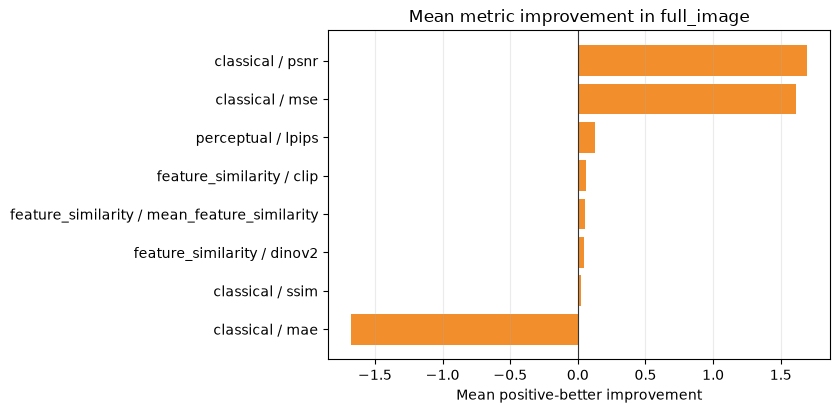

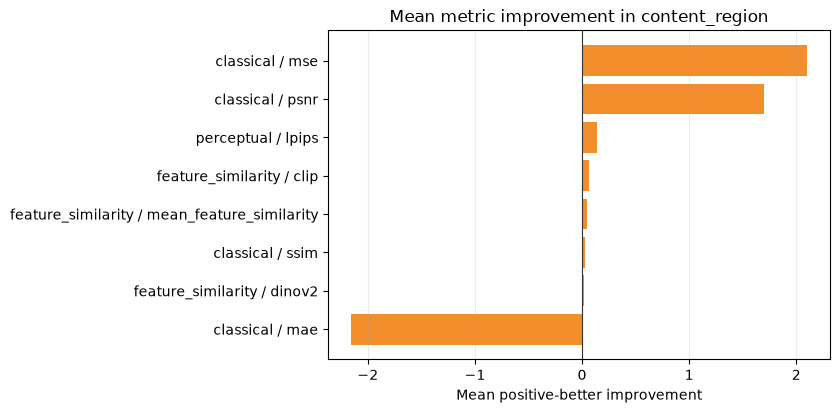

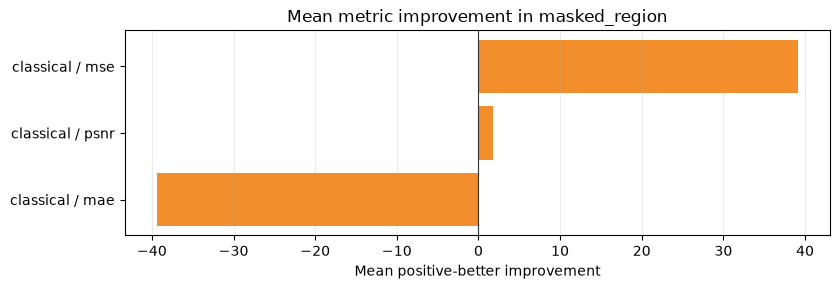

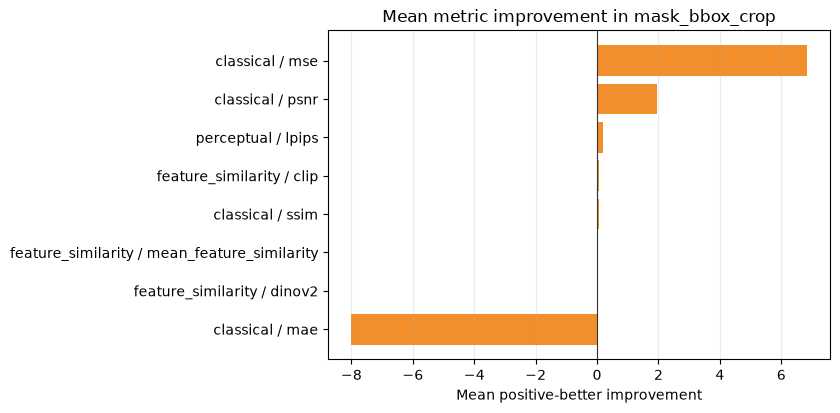

In [25]:
# Region-aware metric-family comparison plot

region_plot_df = region_metric_long_df.copy()
region_plot_df["improvement_value"] = pd.to_numeric(
    region_plot_df["improvement_value"],
    errors="coerce",
)

region_plot_df = region_plot_df.dropna(
    subset=[
        "metric_family",
        "metric_name",
        "report_region",
        "improvement_value",
    ]
)

if not region_plot_df.empty:
    compact_region_summary_df = (
        region_plot_df
        .groupby(
            [
                "metric_family",
                "metric_name",
                "report_region",
            ],
            dropna=False,
        )
        .agg(
            mean_improvement=("improvement_value", "mean"),
            positive_rate=("improvement_value", lambda values: float(values.gt(0).mean())),
            rows=("improvement_value", "size"),
        )
        .reset_index()
    )

    compact_region_summary_df["metric_label"] = (
        compact_region_summary_df["metric_family"].astype(str)
        + " / "
        + compact_region_summary_df["metric_name"].astype(str)
    )

    for region_name in [
        "full_image",
        "content_region",
        "masked_region",
        "mask_bbox_crop",
    ]:
        region_slice_df = compact_region_summary_df.loc[
            compact_region_summary_df["report_region"].astype(str).eq(region_name)
        ].copy()

        if region_slice_df.empty:
            continue

        plot_horizontal_bar(
            region_slice_df,
            label_column="metric_label",
            value_column="mean_improvement",
            title=f"Mean metric improvement in {region_name}",
            xlabel="Mean positive-better improvement",
            output_path=REPORT_FIGURE_DIR / f"opencv_report_metric_family_{region_name}.png",
            color="#F28E2B",
        )

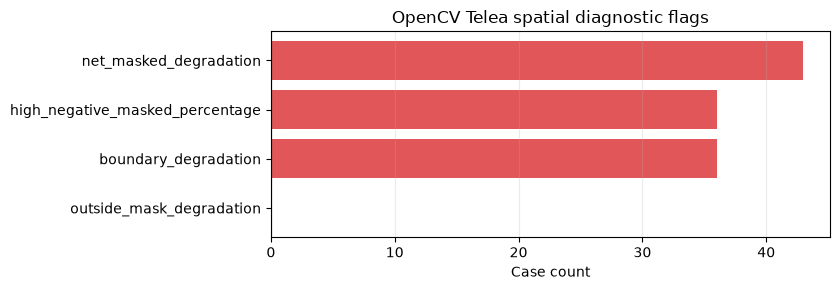

,report_mask_type,mean_spatial_flag_count,cases_with_any_spatial_flag,cases
0,,0.7188,43,160
1,loss_large,0.0000,0,50
2,loss_small,0.0000,0,50
3,mixed_damage,0.0000,0,50
4,scratch_thin,0.0000,0,50
5,zero_control,0.0000,0,50


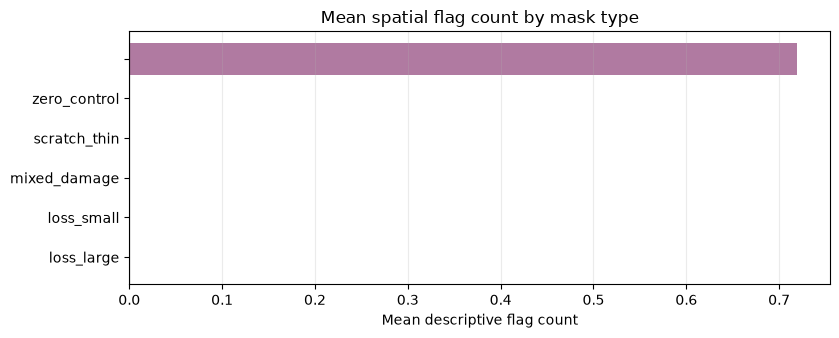

In [26]:
# Spatial-flag evidence plots

spatial_flag_columns = [
    column
    for column in [
        "spatial_flag_net_masked_degradation",
        "spatial_flag_boundary_degradation",
        "spatial_flag_outside_mask_degradation",
        "spatial_flag_high_negative_masked_percentage",
    ]
    if column in report_case_metrics_df.columns
]

if spatial_flag_columns:
    spatial_flag_summary_df = pd.DataFrame(
        [
            {
                "flag": column.replace("spatial_flag_", ""),
                "cases": int(report_case_metrics_df[column].astype(bool).sum()),
            }
            for column in spatial_flag_columns
        ]
    )

    plot_horizontal_bar(
        spatial_flag_summary_df,
        label_column="flag",
        value_column="cases",
        title="OpenCV Telea spatial diagnostic flags",
        xlabel="Case count",
        output_path=REPORT_FIGURE_DIR / "opencv_report_spatial_flag_counts.png",
        color="#E15759",
    )

if "spatial_spatial_flag_count" in report_case_metrics_df.columns:
    flag_by_mask_df = (
        report_case_metrics_df
        .assign(
            spatial_flag_count_numeric=lambda df: pd.to_numeric(
                df["spatial_spatial_flag_count"],
                errors="coerce",
            )
        )
        .groupby("report_mask_type", dropna=False)
        .agg(
            mean_spatial_flag_count=("spatial_flag_count_numeric", "mean"),
            cases_with_any_spatial_flag=("spatial_flag_count_numeric", lambda values: int(values.gt(0).sum())),
            cases=("report_case_id", "nunique"),
        )
        .reset_index()
        .round(4)
    )

    display(flag_by_mask_df)

    plot_horizontal_bar(
        flag_by_mask_df,
        label_column="report_mask_type",
        value_column="mean_spatial_flag_count",
        title="Mean spatial flag count by mask type",
        xlabel="Mean descriptive flag count",
        output_path=REPORT_FIGURE_DIR / "opencv_report_mean_spatial_flags_by_mask_type.png",
        color="#B07AA1",
    )

In [27]:
# Representative-case selection

def select_representative_cases(
    dataframe: pd.DataFrame,
    *,
    maximum_cases: int = 12,
) -> pd.DataFrame:
    df = dataframe.copy()

    candidate_score_columns = [
        "classical_mse_improvement_masked_region",
        "classical_ssim_improvement_masked_region",
        "lpips_lpips_improvement_mask_bbox_crop",
        "feature_mean_similarity_improvement_mask_bbox_crop",
        "spatial_improvement_masked_mean",
    ]

    available_score_columns = [
        column
        for column in candidate_score_columns
        if column in df.columns
    ]

    for column in available_score_columns:
        df[column] = pd.to_numeric(
            df[column],
            errors="coerce",
        )

    if available_score_columns:
        df["representative_score"] = df[available_score_columns].mean(
            axis=1,
            skipna=True,
        )
    else:
        df["representative_score"] = np.nan

    if "spatial_spatial_flag_count" in df.columns:
        df["spatial_flag_count_numeric"] = pd.to_numeric(
            df["spatial_spatial_flag_count"],
            errors="coerce",
        ).fillna(0)
    else:
        df["spatial_flag_count_numeric"] = 0

    selected_frames = []

    for mask_type, mask_df in df.groupby("report_mask_type", dropna=False):
        mask_df = mask_df.copy()

        if mask_df.empty:
            continue

        best_df = mask_df.sort_values(
            "representative_score",
            ascending=False,
            na_position="last",
        ).head(1)

        weakest_df = mask_df.sort_values(
            "representative_score",
            ascending=True,
            na_position="last",
        ).head(1)

        flagged_df = mask_df.sort_values(
            [
                "spatial_flag_count_numeric",
                "representative_score",
            ],
            ascending=[False, True],
            na_position="last",
        ).head(1)

        selected_frames.extend(
            [
                best_df.assign(selection_reason="strong_metric_improvement"),
                weakest_df.assign(selection_reason="weak_or_negative_metric_improvement"),
                flagged_df.assign(selection_reason="spatial_diagnostic_flag"),
            ]
        )

    selected_df = (
        pd.concat(selected_frames, ignore_index=True)
        .drop_duplicates(subset=["report_case_id"])
        .sort_values(
            [
                "report_mask_type",
                "selection_reason",
                "report_case_id",
            ],
            kind="stable",
        )
        .head(maximum_cases)
        .reset_index(drop=True)
    )

    return selected_df


representative_cases_df = select_representative_cases(
    report_case_metrics_df,
    maximum_cases=12,
)

display(
    representative_cases_df[
        available_columns(
            representative_cases_df,
            [
                "report_case_id",
                "report_dataset_name",
                "report_painting_id",
                "report_mask_type",
                "selection_reason",
                "representative_score",
                "spatial_flag_count_numeric",
                "clean_path",
                "damaged_path",
                "mask_path",
                "restored_path",
                "difference_map_figure_path",
            ],
        )
    ]
)

,report_case_id,report_dataset_name,report_painting_id,report_mask_type,selection_reason,representative_score,spatial_flag_count_numeric,clean_path,damaged_path,mask_path,restored_path,difference_map_figure_path
0,opencv_telea__synthetic_degradation__synthetic...,synthetic_degradation,p001,,spatial_diagnostic_flag,NaN,3,data/processed/clean/p001_clean.png,data/processed/degraded/synthetic_degradation/...,data/processed/masks/synthetic_degradation/p00...,data/processed/restored/opencv_telea/synthetic...,outputs/figures/opencv_difference_maps/all_cas...
1,opencv_telea__damage_size__damage_size__p001__...,damage_size,p001,,strong_metric_improvement,NaN,0,data/processed/clean/p001_clean.png,data/processed/damaged/damage_size_sensitivity...,data/processed/masks/damage_size_sensitivity/p...,data/processed/restored/opencv_telea/damage_si...,outputs/figures/opencv_difference_maps/all_cas...
2,opencv_telea__canonical__canonical__p001_loss_...,canonical,p001,loss_large,strong_metric_improvement,NaN,0,data/processed/clean/p001_clean.png,data/processed/masked/p001_loss_large_damaged.png,data/processed/masks/p001_loss_large_mask.png,data/processed/restored/opencv_telea/canonical...,outputs/figures/opencv_difference_maps/all_cas...
3,opencv_telea__canonical__canonical__p001_loss_...,canonical,p001,loss_small,strong_metric_improvement,NaN,0,data/processed/clean/p001_clean.png,data/processed/masked/p001_loss_small_damaged.png,data/processed/masks/p001_loss_small_mask.png,data/processed/restored/opencv_telea/canonical...,outputs/figures/opencv_difference_maps/all_cas...
4,opencv_telea__canonical__canonical__p001_mixed...,canonical,p001,mixed_damage,strong_metric_improvement,NaN,0,data/processed/clean/p001_clean.png,data/processed/masked/p001_mixed_damage_damage...,data/processed/masks/p001_mixed_damage_mask.png,data/processed/restored/opencv_telea/canonical...,outputs/figures/opencv_difference_maps/all_cas...
5,opencv_telea__canonical__canonical__p001_scrat...,canonical,p001,scratch_thin,strong_metric_improvement,NaN,0,data/processed/clean/p001_clean.png,data/processed/masked/p001_scratch_thin_damage...,data/processed/masks/p001_scratch_thin_mask.png,data/processed/restored/opencv_telea/canonical...,outputs/figures/opencv_difference_maps/all_cas...
6,opencv_telea__canonical__canonical__p001_zero_...,canonical,p001,zero_control,strong_metric_improvement,NaN,0,data/processed/clean/p001_clean.png,data/processed/masked/p001_zero_control_damage...,data/processed/masks/p001_zero_control_mask.png,data/processed/restored/opencv_telea/canonical...,outputs/figures/opencv_difference_maps/all_cas...


,report_case_id,selection_reason,representative_panel_path
0,opencv_telea__synthetic_degradation__synthetic...,spatial_diagnostic_flag,outputs/figures/opencv_report_generation/repre...
1,opencv_telea__damage_size__damage_size__p001__...,strong_metric_improvement,outputs/figures/opencv_report_generation/repre...
2,opencv_telea__canonical__canonical__p001_loss_...,strong_metric_improvement,outputs/figures/opencv_report_generation/repre...
3,opencv_telea__canonical__canonical__p001_loss_...,strong_metric_improvement,outputs/figures/opencv_report_generation/repre...
4,opencv_telea__canonical__canonical__p001_mixed...,strong_metric_improvement,outputs/figures/opencv_report_generation/repre...
5,opencv_telea__canonical__canonical__p001_scrat...,strong_metric_improvement,outputs/figures/opencv_report_generation/repre...
6,opencv_telea__canonical__canonical__p001_zero_...,strong_metric_improvement,outputs/figures/opencv_report_generation/repre...


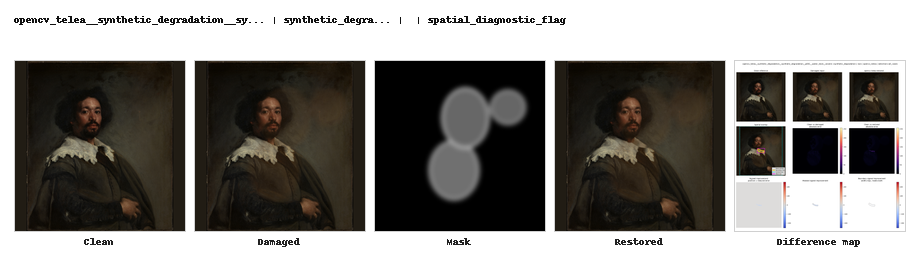

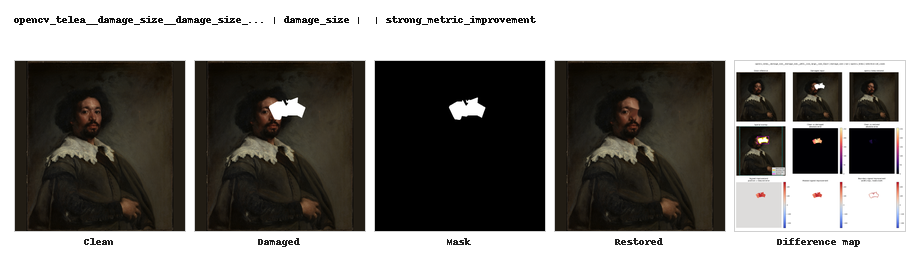

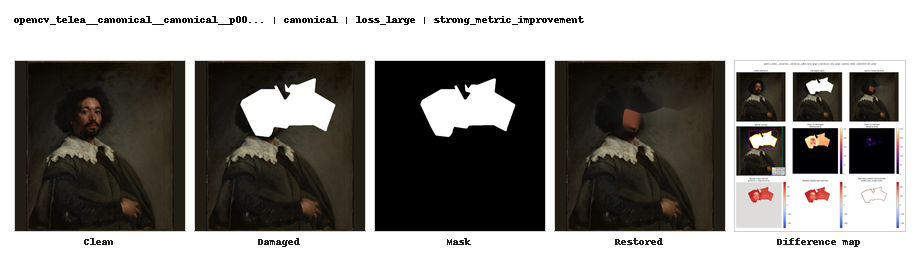

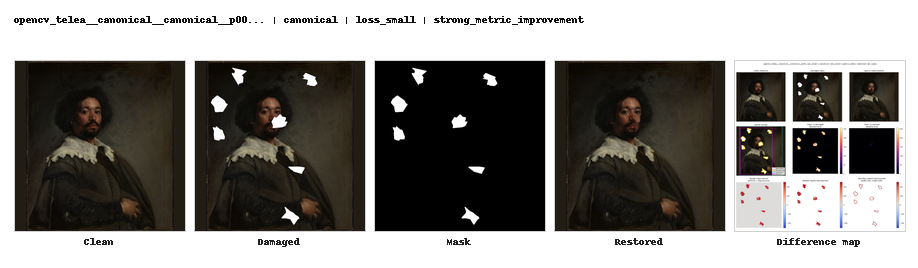

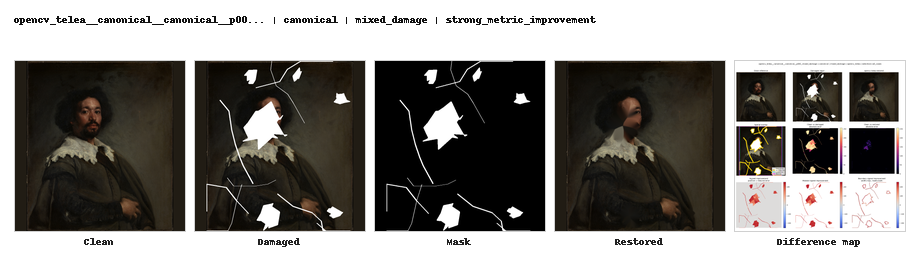

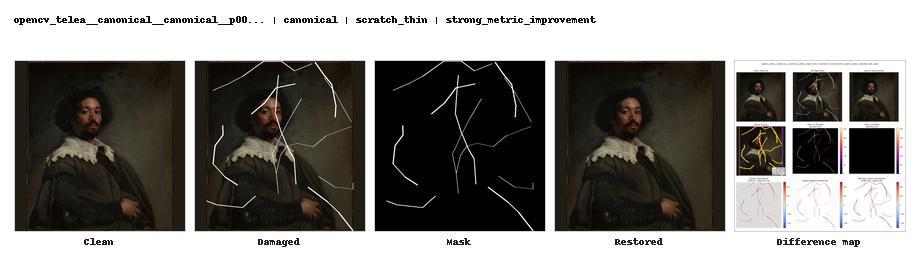

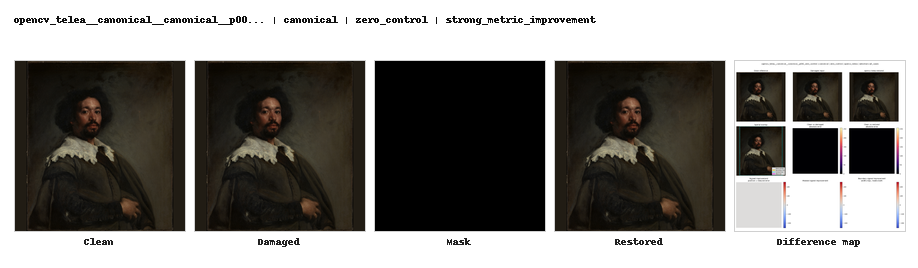

In [33]:
# Create compact representative image panels - corrected deterministic PIL version

from PIL import Image, ImageDraw, ImageFont, ImageOps
import re


def safe_filename_token(value: Any) -> str:
    value_text = str(value).strip()
    value_text = re.sub(r"[^A-Za-z0-9_.-]+", "_", value_text)
    return value_text.strip("_") or "case"


def resolve_project_path(
    value: Any,
) -> Path | None:
    if pd.isna(value):
        return None

    value_text = str(value).strip()

    if value_text == "":
        return None

    path = Path(value_text)

    if not path.is_absolute():
        path = PROJECT_ROOT / path

    return path


def load_font(size: int, *, bold: bool = False) -> ImageFont.ImageFont:
    font_candidates = [
        "/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf" if bold else "/usr/share/fonts/truetype/dejavu/DejaVuSans.ttf",
        "/usr/share/fonts/truetype/liberation2/LiberationSans-Bold.ttf" if bold else "/usr/share/fonts/truetype/liberation2/LiberationSans-Regular.ttf",
    ]

    for font_path in font_candidates:
        if Path(font_path).is_file():
            return ImageFont.truetype(font_path, size=size)

    return ImageFont.load_default()


def fit_image_on_canvas(
    path_value: Any,
    *,
    size: tuple[int, int],
    background: str = "white",
) -> Image.Image:
    path = resolve_project_path(path_value)

    canvas = Image.new("RGB", size, background)

    if path is None or not path.is_file():
        return ImageOps.expand(canvas, border=1, fill="#D0D0D0")

    image = Image.open(path)
    image = ImageOps.exif_transpose(image).convert("RGB")
    image.thumbnail(size, Image.LANCZOS)

    paste_x = (size[0] - image.width) // 2
    paste_y = (size[1] - image.height) // 2
    canvas.paste(image, (paste_x, paste_y))

    return ImageOps.expand(canvas, border=1, fill="#D0D0D0")


def draw_centered_text(
    draw: ImageDraw.ImageDraw,
    text: str,
    box: tuple[int, int, int, int],
    font: ImageFont.ImageFont,
    fill: str = "#222222",
) -> None:
    left, top, right, bottom = box
    text_box = draw.textbbox((0, 0), text, font=font)
    text_width = text_box[2] - text_box[0]
    text_height = text_box[3] - text_box[1]

    x = left + ((right - left) - text_width) // 2
    y = top + ((bottom - top) - text_height) // 2

    draw.text((x, y), text, font=font, fill=fill)


def shorten_text(
    value: Any,
    *,
    max_chars: int,
) -> str:
    value_text = "" if pd.isna(value) else str(value).strip()

    value_text = (
        value_text
        .replace("…", "...")
        .replace("–", "-")
        .replace("—", "-")
        .replace("“", '"')
        .replace("”", '"')
        .replace("’", "'")
    )

    value_text = value_text.encode("latin-1", errors="replace").decode("latin-1")

    if len(value_text) <= max_chars:
        return value_text

    return value_text[: max_chars - 3].rstrip() + "..."


def build_representative_case_panel(
    row: pd.Series,
    output_path: Path,
) -> None:
    panel_items = [
        ("Clean", row.get("clean_path", "")),
        ("Damaged", row.get("damaged_path", "")),
        ("Mask", row.get("mask_path", "")),
        ("Restored", row.get("restored_path", "")),
        ("Difference map", row.get("difference_map_figure_path", "")),
    ]

    tile_size = (170, 170)
    gap = 10
    margin = 14
    title_height = 46
    label_height = 24

    width = (
        (2 * margin)
        + (len(panel_items) * tile_size[0])
        + ((len(panel_items) - 1) * gap)
    )
    height = (
        margin
        + title_height
        + tile_size[1]
        + label_height
        + margin
    )

    canvas = Image.new("RGB", (width, height), "white")
    draw = ImageDraw.Draw(canvas)

    title_font = load_font(12, bold=True)
    label_font = load_font(10, bold=False)

    title_text = " | ".join(
        [
            shorten_text(row.get("report_case_id", ""), max_chars=42),
            shorten_text(row.get("report_dataset_name", ""), max_chars=18),
            shorten_text(row.get("report_mask_type", ""), max_chars=24),
            shorten_text(row.get("selection_reason", ""), max_chars=32),
        ]
    )

    draw.text(
        (margin, margin),
        title_text,
        font=title_font,
        fill="#111111",
    )

    x = margin
    image_y = margin + title_height
    label_y = image_y + tile_size[1]

    for label, path_value in panel_items:
        tile = fit_image_on_canvas(
            path_value,
            size=tile_size,
        )

        canvas.paste(tile, (x, image_y))

        draw_centered_text(
            draw,
            label,
            (x, label_y, x + tile_size[0], label_y + label_height),
            font=label_font,
        )

        x += tile_size[0] + gap

    output_path.parent.mkdir(parents=True, exist_ok=True)
    canvas.save(output_path, format="PNG", optimize=True)


panel_paths = []

for _, row in representative_cases_df.iterrows():
    panel_path = (
        REPRESENTATIVE_CASE_PANEL_DIR
        / f"{safe_filename_token(row['report_case_id'])}_representative_panel.png"
    )

    build_representative_case_panel(
        row,
        panel_path,
    )

    panel_paths.append(
        normalize_report_path(panel_path)
    )

representative_cases_df["representative_panel_path"] = panel_paths

display(
    representative_cases_df[
        [
            "report_case_id",
            "selection_reason",
            "representative_panel_path",
        ]
    ]
)

from IPython.display import display as notebook_display
from IPython.display import Image as NotebookImage

for panel_path in panel_paths:
    resolved_panel_path = resolve_project_path(panel_path)

    if resolved_panel_path is not None and resolved_panel_path.is_file():
        notebook_display(NotebookImage(filename=str(resolved_panel_path)))

In [34]:
# Persist Batch 4 manifests

representative_manifest_columns = available_columns(
    representative_cases_df,
    [
        "report_case_id",
        "report_dataset_name",
        "report_painting_id",
        "report_title",
        "report_artist",
        "report_mask_type",
        "selection_reason",
        "representative_score",
        "spatial_flag_count_numeric",
        "clean_path",
        "damaged_path",
        "mask_path",
        "restored_path",
        "difference_map_figure_path",
        "representative_panel_path",
    ],
)

representative_cases_df[representative_manifest_columns].to_csv(
    REPRESENTATIVE_CASE_MANIFEST_OUTPUT_PATH,
    index=False,
)

report_figure_manifest_df = pd.DataFrame(report_figure_records)

if not report_figure_manifest_df.empty:
    report_figure_manifest_df.to_csv(
        REPORT_FIGURE_MANIFEST_OUTPUT_PATH,
        index=False,
    )

batch_4_output_inventory_df = pd.DataFrame(
    [
        describe_artifact(
            "representative_case_manifest",
            REPRESENTATIVE_CASE_MANIFEST_OUTPUT_PATH,
            required=True,
        ),
        describe_artifact(
            "report_figure_manifest",
            REPORT_FIGURE_MANIFEST_OUTPUT_PATH,
            required=True,
        ),
        describe_artifact(
            "report_figure_dir",
            REPORT_FIGURE_DIR,
            required=True,
        ),
        describe_artifact(
            "representative_case_panel_dir",
            REPRESENTATIVE_CASE_PANEL_DIR,
            required=True,
        ),
    ]
)

display(batch_4_output_inventory_df)

,artifact_name,required,artifact_kind,path,exists,file_size_bytes,sha256
0,representative_case_manifest,True,file,outputs/reports/opencv_telea_report_representa...,True,5135.0,85287a2bcb2f94cf8b63bc08ab77779a1a8942f820aee1...
1,report_figure_manifest,True,file,outputs/reports/opencv_telea_report_figure_man...,True,1359.0,a108a6261d4a51cd6fa4ceedefdd5d5d64cd503e97b764...
2,report_figure_dir,True,directory,outputs/figures/opencv_report_generation,True,NaN,
3,representative_case_panel_dir,True,directory,outputs/figures/opencv_report_generation/repre...,True,NaN,


In [35]:
# Batch 4 validation

batch_4_validation_df = pd.DataFrame(
    [
        build_check(
            "report_figures_created",
            len(report_figure_manifest_df),
            "> 0",
            len(report_figure_manifest_df) > 0,
        ),
        build_check(
            "representative_cases_selected",
            len(representative_cases_df),
            "> 0",
            len(representative_cases_df) > 0,
        ),
        build_check(
            "representative_panels_created",
            int(
                representative_cases_df["representative_panel_path"]
                .map(resolve_project_path)
                .map(lambda path: bool(path is not None and path.is_file()))
                .sum()
            ),
            len(representative_cases_df),
            bool(
                representative_cases_df["representative_panel_path"]
                .map(resolve_project_path)
                .map(lambda path: bool(path is not None and path.is_file()))
                .all()
            ),
        ),
        build_check(
            "batch_4_outputs_written",
            int(batch_4_output_inventory_df["exists"].astype(bool).sum()),
            len(batch_4_output_inventory_df),
            bool(batch_4_output_inventory_df["exists"].astype(bool).all()),
        ),
    ]
)

display(batch_4_validation_df)

if not batch_4_validation_df["passed"].astype(bool).all():
    raise RuntimeError(
        "Notebook 13 Batch 4 validation failed."
    )

print(
    "Notebook 13 Batch 4 complete: report figures, spatial plots, representative-case panels, and manifests are written."
)

,check,actual,expected,passed
0,report_figures_created,6,> 0,True
1,representative_cases_selected,7,> 0,True
2,representative_panels_created,7,7,True
3,batch_4_outputs_written,4,4,True


Notebook 13 Batch 4 complete: report figures, spatial plots, representative-case panels, and manifests are written.


In [64]:
# Batch 5: Concise report narrative in Markdown and HTML

from datetime import datetime
from html import escape
from IPython.display import Markdown, display as notebook_display


REPORT_MARKDOWN_OUTPUT_PATH = Path(
    globals().get(
        "REPORT_MARKDOWN_OUTPUT_PATH",
        REPORTS_DIR / "opencv_telea_report.md",
    )
)

REPORT_HTML_OUTPUT_PATH = Path(
    globals().get(
        "REPORT_HTML_OUTPUT_PATH",
        REPORTS_DIR / "opencv_telea_report.html",
    )
)

REPORT_ASSET_INDEX_OUTPUT_PATH = Path(
    globals().get(
        "REPORT_ASSET_INDEX_OUTPUT_PATH",
        REPORTS_DIR / "opencv_telea_report_asset_index.csv",
    )
)

REPORTS_DIR.mkdir(parents=True, exist_ok=True)

In [65]:
# Batch 5: Detailed explanatory report narrative helpers

import os
from datetime import datetime
from html import escape
from IPython.display import Markdown, display as notebook_display
from IPython.display import Image as NotebookImage


def format_number(value: Any, digits: int = 4) -> str:
    if pd.isna(value):
        return ""

    if isinstance(value, (int, np.integer)):
        return str(int(value))

    if isinstance(value, (float, np.floating)):
        return f"{float(value):.{digits}f}"

    return str(value)


def available_columns(dataframe: pd.DataFrame, columns: list[str]) -> list[str]:
    return [column for column in columns if column in dataframe.columns]


def dataframe_to_markdown_table(
    dataframe: pd.DataFrame,
    *,
    max_rows: int = 25,
) -> str:
    if dataframe is None or dataframe.empty:
        return "_No rows available._"

    display_df = dataframe.head(max_rows).copy()

    headers = list(display_df.columns)
    markdown_lines = [
        "| " + " | ".join(headers) + " |",
        "| " + " | ".join(["---"] * len(headers)) + " |",
    ]

    for _, row in display_df.iterrows():
        values = [
            str(format_number(row[column])).replace("|", "/")
            for column in headers
        ]
        markdown_lines.append("| " + " | ".join(values) + " |")

    if len(dataframe) > max_rows:
        markdown_lines.append(
            f"\n_Showing {max_rows} of {len(dataframe)} rows._"
        )

    return "\n".join(markdown_lines)


def resolve_existing_asset_path(path_value: Any) -> Path | None:
    if pd.isna(path_value):
        return None

    value_text = str(path_value).strip()

    if value_text == "":
        return None

    raw_path = Path(value_text)
    candidates = []

    if raw_path.is_absolute():
        candidates.append(raw_path)
    else:
        candidates.extend(
            [
                PROJECT_ROOT / raw_path,
                REPORTS_DIR / raw_path,
                REPORT_MARKDOWN_OUTPUT_PATH.parent / raw_path,
            ]
        )

    for candidate in candidates:
        candidate = candidate.resolve()
        if candidate.is_file():
            return candidate

    return candidates[0].resolve() if candidates else None


def path_for_report_asset(path_value: Any) -> str:
    asset_path = resolve_existing_asset_path(path_value)

    if asset_path is None:
        return ""

    return os.path.relpath(
        asset_path,
        start=REPORT_MARKDOWN_OUTPUT_PATH.parent,
    ).replace("\\", "/")


def figure_markdown_block(
    figure_path: Any,
    *,
    caption: str,
) -> str:
    figure_ref = path_for_report_asset(figure_path)

    if figure_ref == "":
        return ""

    return f"![{caption}]({figure_ref})\n\n_{caption}_"


def describe_metric_direction(metric_name: str) -> str:
    metric_name_lower = str(metric_name).lower()

    if any(token in metric_name_lower for token in ["mse", "mae", "lpips"]):
        return "Lower values are better, so positive improvement means the restoration reduced error relative to the damaged input."

    if any(token in metric_name_lower for token in ["psnr", "ssim", "clip", "dino", "similarity"]):
        return "Higher values are better, so positive improvement means the restoration moved closer to the clean reference."

    return "Positive improvement is interpreted according to the metric-specific direction configured upstream."


def section_status(name: str, available: bool, detail: str) -> dict[str, Any]:
    return {
        "planned_report_item": name,
        "available_in_batch": bool(available),
        "report_handling": detail,
    }

In [66]:
# Batch 5: Evidence coverage and compact tables

dataset_report_columns = available_columns(
    report_summary_by_dataset_df,
    [
        "report_dataset_name",
        "cases",
        "nonzero_cases",
        "difference_map_cases",
        "mean_masked_mse_improvement",
        "mean_masked_ssim_improvement",
        "mean_mask_bbox_lpips_improvement",
        "mean_mask_bbox_dinov2_improvement",
        "mean_spatial_flag_count",
        "cases_with_spatial_flags",
    ],
)

mask_report_columns = available_columns(
    report_summary_by_mask_type_df,
    [
        "report_mask_type",
        "cases",
        "nonzero_cases",
        "difference_map_cases",
        "mean_masked_mse_improvement",
        "mean_masked_ssim_improvement",
        "mean_mask_bbox_lpips_improvement",
        "mean_mask_bbox_dinov2_improvement",
        "mean_spatial_flag_count",
        "cases_with_spatial_flags",
    ],
)

region_report_columns = available_columns(
    report_summary_by_region_df,
    [
        "metric_family",
        "metric_name",
        "report_region",
        "rows",
        "cases",
        "mean_improvement",
        "median_improvement",
        "positive_rate",
        "negative_rate",
    ],
)

failure_report_columns = available_columns(
    runtime_failure_summary_df,
    [
        "stage",
        "status",
        "cases",
        "rows",
        "failure_count",
        "error_count",
        "message",
    ],
)

representative_report_columns = available_columns(
    representative_cases_df,
    [
        "report_case_id",
        "report_dataset_name",
        "report_painting_id",
        "report_mask_type",
        "selection_reason",
        "representative_score",
        "spatial_flag_count_numeric",
        "representative_panel_path",
    ],
)

texture_colour_seam_columns = available_columns(
    report_case_metrics_df,
    [
        "texture_flag",
        "texture_category",
        "colour_flag",
        "color_flag",
        "seam_flag",
        "boundary_flag",
        "outside_mask_flag",
        "spatial_flag_count_numeric",
        "mean_spatial_flag_count",
        "cases_with_spatial_flags",
    ],
)

batch_5_evidence_coverage_df = pd.DataFrame(
    [
        section_status(
            "consolidate_opencv_metrics",
            not report_case_metrics_df.empty,
            "Included through case-level metric table references plus dataset, mask-type, and region summaries.",
        ),
        section_status(
            "runtime_and_failure_information",
            not runtime_failure_summary_df.empty,
            "Included as a dedicated runtime and failure section.",
        ),
        section_status(
            "region_aware_results",
            not report_summary_by_region_df.empty,
            "Included as a dedicated region-aware metric section.",
        ),
        section_status(
            "difference_maps",
            bool(
                "report_has_difference_map" in report_case_metrics_df.columns
                and report_case_metrics_df["report_has_difference_map"].astype(bool).any()
            ),
            "Included through figure manifest and representative-case panels.",
        ),
        section_status(
            "representative_cases",
            not representative_cases_df.empty,
            "Included as a table plus embedded representative panels.",
        ),
        section_status(
            "texture_colour_seam_evidence",
            len(texture_colour_seam_columns) > 0,
            "Included when columns exist; otherwise explicitly marked as unavailable/preliminary.",
        ),
        section_status(
            "standardized_report_assets",
            not batch_4_output_inventory_df.empty,
            "Included through report figure manifest, representative manifest, and Batch 5 asset index.",
        ),
        section_status(
            "avoid_final_trustworthiness_conclusion",
            True,
            "Handled through a dedicated interpretation caveat and next-step section.",
        ),
    ]
)

display(batch_5_evidence_coverage_df)

,planned_report_item,available_in_batch,report_handling
0,consolidate_opencv_metrics,True,Included through case-level metric table refer...
1,runtime_and_failure_information,True,Included as a dedicated runtime and failure se...
2,region_aware_results,True,Included as a dedicated region-aware metric se...
3,difference_maps,True,Included through figure manifest and represent...
4,representative_cases,True,Included as a table plus embedded representati...
5,texture_colour_seam_evidence,False,Included when columns exist; otherwise explici...
6,standardized_report_assets,True,"Included through report figure manifest, repre..."
7,avoid_final_trustworthiness_conclusion,True,Handled through a dedicated interpretation cav...


In [67]:
# Batch 5: Build detailed figure sections

figure_sections = []

if not report_figure_manifest_df.empty and "path" in report_figure_manifest_df.columns:
    for _, row in report_figure_manifest_df.iterrows():
        figure_path = row.get("path", "")
        figure_name = row.get("artifact_name", Path(str(figure_path)).stem)
        caption = str(figure_name).replace("_", " ")

        block = figure_markdown_block(
            figure_path,
            caption=caption,
        )

        if block:
            figure_sections.append(block)

representative_panel_sections = []

if "representative_panel_path" in representative_cases_df.columns:
    for _, row in representative_cases_df.head(12).iterrows():
        panel_path = row.get("representative_panel_path", "")
        caption = (
            f"{row.get('report_case_id', '')}: "
            f"{row.get('selection_reason', '')}"
        )

        block = figure_markdown_block(
            panel_path,
            caption=caption,
        )

        if block:
            representative_panel_sections.append(block)

print(f"Report figures linked: {len(figure_sections)}")
print(f"Representative panels linked: {len(representative_panel_sections)}")

Report figures linked: 6
Representative panels linked: 7


In [69]:
# Repair: generate missing OpenCV report figures, robust to missing spatial diagnostics

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

OPENCV_REPORT_FIGURE_DIR = PROJECT_ROOT / "outputs" / "figures" / "opencv_report_generation"
OPENCV_REPRESENTATIVE_PANEL_DIR = OPENCV_REPORT_FIGURE_DIR / "representative_cases"

OPENCV_REPORT_FIGURE_DIR.mkdir(parents=True, exist_ok=True)
OPENCV_REPRESENTATIVE_PANEL_DIR.mkdir(parents=True, exist_ok=True)


def save_current_figure(path: Path) -> Path:
    path.parent.mkdir(parents=True, exist_ok=True)
    plt.tight_layout()
    plt.savefig(path, dpi=180, bbox_inches="tight")
    plt.close()
    return path


def save_unavailable_figure(output_path: Path, title: str, reason: str) -> Path:
    output_path.parent.mkdir(parents=True, exist_ok=True)

    plt.figure(figsize=(9, 4.5))
    plt.axis("off")
    plt.text(
        0.5,
        0.58,
        title,
        ha="center",
        va="center",
        fontsize=15,
        weight="bold",
    )
    plt.text(
        0.5,
        0.42,
        reason,
        ha="center",
        va="center",
        fontsize=11,
        wrap=True,
    )

    plt.savefig(output_path, dpi=180, bbox_inches="tight")
    plt.close()
    return output_path


def plot_metric_family_region(metric_region_df, region_name: str, output_name: str) -> Path:
    output_path = OPENCV_REPORT_FIGURE_DIR / output_name

    required = {"metric_family", "report_region", "mean_improvement"}
    missing = required - set(metric_region_df.columns)

    if metric_region_df.empty or missing:
        return save_unavailable_figure(
            output_path,
            f"Metric Family Summary Unavailable: {region_name}",
            f"Required data is missing. Missing columns: {sorted(missing)}",
        )

    plot_df = metric_region_df[
        metric_region_df["report_region"].astype(str).eq(region_name)
    ].copy()

    if plot_df.empty:
        return save_unavailable_figure(
            output_path,
            f"Metric Family Summary Unavailable: {region_name}",
            f"No rows found for report_region={region_name!r}.",
        )

    family_summary = (
        plot_df.groupby("metric_family", dropna=False)["mean_improvement"]
        .mean()
        .reset_index()
        .sort_values("mean_improvement", ascending=True)
    )

    plt.figure(figsize=(9, max(4, 0.45 * len(family_summary))))
    colors = np.where(family_summary["mean_improvement"] >= 0, "#2a9d8f", "#e76f51")

    plt.barh(
        family_summary["metric_family"].astype(str),
        family_summary["mean_improvement"],
        color=colors,
    )

    plt.axvline(0, color="#222", linewidth=0.8)
    plt.xlabel("Mean improvement")
    plt.ylabel("Metric family")
    plt.title(f"OpenCV Telea Mean Improvement by Metric Family: {region_name}")
    plt.grid(axis="x", alpha=0.25)

    return save_current_figure(output_path)


def infer_spatial_flag_count_column(case_df: pd.DataFrame) -> str | None:
    if "spatial_flag_count_numeric" in case_df.columns:
        case_df["spatial_flag_count_numeric"] = (
            pd.to_numeric(case_df["spatial_flag_count_numeric"], errors="coerce")
            .fillna(0)
            .astype(int)
        )
        return "spatial_flag_count_numeric"

    if "spatial_flag_count" in case_df.columns:
        case_df["spatial_flag_count_numeric"] = (
            pd.to_numeric(case_df["spatial_flag_count"], errors="coerce")
            .fillna(0)
            .astype(int)
        )
        return "spatial_flag_count_numeric"

    likely_flag_columns = [
        column
        for column in case_df.columns
        if "flag" in column.lower()
        and "count" not in column.lower()
        and any(
            keyword in column.lower()
            for keyword in [
                "spatial",
                "seam",
                "colour",
                "color",
                "texture",
                "artifact",
                "edge",
                "halo",
                "blur",
            ]
        )
    ]

    if not likely_flag_columns:
        return None

    derived_flags = []

    for column in likely_flag_columns:
        series = case_df[column]

        if pd.api.types.is_bool_dtype(series):
            derived_flags.append(series.fillna(False).astype(int))
        elif pd.api.types.is_numeric_dtype(series):
            derived_flags.append(series.fillna(0).astype(float).gt(0).astype(int))
        else:
            normalized = series.fillna("").astype(str).str.lower().str.strip()
            derived_flags.append(
                normalized.isin(
                    ["true", "1", "yes", "y", "flagged", "fail", "failed"]
                ).astype(int)
            )

    case_df["spatial_flag_count_numeric"] = pd.concat(derived_flags, axis=1).sum(axis=1)
    return "spatial_flag_count_numeric"


report_figure_rows = []

region_figure_specs = [
    ("full_image", "opencv_report_metric_family_full_image.png"),
    ("content_region", "opencv_report_metric_family_content_region.png"),
    ("masked_region", "opencv_report_metric_family_masked_region.png"),
    ("mask_bbox_crop", "opencv_report_metric_family_mask_bbox_crop.png"),
]

for region_name, filename in region_figure_specs:
    figure_path = plot_metric_family_region(
        report_summary_by_region_df,
        region_name,
        filename,
    )

    report_figure_rows.append(
        {
            "artifact_name": Path(filename).stem,
            "path": str(figure_path),
            "figure_type": "metric_family_region_summary",
            "report_region": region_name,
        }
    )


flag_column = infer_spatial_flag_count_column(report_case_metrics_df)

spatial_flag_output_path = OPENCV_REPORT_FIGURE_DIR / "opencv_report_spatial_flag_counts.png"
mean_spatial_by_mask_output_path = OPENCV_REPORT_FIGURE_DIR / "opencv_report_mean_spatial_flags_by_mask_type.png"

if flag_column is None:
    save_unavailable_figure(
        spatial_flag_output_path,
        "Spatial Diagnostic Flag Counts Unavailable",
        "No spatial flag count or spatial diagnostic flag columns were found in report_case_metrics_df.",
    )

    save_unavailable_figure(
        mean_spatial_by_mask_output_path,
        "Mean Spatial Flags by Mask Type Unavailable",
        "This figure requires spatial diagnostic flag evidence that is not present in the current OpenCV report dataframe.",
    )

    spatial_distribution_type = "spatial_flag_unavailable"
    mean_spatial_type = "spatial_flag_unavailable"

else:
    spatial_counts = (
        report_case_metrics_df[flag_column]
        .fillna(0)
        .astype(int)
        .value_counts()
        .sort_index()
    )

    plt.figure(figsize=(8, 4.5))
    plt.bar(spatial_counts.index.astype(str), spatial_counts.values, color="#457b9d")
    plt.xlabel("Spatial flag count")
    plt.ylabel("Cases")
    plt.title("OpenCV Telea Spatial Diagnostic Flag Counts")
    plt.grid(axis="y", alpha=0.25)

    save_current_figure(spatial_flag_output_path)

    spatial_distribution_type = "spatial_flag_distribution"

    if "report_mask_type" in report_case_metrics_df.columns:
        mean_spatial_by_mask = (
            report_case_metrics_df.groupby("report_mask_type", dropna=False)[flag_column]
            .mean()
            .reset_index()
            .sort_values(flag_column, ascending=True)
        )

        plt.figure(figsize=(9, max(4, 0.45 * len(mean_spatial_by_mask))))
        plt.barh(
            mean_spatial_by_mask["report_mask_type"].astype(str),
            mean_spatial_by_mask[flag_column],
            color="#6d597a",
        )
        plt.xlabel("Mean spatial flag count")
        plt.ylabel("Mask type")
        plt.title("OpenCV Telea Mean Spatial Diagnostic Flags by Mask Type")
        plt.grid(axis="x", alpha=0.25)

        save_current_figure(mean_spatial_by_mask_output_path)

        mean_spatial_type = "mean_spatial_flags_by_mask_type"
    else:
        save_unavailable_figure(
            mean_spatial_by_mask_output_path,
            "Mean Spatial Flags by Mask Type Unavailable",
            "report_mask_type is not present in report_case_metrics_df.",
        )

        mean_spatial_type = "spatial_flag_unavailable"


report_figure_rows.extend(
    [
        {
            "artifact_name": spatial_flag_output_path.stem,
            "path": str(spatial_flag_output_path),
            "figure_type": spatial_distribution_type,
            "report_region": "",
        },
        {
            "artifact_name": mean_spatial_by_mask_output_path.stem,
            "path": str(mean_spatial_by_mask_output_path),
            "figure_type": mean_spatial_type,
            "report_region": "",
        },
    ]
)

report_figure_manifest_df = pd.DataFrame(report_figure_rows)

display(report_figure_manifest_df)

,artifact_name,path,figure_type,report_region
0,opencv_report_metric_family_full_image,D:\Masters\FH\Thesis\painting-restoration-eval...,metric_family_region_summary,full_image
1,opencv_report_metric_family_content_region,D:\Masters\FH\Thesis\painting-restoration-eval...,metric_family_region_summary,content_region
2,opencv_report_metric_family_masked_region,D:\Masters\FH\Thesis\painting-restoration-eval...,metric_family_region_summary,masked_region
3,opencv_report_metric_family_mask_bbox_crop,D:\Masters\FH\Thesis\painting-restoration-eval...,metric_family_region_summary,mask_bbox_crop
4,opencv_report_spatial_flag_counts,D:\Masters\FH\Thesis\painting-restoration-eval...,spatial_flag_distribution,
5,opencv_report_mean_spatial_flags_by_mask_type,D:\Masters\FH\Thesis\painting-restoration-eval...,mean_spatial_flags_by_mask_type,


In [70]:
# Repair: generate representative case panels

from PIL import Image


def resolve_project_asset_path(path_value):
    if path_value is None or pd.isna(path_value):
        return None

    path_text = str(path_value).strip()

    if path_text == "":
        return None

    path_text = path_text.replace("\\", "/")
    direct_path = Path(path_text)

    candidates = []

    if direct_path.is_absolute():
        candidates.append(direct_path)
    else:
        candidates.extend(
            [
                PROJECT_ROOT / direct_path,
                PROJECT_ROOT.parent / direct_path,
                Path.cwd() / direct_path,
            ]
        )

    for marker in ["painting-restoration-eval/", "painting_restoration_eval/"]:
        if marker in path_text:
            relative_after_project = path_text.split(marker, 1)[1]
            candidates.append(PROJECT_ROOT / relative_after_project)

    for candidate in candidates:
        if candidate.is_file():
            return candidate.resolve()

    return candidates[0] if candidates else None


def safe_case_filename(value: str) -> str:
    value = str(value)
    value = value.replace("/", "_").replace("\\", "_").replace(":", "_")
    value = "".join(char if char.isalnum() or char in "._-" else "_" for char in value)
    while "__" in value:
        value = value.replace("__", "_")
    return value.strip("_")


def enrich_representative_cases_with_paths(representative_df, case_metrics_df):
    enriched_df = representative_df.copy()

    path_columns = [
        "clean_path",
        "damaged_path",
        "mask_path",
        "restored_path",
        "error_map_figure_path",
        "difference_map_path",
    ]

    missing_path_columns = [
        column
        for column in path_columns
        if column not in enriched_df.columns and column in case_metrics_df.columns
    ]

    if missing_path_columns:
        left_key = "report_case_id" if "report_case_id" in enriched_df.columns else "case_id"

        if "report_case_id" in case_metrics_df.columns:
            right_key = "report_case_id"
        elif "case_id" in case_metrics_df.columns:
            right_key = "case_id"
        else:
            right_key = None

        if right_key is not None:
            merge_columns = [right_key] + missing_path_columns
            enriched_df = enriched_df.merge(
                case_metrics_df[merge_columns].drop_duplicates(subset=[right_key]),
                left_on=left_key,
                right_on=right_key,
                how="left",
                suffixes=("", "_from_metrics"),
            )

            if right_key != left_key and right_key in enriched_df.columns:
                enriched_df = enriched_df.drop(columns=[right_key])

    return enriched_df


def load_image_for_panel(path_value, *, grayscale=False):
    resolved_path = resolve_project_asset_path(path_value)

    if resolved_path is None or not resolved_path.is_file():
        return None

    image = Image.open(resolved_path)

    if grayscale:
        return image.convert("L")

    return image.convert("RGB")


def create_representative_panel(row, output_path: Path):
    panel_items = [
        ("Clean", row.get("clean_path", "")),
        ("Damaged", row.get("damaged_path", "")),
        ("Mask", row.get("mask_path", "")),
        ("Restored", row.get("restored_path", "")),
    ]

    difference_path = row.get("difference_map_path", "")

    if not difference_path:
        difference_path = row.get("error_map_figure_path", "")

    panel_items.append(("Difference / Error", difference_path))

    images = []

    for label, path_value in panel_items:
        grayscale = label == "Mask"
        image = load_image_for_panel(path_value, grayscale=grayscale)
        images.append((label, image, path_value))

    available_count = sum(image is not None for _, image, _ in images)

    if available_count < 4:
        missing = [
            f"{label}: {path_value}"
            for label, image, path_value in images
            if image is None
        ]

        raise FileNotFoundError(
            "Cannot create representative panel because required images are missing: "
            + "; ".join(missing)
        )

    fig, axes = plt.subplots(1, len(images), figsize=(4 * len(images), 4.8))

    if len(images) == 1:
        axes = [axes]

    for axis, (label, image, _) in zip(axes, images):
        axis.axis("off")
        axis.set_title(label)

        if image is None:
            axis.text(
                0.5,
                0.5,
                "Unavailable",
                ha="center",
                va="center",
                fontsize=12,
            )
        elif label == "Mask":
            axis.imshow(image, cmap="gray")
        else:
            axis.imshow(image)

    case_id = row.get("report_case_id", row.get("case_id", "unknown_case"))
    reason = row.get("selection_reason", "")

    fig.suptitle(
        f"{case_id}\n{reason}",
        fontsize=11,
    )

    output_path.parent.mkdir(parents=True, exist_ok=True)
    plt.tight_layout()
    plt.savefig(output_path, dpi=180, bbox_inches="tight")
    plt.close()

    return output_path


representative_cases_df = enrich_representative_cases_with_paths(
    representative_cases_df,
    report_case_metrics_df,
)

panel_paths = []

for row_index, row in representative_cases_df.iterrows():
    case_id = row.get("report_case_id", row.get("case_id", f"representative_{row_index:03d}"))
    output_path = (
        OPENCV_REPRESENTATIVE_PANEL_DIR
        / f"opencv_telea__{safe_case_filename(case_id)}_representative_panel.png"
    )

    create_representative_panel(row, output_path)
    panel_paths.append(str(output_path))

representative_cases_df = representative_cases_df.copy()
representative_cases_df["representative_panel_path"] = panel_paths

representative_panel_manifest_df = representative_cases_df[
    [
        column
        for column in [
            "report_case_id",
            "case_id",
            "report_dataset_name",
            "report_painting_id",
            "report_mask_type",
            "selection_reason",
            "representative_score",
            "spatial_flag_count_numeric",
            "representative_panel_path",
        ]
        if column in representative_cases_df.columns
    ]
].copy()

display(representative_panel_manifest_df.head(20))

,report_case_id,report_dataset_name,report_painting_id,report_mask_type,selection_reason,representative_score,spatial_flag_count_numeric,representative_panel_path
0,opencv_telea__synthetic_degradation__synthetic...,synthetic_degradation,p001,,spatial_diagnostic_flag,NaN,3,D:\Masters\FH\Thesis\painting-restoration-eval...
1,opencv_telea__damage_size__damage_size__p001__...,damage_size,p001,,strong_metric_improvement,NaN,0,D:\Masters\FH\Thesis\painting-restoration-eval...
2,opencv_telea__canonical__canonical__p001_loss_...,canonical,p001,loss_large,strong_metric_improvement,NaN,0,D:\Masters\FH\Thesis\painting-restoration-eval...
3,opencv_telea__canonical__canonical__p001_loss_...,canonical,p001,loss_small,strong_metric_improvement,NaN,0,D:\Masters\FH\Thesis\painting-restoration-eval...
4,opencv_telea__canonical__canonical__p001_mixed...,canonical,p001,mixed_damage,strong_metric_improvement,NaN,0,D:\Masters\FH\Thesis\painting-restoration-eval...
5,opencv_telea__canonical__canonical__p001_scrat...,canonical,p001,scratch_thin,strong_metric_improvement,NaN,0,D:\Masters\FH\Thesis\painting-restoration-eval...
6,opencv_telea__canonical__canonical__p001_zero_...,canonical,p001,zero_control,strong_metric_improvement,NaN,0,D:\Masters\FH\Thesis\painting-restoration-eval...


# OpenCV Telea Restoration Evaluation Report

Generated: 2026-07-27 15:02:00

## 1. Report Purpose

This report consolidates the OpenCV Telea baseline evidence produced by the current evaluation pipeline. It is deliberately written as a diagnostic report, not as a final thesis conclusion. The goal is to make the OpenCV results inspectable before cross-model comparison with LaMa, Stable Diffusion Inpainting, and SDXL Inpainting.

Notebook 13 was planned to do eight things:

| planned_report_item | available_in_batch | report_handling |
| --- | --- | --- |
| consolidate_opencv_metrics | 1 | Included through case-level metric table references plus dataset, mask-type, and region summaries. |
| runtime_and_failure_information | 1 | Included as a dedicated runtime and failure section. |
| region_aware_results | 1 | Included as a dedicated region-aware metric section. |
| difference_maps | 1 | Included through figure manifest and representative-case panels. |
| representative_cases | 1 | Included as a table plus embedded representative panels. |
| texture_colour_seam_evidence | 0 | Included when columns exist; otherwise explicitly marked as unavailable/preliminary. |
| standardized_report_assets | 1 | Included through report figure manifest, representative manifest, and Batch 5 asset index. |
| avoid_final_trustworthiness_conclusion | 1 | Handled through a dedicated interpretation caveat and next-step section. |

The important point is that every planned item is now either represented in the report or explicitly marked as unavailable. This prevents the report from claiming evidence that has not actually been generated yet.

## 2. Evaluation Scope

The current OpenCV report contains:

- Total unique report cases: 410
- Zero-control cases: 50
- Nonzero damaged cases: 360
- Cases with difference maps: 410
- Datasets represented: canonical, damage_size, mask_robustness, synthetic_degradation
- Mask types represented: , loss_large, loss_small, mixed_damage, scratch_thin, zero_control
- Metric families represented: classical, feature_similarity, perceptual
- Regions represented: boundary_region, content_region, full_image, mask_bbox_crop, masked_region, outside_mask_region

The zero-control cases are included to check whether the reporting and metric pipeline behaves sensibly when no synthetic damage is applied. The nonzero damaged cases are the main restoration-evaluation cases.

## 3. Method Summary

OpenCV Telea is used here as a deterministic classical inpainting baseline. It fills masked areas using nearby image information rather than learning semantic content from a training dataset. This makes it useful as a baseline because it is reproducible, fast, and explainable, but it also means it is not expected to reconstruct historically plausible missing content when the damaged region is large or semantically important.

The report combines several evidence families:

- Classical image metrics such as MSE, MAE, PSNR, and SSIM.
- Perceptual evidence such as LPIPS when available.
- Feature-similarity evidence such as CLIP, DINOv2, or mean feature similarity when available.
- Region-aware evidence comparing full image, masked area, bounding-box, content, and other available regions.
- Spatial diagnostic flags that identify cases where improvement is uneven or potentially misleading.
- Difference-map figures and representative panels for visual inspection.

These measures are complementary. A case can improve in pixel error while still looking structurally wrong. A case can look locally smooth while losing brush texture. A case can improve inside the mask while introducing boundary artifacts. This is why the report does not reduce restoration quality to one score.

## 4. Metric Interpretation Policy

The report uses improvement values where possible. Positive improvement usually means that the restored image moved closer to the clean reference than the damaged image did.

Metric direction still matters:

- clip: Higher values are better, so positive improvement means the restoration moved closer to the clean reference.
- dinov2: Higher values are better, so positive improvement means the restoration moved closer to the clean reference.
- lpips: Lower values are better, so positive improvement means the restoration reduced error relative to the damaged input.
- mae: Lower values are better, so positive improvement means the restoration reduced error relative to the damaged input.
- mean_feature_similarity: Higher values are better, so positive improvement means the restoration moved closer to the clean reference.
- mse: Lower values are better, so positive improvement means the restoration reduced error relative to the damaged input.
- psnr: Higher values are better, so positive improvement means the restoration moved closer to the clean reference.
- ssim: Higher values are better, so positive improvement means the restoration moved closer to the clean reference.

The region is also important. Full-image metrics can hide poor restoration if the mask is small. Masked-region and mask-bounding-box metrics are more sensitive to the damaged area. Outside-mask checks are useful for identifying unintended changes beyond the region that should have been edited.

## 5. Dataset-Level Results

This section groups results by dataset/source label. It helps check whether OpenCV Telea behaves similarly across the image sources used in the experiment.

| report_dataset_name | cases | nonzero_cases | difference_map_cases | mean_spatial_flag_count | cases_with_spatial_flags |
| --- | --- | --- | --- | --- | --- |
| ('canonical',) | 250 | 200 | 250 | 0.0000 | 0 |
| ('damage_size',) | 35 | 35 | 35 | 0.0000 | 0 |
| ('mask_robustness',) | 75 | 75 | 75 | 0.0000 | 0 |
| ('synthetic_degradation',) | 50 | 50 | 50 | 2.3000 | 43 |

Dataset-level numbers should be interpreted as broad diagnostics. If one dataset appears weaker, that may reflect different painting styles, texture density, colour distributions, mask placement, or source-image properties. It should not immediately be interpreted as model bias without inspecting the case-level evidence.

## 6. Mask-Type Results

This section groups results by synthetic damage type. It is one of the most important parts of the OpenCV baseline because Telea is expected to behave very differently on thin scratches versus larger missing regions.

| report_mask_type | cases | nonzero_cases | difference_map_cases | mean_spatial_flag_count | cases_with_spatial_flags |
| --- | --- | --- | --- | --- | --- |
| ('',) | 160 | 160 | 160 | 0.7188 | 43 |
| ('loss_large',) | 50 | 50 | 50 | 0.0000 | 0 |
| ('loss_small',) | 50 | 50 | 50 | 0.0000 | 0 |
| ('mixed_damage',) | 50 | 50 | 50 | 0.0000 | 0 |
| ('scratch_thin',) | 50 | 50 | 50 | 0.0000 | 0 |
| ('zero_control',) | 50 | 0 | 50 | 0.0000 | 0 |

For OpenCV Telea, strong performance on small or thin masks would be expected because the method can interpolate nearby colours and structures. Weaker performance on large-loss and mixed-damage masks would also be expected because those cases require more semantic reconstruction and longer-range structure recovery.

## 7. Region-Aware Results

Region-aware reporting is necessary because whole-image averages can be misleading. If a mask covers only a small percentage of the painting, a high full-image SSIM can coexist with a visibly poor restoration inside the damaged region.

| metric_family | metric_name | report_region | rows | cases | mean_improvement | median_improvement | positive_rate | negative_rate |
| --- | --- | --- | --- | --- | --- | --- | --- | --- |
| classical | mae | boundary_region | 355 | 355 | -11.9407 | -13.1288 | 0.2282 | 0.7718 |
| classical | mae | content_region | 410 | 410 | -2.1574 | -1.0072 | 0.1781 | 0.6878 |
| classical | mae | full_image | 410 | 410 | -1.6774 | -0.7510 | 0.1781 | 0.6878 |
| classical | mae | mask_bbox_crop | 355 | 355 | -8.0149 | -2.4898 | 0.2056 | 0.7944 |
| classical | mae | masked_region | 355 | 355 | -39.3973 | -38.2746 | 0.2056 | 0.7944 |
| classical | mae | outside_mask_region | 410 | 410 | 0.0000 | 0.0000 | 0.0000 | 0.0000 |
| classical | mse | boundary_region | 355 | 355 | 22.7698 | 24.3949 | 0.8901 | 0.1099 |
| classical | mse | content_region | 410 | 410 | 2.1018 | 1.7853 | 0.7634 | 0.1024 |
| classical | mse | full_image | 410 | 410 | 1.6122 | 1.3541 | 0.7634 | 0.1024 |
| classical | mse | mask_bbox_crop | 355 | 355 | 6.8437 | 3.6723 | 0.8817 | 0.1183 |
| classical | mse | masked_region | 355 | 355 | 39.1298 | 41.1616 | 0.8817 | 0.1183 |
| classical | mse | outside_mask_region | 410 | 410 | 0.0000 | 0.0000 | 0.0000 | 0.0000 |
| classical | psnr | boundary_region | 355 | 355 | 3.2861 | 3.8256 | 0.8901 | 0.1099 |
| classical | psnr | content_region | 410 | 410 | 1.6954 | 1.7908 | 0.7634 | 0.1024 |
| classical | psnr | full_image | 410 | 410 | 1.6954 | 1.7908 | 0.7634 | 0.1024 |
| classical | psnr | mask_bbox_crop | 355 | 355 | 1.9456 | 2.1139 | 0.8817 | 0.1183 |
| classical | psnr | masked_region | 355 | 355 | 1.8210 | 2.1139 | 0.8817 | 0.1183 |
| classical | psnr | outside_mask_region | 410 | 410 | 0.0000 | 0.0000 | 0.0000 | 0.0000 |
| classical | ssim | content_region | 410 | 410 | 0.0288 | 0.0282 | 0.7561 | 0.1098 |
| classical | ssim | full_image | 410 | 410 | 0.0225 | 0.0211 | 0.7561 | 0.1098 |
| classical | ssim | mask_bbox_crop | 355 | 355 | 0.0694 | 0.0649 | 0.8732 | 0.1268 |
| feature_similarity | clip | content_region | 410 | 410 | 0.0679 | 0.0748 | 0.7488 | 0.1171 |
| feature_similarity | clip | full_image | 410 | 410 | 0.0634 | 0.0677 | 0.7390 | 0.1268 |
| feature_similarity | clip | mask_bbox_crop | 355 | 355 | 0.0711 | 0.0811 | 0.8254 | 0.1746 |
| feature_similarity | dinov2 | content_region | 410 | 410 | 0.0226 | 0.0090 | 0.5488 | 0.3171 |
| feature_similarity | dinov2 | full_image | 410 | 410 | 0.0423 | 0.0186 | 0.5732 | 0.2927 |
| feature_similarity | dinov2 | mask_bbox_crop | 355 | 355 | -0.0099 | 0.0258 | 0.5916 | 0.4084 |
| feature_similarity | mean_feature_similarity | content_region | 410 | 410 | 0.0453 | 0.0442 | 0.6610 | 0.2049 |
| feature_similarity | mean_feature_similarity | full_image | 410 | 410 | 0.0528 | 0.0450 | 0.6537 | 0.2122 |
| feature_similarity | mean_feature_similarity | mask_bbox_crop | 355 | 355 | 0.0306 | 0.0543 | 0.6225 | 0.3775 |
| perceptual | lpips | content_region | 410 | 410 | 0.1420 | 0.1197 | 0.7561 | 0.1098 |
| perceptual | lpips | full_image | 410 | 410 | 0.1249 | 0.1013 | 0.7561 | 0.1098 |
| perceptual | lpips | mask_bbox_crop | 355 | 355 | 0.1905 | 0.2049 | 0.8732 | 0.1268 |

The most thesis-relevant comparisons are usually:

- Full image versus masked region.
- Masked region versus mask bounding box.
- Inside-mask improvement versus outside-mask stability.
- Classical metric improvement versus perceptual or feature-space improvement.

Cases where these disagree are especially important because they show why a trustworthy evaluation framework needs multiple metric families.

## 8. Runtime And Failure Evidence

Runtime and failure information is part of trustworthiness because a restoration method that silently fails, skips cases, or produces inconsistent outputs cannot be evaluated reliably.

| rows |
| --- |
| 410 |
| 2295 |
| 1175 |
| 1175 |
| 410 |

This section should be checked before interpreting metric results. If a stage has missing outputs, failures, or incomplete rows, the affected cases should be excluded from strong claims or clearly marked as incomplete.

## 9. Difference Maps And Spatial Evidence

Difference maps provide visual evidence for where the restoration changed the image and where error remains concentrated. They are especially useful for detecting boundary artifacts, poor local blending, and cases where global metrics look acceptable despite visible local failure.

![opencv report metric family full image](../figures/opencv_report_generation/opencv_report_metric_family_full_image.png)

_opencv report metric family full image_
![opencv report metric family content region](../figures/opencv_report_generation/opencv_report_metric_family_content_region.png)

_opencv report metric family content region_
![opencv report metric family masked region](../figures/opencv_report_generation/opencv_report_metric_family_masked_region.png)

_opencv report metric family masked region_
![opencv report metric family mask bbox crop](../figures/opencv_report_generation/opencv_report_metric_family_mask_bbox_crop.png)

_opencv report metric family mask bbox crop_
![opencv report spatial flag counts](../figures/opencv_report_generation/opencv_report_spatial_flag_counts.png)

_opencv report spatial flag counts_
![opencv report mean spatial flags by mask type](../figures/opencv_report_generation/opencv_report_mean_spatial_flags_by_mask_type.png)

_opencv report mean spatial flags by mask type_

The figures in this section should be read alongside the region-aware tables. A metric improvement inside the mask is more convincing when the difference map also shows reduced localized error without new boundary or outside-mask artifacts.

## 10. Texture, Colour, And Seam Evidence

Preliminary texture, colour, and seam evidence was requested in the Notebook 13 plan, but no matching texture, colour, color, seam, boundary, or spatial-flag columns were found in the current report case table. The report therefore records this as unavailable rather than inventing evidence.

This part is still preliminary for the OpenCV-only report. Texture, colour, and seam consistency become more important in the cross-model phase because diffusion models may produce visually plausible but historically or stylistically inconsistent completions. For OpenCV Telea, the expected risk is different: local smoothing, weak texture continuation, and visible transitions around larger masks.

## 11. Representative Cases

Representative cases are included to prevent the report from becoming purely numeric. They are selected to cover strong improvements, weak or negative behavior, spatial flags, and different mask types.

| report_case_id | report_dataset_name | report_painting_id | report_mask_type | selection_reason | representative_score | spatial_flag_count_numeric | representative_panel_path |
| --- | --- | --- | --- | --- | --- | --- | --- |
| opencv_telea__synthetic_degradation__synthetic_degradation__p001__water_stain__severe | synthetic_degradation | p001 |  | spatial_diagnostic_flag |  | 3 | D:\Masters\FH\Thesis\painting-restoration-eval\outputs\figures\opencv_report_generation\representative_cases\opencv_telea__opencv_telea_synthetic_degradation_synthetic_degradation_p001_water_stain_severe_representative_panel.png |
| opencv_telea__damage_size__damage_size__p001__loss_large__size_02pct | damage_size | p001 |  | strong_metric_improvement |  | 0 | D:\Masters\FH\Thesis\painting-restoration-eval\outputs\figures\opencv_report_generation\representative_cases\opencv_telea__opencv_telea_damage_size_damage_size_p001_loss_large_size_02pct_representative_panel.png |
| opencv_telea__canonical__canonical__p001_loss_large | canonical | p001 | loss_large | strong_metric_improvement |  | 0 | D:\Masters\FH\Thesis\painting-restoration-eval\outputs\figures\opencv_report_generation\representative_cases\opencv_telea__opencv_telea_canonical_canonical_p001_loss_large_representative_panel.png |
| opencv_telea__canonical__canonical__p001_loss_small | canonical | p001 | loss_small | strong_metric_improvement |  | 0 | D:\Masters\FH\Thesis\painting-restoration-eval\outputs\figures\opencv_report_generation\representative_cases\opencv_telea__opencv_telea_canonical_canonical_p001_loss_small_representative_panel.png |
| opencv_telea__canonical__canonical__p001_mixed_damage | canonical | p001 | mixed_damage | strong_metric_improvement |  | 0 | D:\Masters\FH\Thesis\painting-restoration-eval\outputs\figures\opencv_report_generation\representative_cases\opencv_telea__opencv_telea_canonical_canonical_p001_mixed_damage_representative_panel.png |
| opencv_telea__canonical__canonical__p001_scratch_thin | canonical | p001 | scratch_thin | strong_metric_improvement |  | 0 | D:\Masters\FH\Thesis\painting-restoration-eval\outputs\figures\opencv_report_generation\representative_cases\opencv_telea__opencv_telea_canonical_canonical_p001_scratch_thin_representative_panel.png |
| opencv_telea__canonical__canonical__p001_zero_control | canonical | p001 | zero_control | strong_metric_improvement |  | 0 | D:\Masters\FH\Thesis\painting-restoration-eval\outputs\figures\opencv_report_generation\representative_cases\opencv_telea__opencv_telea_canonical_canonical_p001_zero_control_representative_panel.png |

![opencv_telea__synthetic_degradation__synthetic_degradation__p001__water_stain__severe: spatial_diagnostic_flag](../figures/opencv_report_generation/representative_cases/opencv_telea__synthetic_degradation__synthetic_degradation__p001__water_stain__severe_representative_panel.png)

_opencv_telea__synthetic_degradation__synthetic_degradation__p001__water_stain__severe: spatial_diagnostic_flag_
![opencv_telea__damage_size__damage_size__p001__loss_large__size_02pct: strong_metric_improvement](../figures/opencv_report_generation/representative_cases/opencv_telea__damage_size__damage_size__p001__loss_large__size_02pct_representative_panel.png)

_opencv_telea__damage_size__damage_size__p001__loss_large__size_02pct: strong_metric_improvement_
![opencv_telea__canonical__canonical__p001_loss_large: strong_metric_improvement](../figures/opencv_report_generation/representative_cases/opencv_telea__canonical__canonical__p001_loss_large_representative_panel.png)

_opencv_telea__canonical__canonical__p001_loss_large: strong_metric_improvement_
![opencv_telea__canonical__canonical__p001_loss_small: strong_metric_improvement](../figures/opencv_report_generation/representative_cases/opencv_telea__canonical__canonical__p001_loss_small_representative_panel.png)

_opencv_telea__canonical__canonical__p001_loss_small: strong_metric_improvement_
![opencv_telea__canonical__canonical__p001_mixed_damage: strong_metric_improvement](../figures/opencv_report_generation/representative_cases/opencv_telea__canonical__canonical__p001_mixed_damage_representative_panel.png)

_opencv_telea__canonical__canonical__p001_mixed_damage: strong_metric_improvement_
![opencv_telea__canonical__canonical__p001_scratch_thin: strong_metric_improvement](../figures/opencv_report_generation/representative_cases/opencv_telea__canonical__canonical__p001_scratch_thin_representative_panel.png)

_opencv_telea__canonical__canonical__p001_scratch_thin: strong_metric_improvement_
![opencv_telea__canonical__canonical__p001_zero_control: strong_metric_improvement](../figures/opencv_report_generation/representative_cases/opencv_telea__canonical__canonical__p001_zero_control_representative_panel.png)

_opencv_telea__canonical__canonical__p001_zero_control: strong_metric_improvement_

These cases should be used as qualitative anchors. The table explains why the case was selected; the panel shows the clean image, damaged image, mask, restored image, and difference map where available.

## 12. Standardized Report Assets

The report generation step writes standardized assets so later notebooks and the Streamlit dashboard can reuse the same outputs.

| artifact_name | required | artifact_kind | path | exists | file_size_bytes | sha256 |
| --- | --- | --- | --- | --- | --- | --- |
| representative_case_manifest | 1 | file | outputs/reports/opencv_telea_report_representative_cases.csv | 1 | 5135.0000 | 85287a2bcb2f94cf8b63bc08ab77779a1a8942f820aee1b4c8e98b4dda6fc9cb |
| report_figure_manifest | 1 | file | outputs/reports/opencv_telea_report_figure_manifest.csv | 1 | 1359.0000 | a108a6261d4a51cd6fa4ceedefdd5d5d64cd503e97b76416ae5061d17381d712 |
| report_figure_dir | 1 | directory | outputs/figures/opencv_report_generation | 1 |  |  |
| representative_case_panel_dir | 1 | directory | outputs/figures/opencv_report_generation/representative_cases | 1 |  |  |

The asset manifest is important because it makes the report reproducible: every figure and representative panel should be traceable to a saved file path rather than existing only in notebook output.

## 13. What This Report Can And Cannot Claim

This report can support the following limited claims:

- The OpenCV Telea baseline has been evaluated using consolidated metrics.
- The results are broken down by dataset, mask type, and region where those labels are available.
- Difference maps and representative panels exist for visual inspection where the files were generated.
- Runtime and failure evidence has been collected where available.
- Preliminary spatial, texture, colour, or seam evidence is included only when matching columns exist.

This report cannot yet support final trustworthiness claims because it only covers the OpenCV Telea baseline. Trustworthiness in the thesis requires cross-model comparison, uncertainty evidence, damage-size sensitivity, metric ablation, and consistency checks across classical, perceptual, feature-space, and visual evidence.

## 14. Next Evaluation Step

The next step should reuse this exact report structure for LaMa, Stable Diffusion Inpainting, and SDXL Inpainting. Once those reports exist, the cross-model report can compare:

- Whether stronger perceptual metrics correspond to better visual restoration.
- Whether diffusion models improve semantic plausibility but introduce style or colour inconsistency.
- Whether uncertainty maps identify visibly risky restorations.
- Whether damage size changes model ranking.
- Whether seam and boundary artifacts are detected consistently.
- Whether metric ablation changes the interpretation of model quality.

Until that cross-model evidence is available, this OpenCV report should be treated as a baseline diagnostic and asset package.


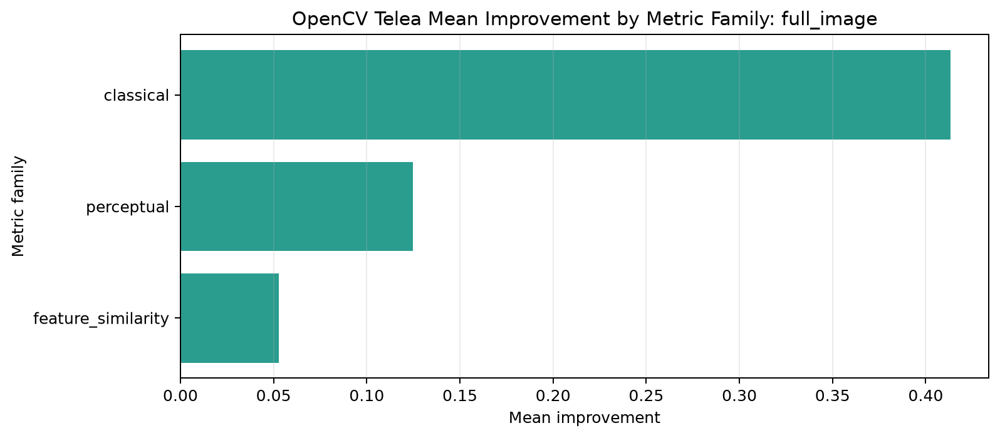

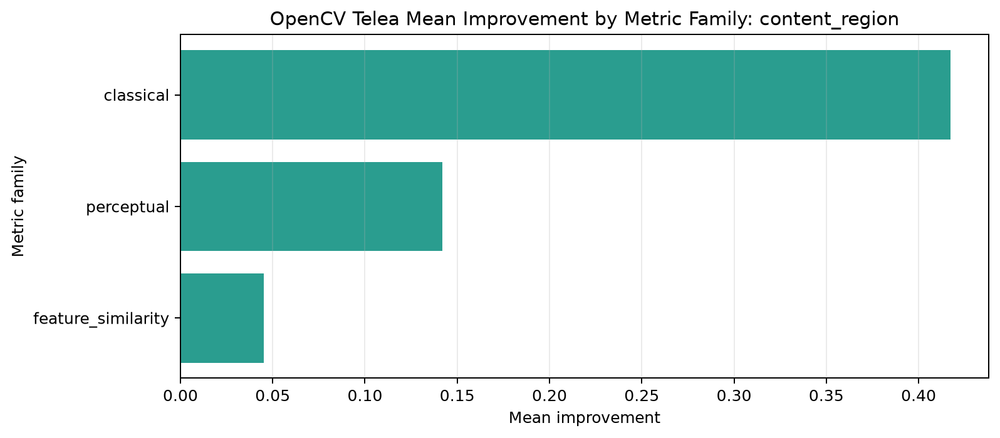

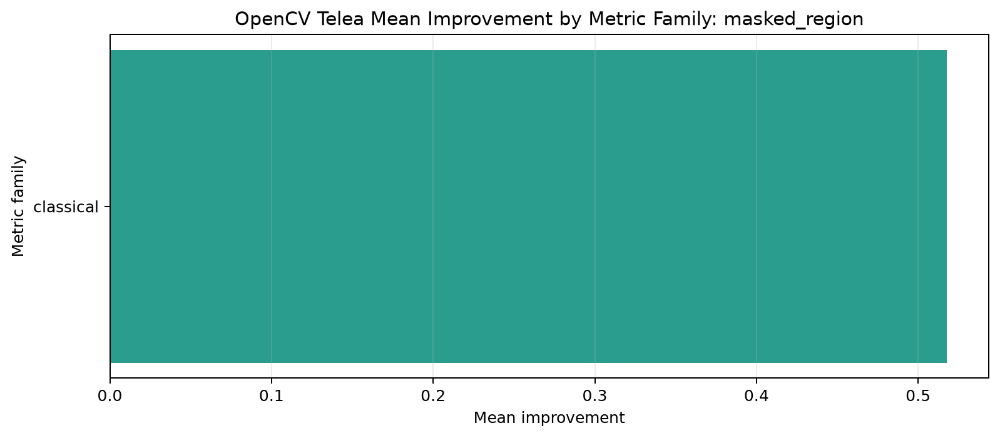

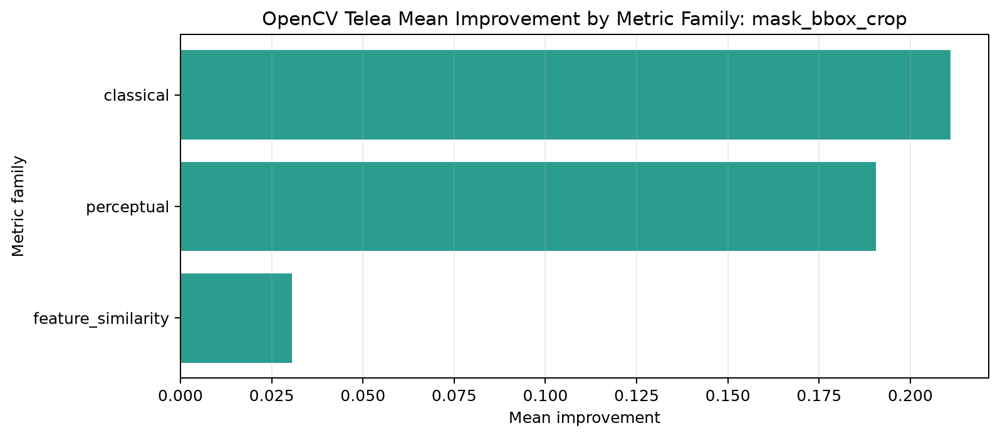

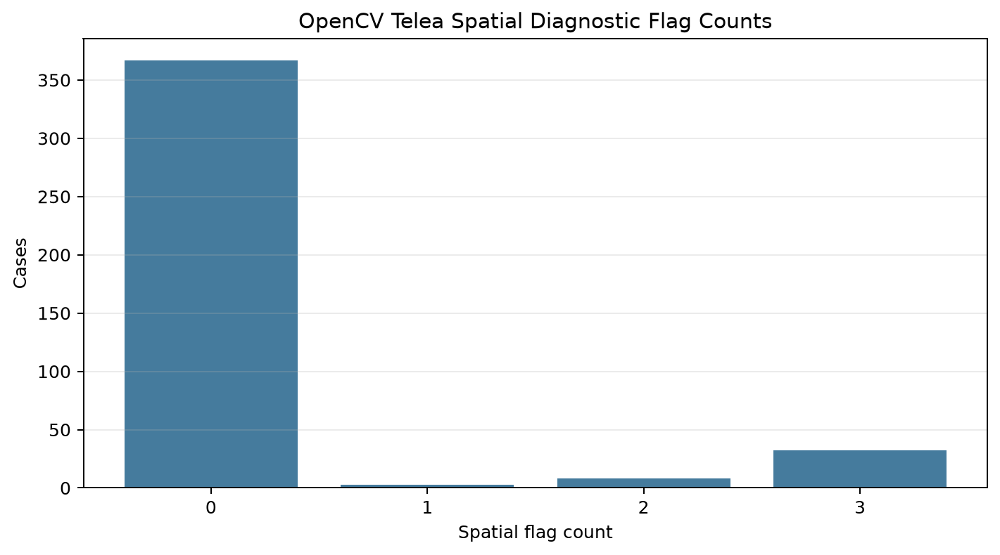

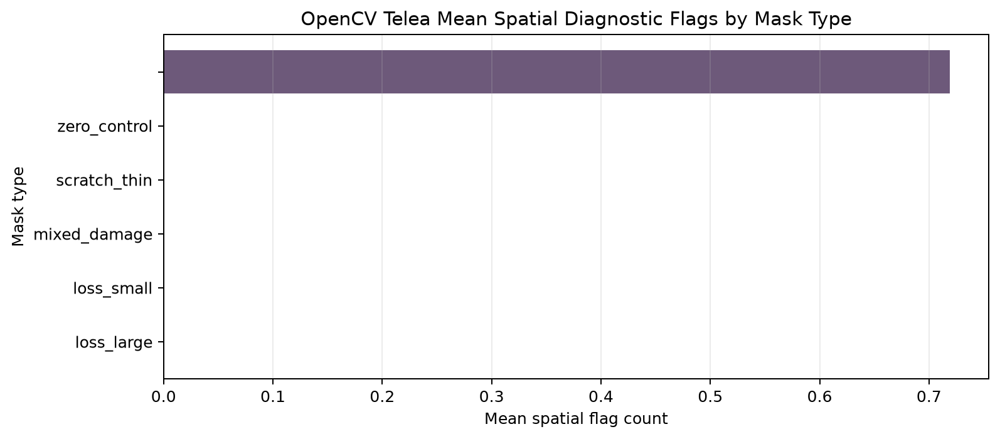

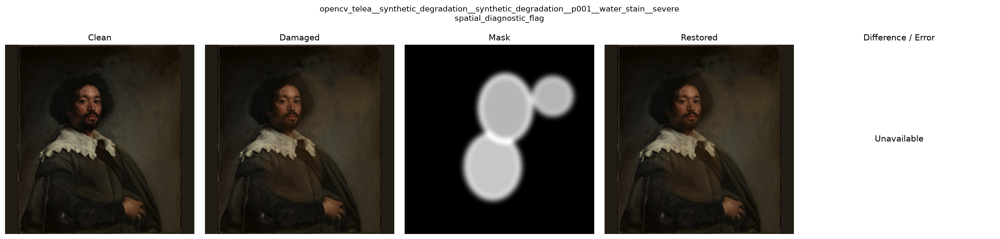

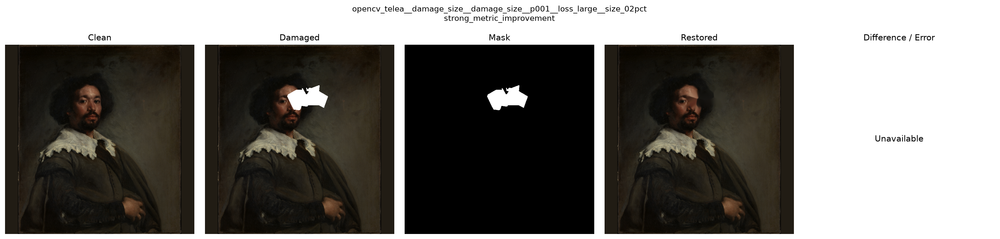

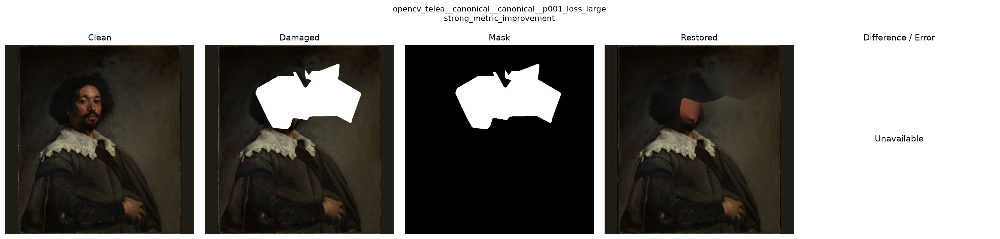

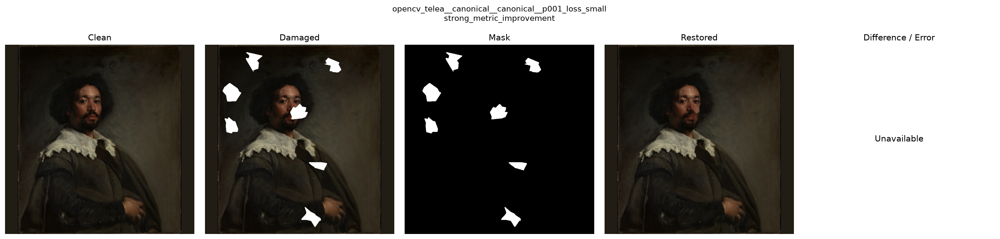

In [71]:
# Batch 5: Compose detailed explanatory Markdown report

case_count = int(report_case_metrics_df["report_case_id"].nunique())
zero_control_count = int(report_case_metrics_df["report_is_zero_control"].astype(bool).sum())
nonzero_case_count = int((~report_case_metrics_df["report_is_zero_control"].astype(bool)).sum())
difference_map_count = int(report_case_metrics_df["report_has_difference_map"].astype(bool).sum())

report_generated_at = datetime.now().strftime("%Y-%m-%d %H:%M:%S")

metric_families = []
if "metric_family" in report_summary_by_region_df.columns:
    metric_families = sorted(report_summary_by_region_df["metric_family"].dropna().astype(str).unique())

metric_names = []
if "metric_name" in report_summary_by_region_df.columns:
    metric_names = sorted(report_summary_by_region_df["metric_name"].dropna().astype(str).unique())

regions = []
if "report_region" in report_summary_by_region_df.columns:
    regions = sorted(report_summary_by_region_df["report_region"].dropna().astype(str).unique())

mask_types = []
if "report_mask_type" in report_case_metrics_df.columns:
    mask_types = sorted(report_case_metrics_df["report_mask_type"].dropna().astype(str).unique())

datasets = []
if "report_dataset_name" in report_case_metrics_df.columns:
    datasets = sorted(report_case_metrics_df["report_dataset_name"].dropna().astype(str).unique())

texture_colour_seam_note = (
    "Preliminary texture, colour, and seam evidence is present in the current case table through the following columns: "
    + ", ".join(texture_colour_seam_columns)
    + ". These fields are treated as diagnostic flags rather than final quality scores."
    if texture_colour_seam_columns
    else "Preliminary texture, colour, and seam evidence was requested in the Notebook 13 plan, but no matching texture, colour, color, seam, boundary, or spatial-flag columns were found in the current report case table. The report therefore records this as unavailable rather than inventing evidence."
)

report_markdown = f"""# OpenCV Telea Restoration Evaluation Report

Generated: {report_generated_at}

## 1. Report Purpose

This report consolidates the OpenCV Telea baseline evidence produced by the current evaluation pipeline. It is deliberately written as a diagnostic report, not as a final thesis conclusion. The goal is to make the OpenCV results inspectable before cross-model comparison with LaMa, Stable Diffusion Inpainting, and SDXL Inpainting.

Notebook 13 was planned to do eight things:

{dataframe_to_markdown_table(batch_5_evidence_coverage_df, max_rows=20)}

The important point is that every planned item is now either represented in the report or explicitly marked as unavailable. This prevents the report from claiming evidence that has not actually been generated yet.

## 2. Evaluation Scope

The current OpenCV report contains:

- Total unique report cases: {case_count}
- Zero-control cases: {zero_control_count}
- Nonzero damaged cases: {nonzero_case_count}
- Cases with difference maps: {difference_map_count}
- Datasets represented: {", ".join(datasets) if datasets else "dataset labels unavailable"}
- Mask types represented: {", ".join(mask_types) if mask_types else "mask-type labels unavailable"}
- Metric families represented: {", ".join(metric_families) if metric_families else "metric-family labels unavailable"}
- Regions represented: {", ".join(regions) if regions else "region labels unavailable"}

The zero-control cases are included to check whether the reporting and metric pipeline behaves sensibly when no synthetic damage is applied. The nonzero damaged cases are the main restoration-evaluation cases.

## 3. Method Summary

OpenCV Telea is used here as a deterministic classical inpainting baseline. It fills masked areas using nearby image information rather than learning semantic content from a training dataset. This makes it useful as a baseline because it is reproducible, fast, and explainable, but it also means it is not expected to reconstruct historically plausible missing content when the damaged region is large or semantically important.

The report combines several evidence families:

- Classical image metrics such as MSE, MAE, PSNR, and SSIM.
- Perceptual evidence such as LPIPS when available.
- Feature-similarity evidence such as CLIP, DINOv2, or mean feature similarity when available.
- Region-aware evidence comparing full image, masked area, bounding-box, content, and other available regions.
- Spatial diagnostic flags that identify cases where improvement is uneven or potentially misleading.
- Difference-map figures and representative panels for visual inspection.

These measures are complementary. A case can improve in pixel error while still looking structurally wrong. A case can look locally smooth while losing brush texture. A case can improve inside the mask while introducing boundary artifacts. This is why the report does not reduce restoration quality to one score.

## 4. Metric Interpretation Policy

The report uses improvement values where possible. Positive improvement usually means that the restored image moved closer to the clean reference than the damaged image did.

Metric direction still matters:

{chr(10).join("- " + metric + ": " + describe_metric_direction(metric) for metric in metric_names[:20]) if metric_names else "_Metric names unavailable._"}

The region is also important. Full-image metrics can hide poor restoration if the mask is small. Masked-region and mask-bounding-box metrics are more sensitive to the damaged area. Outside-mask checks are useful for identifying unintended changes beyond the region that should have been edited.

## 5. Dataset-Level Results

This section groups results by dataset/source label. It helps check whether OpenCV Telea behaves similarly across the image sources used in the experiment.

{dataframe_to_markdown_table(report_summary_by_dataset_df[dataset_report_columns], max_rows=30) if dataset_report_columns else "_Dataset summary columns unavailable._"}

Dataset-level numbers should be interpreted as broad diagnostics. If one dataset appears weaker, that may reflect different painting styles, texture density, colour distributions, mask placement, or source-image properties. It should not immediately be interpreted as model bias without inspecting the case-level evidence.

## 6. Mask-Type Results

This section groups results by synthetic damage type. It is one of the most important parts of the OpenCV baseline because Telea is expected to behave very differently on thin scratches versus larger missing regions.

{dataframe_to_markdown_table(report_summary_by_mask_type_df[mask_report_columns], max_rows=30) if mask_report_columns else "_Mask summary columns unavailable._"}

For OpenCV Telea, strong performance on small or thin masks would be expected because the method can interpolate nearby colours and structures. Weaker performance on large-loss and mixed-damage masks would also be expected because those cases require more semantic reconstruction and longer-range structure recovery.

## 7. Region-Aware Results

Region-aware reporting is necessary because whole-image averages can be misleading. If a mask covers only a small percentage of the painting, a high full-image SSIM can coexist with a visibly poor restoration inside the damaged region.

{dataframe_to_markdown_table(report_summary_by_region_df[region_report_columns], max_rows=60) if region_report_columns else "_Region-aware summary columns unavailable._"}

The most thesis-relevant comparisons are usually:

- Full image versus masked region.
- Masked region versus mask bounding box.
- Inside-mask improvement versus outside-mask stability.
- Classical metric improvement versus perceptual or feature-space improvement.

Cases where these disagree are especially important because they show why a trustworthy evaluation framework needs multiple metric families.

## 8. Runtime And Failure Evidence

Runtime and failure information is part of trustworthiness because a restoration method that silently fails, skips cases, or produces inconsistent outputs cannot be evaluated reliably.

{dataframe_to_markdown_table(runtime_failure_summary_df[failure_report_columns], max_rows=40) if failure_report_columns else "_Runtime and failure summary columns unavailable._"}

This section should be checked before interpreting metric results. If a stage has missing outputs, failures, or incomplete rows, the affected cases should be excluded from strong claims or clearly marked as incomplete.

## 9. Difference Maps And Spatial Evidence

Difference maps provide visual evidence for where the restoration changed the image and where error remains concentrated. They are especially useful for detecting boundary artifacts, poor local blending, and cases where global metrics look acceptable despite visible local failure.

{chr(10).join(figure_sections) if figure_sections else "_No report figures were available in the figure manifest._"}

The figures in this section should be read alongside the region-aware tables. A metric improvement inside the mask is more convincing when the difference map also shows reduced localized error without new boundary or outside-mask artifacts.

## 10. Texture, Colour, And Seam Evidence

{texture_colour_seam_note}

This part is still preliminary for the OpenCV-only report. Texture, colour, and seam consistency become more important in the cross-model phase because diffusion models may produce visually plausible but historically or stylistically inconsistent completions. For OpenCV Telea, the expected risk is different: local smoothing, weak texture continuation, and visible transitions around larger masks.

## 11. Representative Cases

Representative cases are included to prevent the report from becoming purely numeric. They are selected to cover strong improvements, weak or negative behavior, spatial flags, and different mask types.

{dataframe_to_markdown_table(representative_cases_df[representative_report_columns], max_rows=30) if representative_report_columns else "_Representative case columns unavailable._"}

{chr(10).join(representative_panel_sections) if representative_panel_sections else "_No representative case panels were available._"}

These cases should be used as qualitative anchors. The table explains why the case was selected; the panel shows the clean image, damaged image, mask, restored image, and difference map where available.

## 12. Standardized Report Assets

The report generation step writes standardized assets so later notebooks and the Streamlit dashboard can reuse the same outputs.

{dataframe_to_markdown_table(batch_4_output_inventory_df, max_rows=50) if "batch_4_output_inventory_df" in globals() else "_Batch 4 output inventory unavailable._"}

The asset manifest is important because it makes the report reproducible: every figure and representative panel should be traceable to a saved file path rather than existing only in notebook output.

## 13. What This Report Can And Cannot Claim

This report can support the following limited claims:

- The OpenCV Telea baseline has been evaluated using consolidated metrics.
- The results are broken down by dataset, mask type, and region where those labels are available.
- Difference maps and representative panels exist for visual inspection where the files were generated.
- Runtime and failure evidence has been collected where available.
- Preliminary spatial, texture, colour, or seam evidence is included only when matching columns exist.

This report cannot yet support final trustworthiness claims because it only covers the OpenCV Telea baseline. Trustworthiness in the thesis requires cross-model comparison, uncertainty evidence, damage-size sensitivity, metric ablation, and consistency checks across classical, perceptual, feature-space, and visual evidence.

## 14. Next Evaluation Step

The next step should reuse this exact report structure for LaMa, Stable Diffusion Inpainting, and SDXL Inpainting. Once those reports exist, the cross-model report can compare:

- Whether stronger perceptual metrics correspond to better visual restoration.
- Whether diffusion models improve semantic plausibility but introduce style or colour inconsistency.
- Whether uncertainty maps identify visibly risky restorations.
- Whether damage size changes model ranking.
- Whether seam and boundary artifacts are detected consistently.
- Whether metric ablation changes the interpretation of model quality.

Until that cross-model evidence is available, this OpenCV report should be treated as a baseline diagnostic and asset package.
"""

REPORT_MARKDOWN_OUTPUT_PATH.write_text(
    report_markdown,
    encoding="utf-8",
)

notebook_display(Markdown(report_markdown))

preview_paths = []

if not report_figure_manifest_df.empty and "path" in report_figure_manifest_df.columns:
    preview_paths.extend(report_figure_manifest_df["path"].head(8).tolist())

if "representative_panel_path" in representative_cases_df.columns:
    preview_paths.extend(representative_cases_df["representative_panel_path"].head(4).tolist())

for preview_path in preview_paths:
    resolved_path = resolve_existing_asset_path(preview_path)

    if resolved_path is not None and resolved_path.is_file():
        notebook_display(NotebookImage(filename=str(resolved_path)))

In [72]:
# Batch 5: Convert detailed Markdown report to standalone HTML

def markdown_to_simple_html(markdown_text: str) -> str:
    html_lines = []
    in_table = False
    in_list = False

    for line in markdown_text.splitlines():
        stripped = line.strip()

        if in_table and not (stripped.startswith("|") and stripped.endswith("|")):
            html_lines.append("</table>")
            in_table = False

        if in_list and not stripped.startswith("- "):
            html_lines.append("</ul>")
            in_list = False

        if stripped.startswith("# "):
            html_lines.append(f"<h1>{escape(stripped[2:])}</h1>")

        elif stripped.startswith("## "):
            html_lines.append(f"<h2>{escape(stripped[3:])}</h2>")

        elif stripped.startswith("- "):
            if not in_list:
                html_lines.append("<ul>")
                in_list = True
            html_lines.append(f"<li>{escape(stripped[2:])}</li>")

        elif stripped.startswith("![") and "](" in stripped and stripped.endswith(")"):
            alt = stripped[2:].split("](", 1)[0]
            src = stripped.split("](", 1)[1][:-1]
            html_lines.append(
                f"<figure><img src='{escape(src)}' alt='{escape(alt)}'></figure>"
            )

        elif stripped.startswith("_") and stripped.endswith("_") and len(stripped) > 2:
            html_lines.append(f"<p class='caption'>{escape(stripped[1:-1])}</p>")

        elif stripped.startswith("|") and stripped.endswith("|"):
            cells = [cell.strip() for cell in stripped.strip("|").split("|")]

            if all(set(cell) <= {"-"} for cell in cells):
                continue

            if not in_table:
                html_lines.append("<table>")
                in_table = True
                tag = "th"
            else:
                tag = "td"

            html_lines.append(
                "<tr>"
                + "".join(f"<{tag}>{escape(cell)}</{tag}>" for cell in cells)
                + "</tr>"
            )

        elif stripped:
            html_lines.append(f"<p>{escape(stripped)}</p>")

    if in_table:
        html_lines.append("</table>")

    if in_list:
        html_lines.append("</ul>")

    body = "\n".join(html_lines)

    return f"""<!doctype html>
<html>
<head>
<meta charset="utf-8">
<title>OpenCV Telea Restoration Evaluation Report</title>
<style>
body {{
    font-family: Arial, sans-serif;
    max-width: 1180px;
    margin: 32px auto;
    padding: 0 20px;
    color: #222;
    line-height: 1.55;
}}
h1 {{
    border-bottom: 2px solid #222;
    padding-bottom: 10px;
}}
h2 {{
    margin-top: 34px;
    border-bottom: 1px solid #ddd;
    padding-bottom: 6px;
}}
table {{
    border-collapse: collapse;
    width: 100%;
    margin: 14px 0 24px;
    font-size: 12px;
}}
th, td {{
    border: 1px solid #ddd;
    padding: 7px 8px;
    text-align: left;
    vertical-align: top;
}}
th {{
    background: #f3f5f7;
}}
img {{
    max-width: 100%;
    height: auto;
    border: 1px solid #ddd;
}}
figure {{
    margin: 18px 0 6px;
}}
.caption {{
    color: #555;
    font-size: 13px;
    margin-top: 0;
}}
li {{
    margin-bottom: 4px;
}}
</style>
</head>
<body>
{body}
</body>
</html>
"""


report_html = markdown_to_simple_html(report_markdown)

REPORT_HTML_OUTPUT_PATH.write_text(
    report_html,
    encoding="utf-8",
)

print(REPORT_HTML_OUTPUT_PATH)
print("Exists:", REPORT_HTML_OUTPUT_PATH.exists())

D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\opencv_telea_report.html
Exists: True


In [73]:
# Persist Batch 5 asset index and validate

batch_5_asset_index_df = pd.DataFrame(
    [
        describe_artifact(
            "opencv_telea_report_markdown",
            REPORT_MARKDOWN_OUTPUT_PATH,
            required=True,
        ),
        describe_artifact(
            "opencv_telea_report_html",
            REPORT_HTML_OUTPUT_PATH,
            required=True,
        ),
        describe_artifact(
            "opencv_telea_report_case_metrics",
            REPORT_CASE_METRICS_OUTPUT_PATH,
            required=True,
        ),
        describe_artifact(
            "opencv_telea_report_representative_cases",
            REPRESENTATIVE_CASE_MANIFEST_OUTPUT_PATH,
            required=True,
        ),
        describe_artifact(
            "opencv_telea_report_figure_manifest",
            REPORT_FIGURE_MANIFEST_OUTPUT_PATH,
            required=True,
        ),
    ]
)

batch_5_asset_index_df.to_csv(
    REPORT_ASSET_INDEX_OUTPUT_PATH,
    index=False,
)

batch_5_output_inventory_df = pd.concat(
    [
        batch_5_asset_index_df,
        pd.DataFrame(
            [
                describe_artifact(
                    "opencv_telea_report_asset_index",
                    REPORT_ASSET_INDEX_OUTPUT_PATH,
                    required=True,
                )
            ]
        ),
    ],
    ignore_index=True,
)

display(batch_5_output_inventory_df)

batch_5_validation_df = pd.DataFrame(
    [
        build_check(
            "markdown_report_written",
            REPORT_MARKDOWN_OUTPUT_PATH.is_file(),
            True,
            REPORT_MARKDOWN_OUTPUT_PATH.is_file(),
        ),
        build_check(
            "html_report_written",
            REPORT_HTML_OUTPUT_PATH.is_file(),
            True,
            REPORT_HTML_OUTPUT_PATH.is_file(),
        ),
        build_check(
            "asset_index_written",
            REPORT_ASSET_INDEX_OUTPUT_PATH.is_file(),
            True,
            REPORT_ASSET_INDEX_OUTPUT_PATH.is_file(),
        ),
        build_check(
            "batch_5_outputs_written",
            int(batch_5_output_inventory_df["exists"].astype(bool).sum()),
            len(batch_5_output_inventory_df),
            bool(batch_5_output_inventory_df["exists"].astype(bool).all()),
        ),
    ]
)

display(batch_5_validation_df)

if not batch_5_validation_df["passed"].astype(bool).all():
    raise RuntimeError(
        "Notebook 13 Batch 5 validation failed."
    )

print(
    "Notebook 13 Batch 5 complete: Markdown and HTML OpenCV Telea report narratives are written."
)

,artifact_name,required,artifact_kind,path,exists,file_size_bytes,sha256
0,opencv_telea_report_markdown,True,file,outputs/reports/opencv_telea_report_generation.md,True,22081,de19051209d302d579838a0640eb761d3f445e84364b60...
1,opencv_telea_report_html,True,file,outputs/reports/opencv_telea_report.html,True,27872,adde827d072e15a49ee0a9a7e966ac92b284d045aa18b5...
2,opencv_telea_report_case_metrics,True,file,outputs/reports/opencv_report_assets/opencv_te...,True,618489,1f42021c42f51f52811ce06d11d676481d641dca8f147b...
3,opencv_telea_report_representative_cases,True,file,outputs/reports/opencv_telea_report_representa...,True,5135,85287a2bcb2f94cf8b63bc08ab77779a1a8942f820aee1...
4,opencv_telea_report_figure_manifest,True,file,outputs/reports/opencv_telea_report_figure_man...,True,1359,a108a6261d4a51cd6fa4ceedefdd5d5d64cd503e97b764...
5,opencv_telea_report_asset_index,True,file,outputs/reports/opencv_telea_report_asset_inde...,True,953,0a150b3c1d494861ba4c782946fb6165ce713b4a8f751a...


,check,actual,expected,passed
0,markdown_report_written,True,True,True
1,html_report_written,True,True,True
2,asset_index_written,True,True,True
3,batch_5_outputs_written,6,6,True


Notebook 13 Batch 5 complete: Markdown and HTML OpenCV Telea report narratives are written.


In [74]:
# Batch 6: Completeness-check setup

import os
import re
from pathlib import Path
from urllib.parse import unquote
from datetime import datetime
from IPython.display import Markdown, display as notebook_display

REPORT_COMPLETENESS_OUTPUT_PATH = REPORTS_DIR / "opencv_telea_report_completeness_check.csv"
REPORT_MISSING_ASSETS_OUTPUT_PATH = REPORTS_DIR / "opencv_telea_report_missing_assets.csv"
REPORT_COMPLETENESS_MARKDOWN_OUTPUT_PATH = REPORTS_DIR / "opencv_telea_report_completeness_check.md"


def normalize_report_reference(reference_value: object, *, base_dir: Path) -> Path | None:
    if pd.isna(reference_value):
        return None

    reference_text = str(reference_value).strip()

    if reference_text == "" or reference_text.startswith(("http://", "https://", "data:")):
        return None

    reference_text = unquote(reference_text.split("#", 1)[0].split("?", 1)[0])
    reference_path = Path(reference_text)

    if reference_path.is_absolute():
        return reference_path.resolve()

    candidates = [
        (base_dir / reference_path).resolve(),
        (PROJECT_ROOT / reference_path).resolve(),
        (REPORTS_DIR / reference_path).resolve(),
    ]

    for candidate in candidates:
        if candidate.exists():
            return candidate

    return candidates[0]


def append_check(
    rows: list[dict],
    name: str,
    actual: object,
    expected: object,
    passed: bool,
    detail: str = "",
) -> None:
    rows.append(
        {
            "check_name": name,
            "actual": actual,
            "expected": expected,
            "passed": bool(passed),
            "detail": detail,
        }
    )


def extract_markdown_image_refs(markdown_text: str) -> list[str]:
    return re.findall(r"!\[[^\]]*\]\(([^)]+)\)", markdown_text)


def extract_html_image_refs(html_text: str) -> list[str]:
    return re.findall(
        r"<img[^>]+src=['\"]([^'\"]+)['\"]",
        html_text,
        flags=re.IGNORECASE,
    )


def dataframe_to_markdown_table_compact(dataframe: pd.DataFrame) -> str:
    if dataframe.empty:
        return "_No rows available._"

    headers = list(dataframe.columns)

    lines = [
        "| " + " | ".join(headers) + " |",
        "| " + " | ".join(["---"] * len(headers)) + " |",
    ]

    for _, row in dataframe.iterrows():
        values = [
            str(row[column]).replace("|", "/")
            for column in headers
        ]
        lines.append("| " + " | ".join(values) + " |")

    return "\n".join(lines)


REPORTS_DIR.mkdir(parents=True, exist_ok=True)

In [75]:
# Batch 6: Validate report files, referenced images, manifests, and evidence coverage

completeness_rows = []
missing_asset_rows = []

append_check(
    completeness_rows,
    "markdown_report_exists",
    REPORT_MARKDOWN_OUTPUT_PATH.is_file(),
    True,
    REPORT_MARKDOWN_OUTPUT_PATH.is_file(),
    str(REPORT_MARKDOWN_OUTPUT_PATH),
)

append_check(
    completeness_rows,
    "html_report_exists",
    REPORT_HTML_OUTPUT_PATH.is_file(),
    True,
    REPORT_HTML_OUTPUT_PATH.is_file(),
    str(REPORT_HTML_OUTPUT_PATH),
)

report_markdown_text = (
    REPORT_MARKDOWN_OUTPUT_PATH.read_text(encoding="utf-8")
    if REPORT_MARKDOWN_OUTPUT_PATH.is_file()
    else ""
)

report_html_text = (
    REPORT_HTML_OUTPUT_PATH.read_text(encoding="utf-8")
    if REPORT_HTML_OUTPUT_PATH.is_file()
    else ""
)

required_report_sections = [
    "## 1. Report Purpose",
    "## 2. Evaluation Scope",
    "## 3. Method Summary",
    "## 4. Metric Interpretation Policy",
    "## 5. Dataset-Level Results",
    "## 6. Mask-Type Results",
    "## 7. Region-Aware Results",
    "## 8. Runtime And Failure Evidence",
    "## 9. Difference Maps And Spatial Evidence",
    "## 10. Texture, Colour, And Seam Evidence",
    "## 11. Representative Cases",
    "## 12. Standardized Report Assets",
    "## 13. What This Report Can And Cannot Claim",
    "## 14. Next Evaluation Step",
]

missing_sections = [
    section
    for section in required_report_sections
    if section not in report_markdown_text
]

append_check(
    completeness_rows,
    "required_report_sections_present",
    len(required_report_sections) - len(missing_sections),
    len(required_report_sections),
    len(missing_sections) == 0,
    "; ".join(missing_sections),
)

markdown_image_refs = extract_markdown_image_refs(report_markdown_text)

markdown_image_paths = [
    normalize_report_reference(
        reference,
        base_dir=REPORT_MARKDOWN_OUTPUT_PATH.parent,
    )
    for reference in markdown_image_refs
]

missing_markdown_images = [
    (reference, path)
    for reference, path in zip(markdown_image_refs, markdown_image_paths)
    if path is not None and not path.is_file()
]

for reference, path in missing_markdown_images:
    missing_asset_rows.append(
        {
            "source": "markdown_image",
            "reference": reference,
            "resolved_path": str(path),
        }
    )

append_check(
    completeness_rows,
    "markdown_image_links_resolve",
    len(markdown_image_refs) - len(missing_markdown_images),
    len(markdown_image_refs),
    len(missing_markdown_images) == 0 and len(markdown_image_refs) > 0,
    f"{len(missing_markdown_images)} missing Markdown image references",
)

html_image_refs = extract_html_image_refs(report_html_text)

html_image_paths = [
    normalize_report_reference(
        reference,
        base_dir=REPORT_HTML_OUTPUT_PATH.parent,
    )
    for reference in html_image_refs
]

missing_html_images = [
    (reference, path)
    for reference, path in zip(html_image_refs, html_image_paths)
    if path is not None and not path.is_file()
]

for reference, path in missing_html_images:
    missing_asset_rows.append(
        {
            "source": "html_image",
            "reference": reference,
            "resolved_path": str(path),
        }
    )

append_check(
    completeness_rows,
    "html_image_links_resolve",
    len(html_image_refs) - len(missing_html_images),
    len(html_image_refs),
    len(missing_html_images) == 0 and len(html_image_refs) > 0,
    f"{len(missing_html_images)} missing HTML image references",
)

manifest_path_columns = {
    "report_figure_manifest": (
        report_figure_manifest_df,
        ["path", "figure_path", "output_path"],
    ),
    "representative_cases": (
        representative_cases_df,
        ["representative_panel_path", "path", "figure_path"],
    ),
}

for manifest_name, (manifest_df, candidate_columns) in manifest_path_columns.items():
    existing_columns = [
        column
        for column in candidate_columns
        if column in manifest_df.columns
    ]

    if not existing_columns:
        append_check(
            completeness_rows,
            f"{manifest_name}_path_column_present",
            0,
            1,
            False,
            f"None of these columns found: {candidate_columns}",
        )
        continue

    path_column = existing_columns[0]

    manifest_refs = manifest_df[path_column].dropna().astype(str).str.strip()
    manifest_refs = manifest_refs[manifest_refs != ""].tolist()

    manifest_paths = [
        normalize_report_reference(
            reference,
            base_dir=REPORT_MARKDOWN_OUTPUT_PATH.parent,
        )
        for reference in manifest_refs
    ]

    missing_manifest_assets = [
        (reference, path)
        for reference, path in zip(manifest_refs, manifest_paths)
        if path is not None and not path.is_file()
    ]

    for reference, path in missing_manifest_assets:
        missing_asset_rows.append(
            {
                "source": manifest_name,
                "reference": reference,
                "resolved_path": str(path),
            }
        )

    append_check(
        completeness_rows,
        f"{manifest_name}_paths_resolve",
        len(manifest_refs) - len(missing_manifest_assets),
        len(manifest_refs),
        len(missing_manifest_assets) == 0 and len(manifest_refs) > 0,
        f"path column: {path_column}",
    )

if "batch_5_evidence_coverage_df" in globals() and not batch_5_evidence_coverage_df.empty:
    coverage_available = int(batch_5_evidence_coverage_df["available_in_batch"].astype(bool).sum())
    coverage_total = int(len(batch_5_evidence_coverage_df))

    append_check(
        completeness_rows,
        "planned_evidence_items_documented",
        coverage_total,
        8,
        coverage_total >= 8,
        "Every planned item should have one row in the evidence coverage table.",
    )

    append_check(
        completeness_rows,
        "planned_evidence_items_available_or_explicit",
        coverage_available,
        coverage_total,
        coverage_total >= 8,
        "Unavailable evidence is acceptable only when explicitly documented.",
    )
else:
    append_check(
        completeness_rows,
        "planned_evidence_items_documented",
        0,
        8,
        False,
        "batch_5_evidence_coverage_df is unavailable.",
    )

if "batch_5_output_inventory_df" in globals() and not batch_5_output_inventory_df.empty:
    append_check(
        completeness_rows,
        "batch_5_output_inventory_exists",
        int(batch_5_output_inventory_df["exists"].astype(bool).sum())
        if "exists" in batch_5_output_inventory_df.columns
        else "unknown",
        len(batch_5_output_inventory_df),
        bool(batch_5_output_inventory_df["exists"].astype(bool).all())
        if "exists" in batch_5_output_inventory_df.columns
        else False,
        "Checks report markdown, HTML, case metrics, representative manifest, figure manifest, and asset index.",
    )
else:
    append_check(
        completeness_rows,
        "batch_5_output_inventory_exists",
        0,
        "available inventory rows",
        False,
        "batch_5_output_inventory_df is unavailable.",
    )

batch_6_completeness_df = pd.DataFrame(completeness_rows)

batch_6_missing_assets_df = pd.DataFrame(
    missing_asset_rows,
    columns=["source", "reference", "resolved_path"],
)

display(batch_6_completeness_df)

if not batch_6_missing_assets_df.empty:
    display(batch_6_missing_assets_df)

,check_name,actual,expected,passed,detail
0,markdown_report_exists,True,True,True,D:\Masters\FH\Thesis\painting-restoration-eval...
1,html_report_exists,True,True,True,D:\Masters\FH\Thesis\painting-restoration-eval...
2,required_report_sections_present,14,14,True,
3,markdown_image_links_resolve,13,13,True,0 missing Markdown image references
4,html_image_links_resolve,13,13,True,0 missing HTML image references
5,report_figure_manifest_paths_resolve,6,6,True,path column: path
6,representative_cases_paths_resolve,7,7,True,path column: representative_panel_path
7,planned_evidence_items_documented,8,8,True,Every planned item should have one row in the ...
8,planned_evidence_items_available_or_explicit,7,8,True,Unavailable evidence is acceptable only when e...
9,batch_5_output_inventory_exists,6,6,True,"Checks report markdown, HTML, case metrics, re..."


In [76]:
# Batch 6: Persist completeness outputs and fail on broken report references

batch_6_completeness_df.to_csv(
    REPORT_COMPLETENESS_OUTPUT_PATH,
    index=False,
)

batch_6_missing_assets_df.to_csv(
    REPORT_MISSING_ASSETS_OUTPUT_PATH,
    index=False,
)

passed_count = int(batch_6_completeness_df["passed"].astype(bool).sum())
total_count = int(len(batch_6_completeness_df))
missing_asset_count = int(len(batch_6_missing_assets_df))

completeness_markdown = f"""# OpenCV Telea Report Completeness Check

Generated: {datetime.now().strftime("%Y-%m-%d %H:%M:%S")}

## Summary

- Checks passed: {passed_count} / {total_count}
- Missing linked assets: {missing_asset_count}
- Markdown report: {REPORT_MARKDOWN_OUTPUT_PATH}
- HTML report: {REPORT_HTML_OUTPUT_PATH}

## Checks

{dataframe_to_markdown_table_compact(batch_6_completeness_df)}

## Missing Assets

{dataframe_to_markdown_table_compact(batch_6_missing_assets_df) if not batch_6_missing_assets_df.empty else "_No missing linked assets found._"}
"""

REPORT_COMPLETENESS_MARKDOWN_OUTPUT_PATH.write_text(
    completeness_markdown,
    encoding="utf-8",
)

print("Saved completeness check:", REPORT_COMPLETENESS_OUTPUT_PATH)
print("Saved missing asset report:", REPORT_MISSING_ASSETS_OUTPUT_PATH)
print("Saved completeness summary:", REPORT_COMPLETENESS_MARKDOWN_OUTPUT_PATH)

notebook_display(Markdown(completeness_markdown))

if not batch_6_completeness_df["passed"].astype(bool).all():
    raise RuntimeError(
        "Batch 6 completeness validation failed. Inspect batch_6_completeness_df and batch_6_missing_assets_df."
    )

print("Notebook 13 Batch 6 complete: report completeness and linked assets validated.")

Saved completeness check: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\opencv_telea_report_completeness_check.csv
Saved missing asset report: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\opencv_telea_report_missing_assets.csv
Saved completeness summary: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\opencv_telea_report_completeness_check.md


# OpenCV Telea Report Completeness Check

Generated: 2026-07-27 15:02:10

## Summary

- Checks passed: 10 / 10
- Missing linked assets: 0
- Markdown report: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\opencv_telea_report_generation.md
- HTML report: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\opencv_telea_report.html

## Checks

| check_name | actual | expected | passed | detail |
| --- | --- | --- | --- | --- |
| markdown_report_exists | True | True | True | D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\opencv_telea_report_generation.md |
| html_report_exists | True | True | True | D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\opencv_telea_report.html |
| required_report_sections_present | 14 | 14 | True |  |
| markdown_image_links_resolve | 13 | 13 | True | 0 missing Markdown image references |
| html_image_links_resolve | 13 | 13 | True | 0 missing HTML image references |
| report_figure_manifest_paths_resolve | 6 | 6 | True | path column: path |
| representative_cases_paths_resolve | 7 | 7 | True | path column: representative_panel_path |
| planned_evidence_items_documented | 8 | 8 | True | Every planned item should have one row in the evidence coverage table. |
| planned_evidence_items_available_or_explicit | 7 | 8 | True | Unavailable evidence is acceptable only when explicitly documented. |
| batch_5_output_inventory_exists | 6 | 6 | True | Checks report markdown, HTML, case metrics, representative manifest, figure manifest, and asset index. |

## Missing Assets

_No missing linked assets found._


Notebook 13 Batch 6 complete: report completeness and linked assets validated.


In [77]:
# Batch 7: OpenCV cross-model handoff setup

from datetime import datetime
from pathlib import Path
from IPython.display import Markdown, display as notebook_display

MODEL_REPORT_INDEX_OUTPUT_PATH = REPORTS_DIR / "opencv_telea_model_report_index.csv"
CROSS_MODEL_EVIDENCE_MANIFEST_OUTPUT_PATH = REPORTS_DIR / "opencv_telea_cross_model_evidence_manifest.csv"
CROSS_MODEL_HANDOFF_MARKDOWN_OUTPUT_PATH = REPORTS_DIR / "opencv_telea_cross_model_handoff.md"


def global_value(name: str, default=None):
    return globals().get(name, default)


def first_global_path(names: list[str]) -> Path | None:
    for name in names:
        value = global_value(name)
        if value is not None:
            return Path(value)
    return None


def safe_file_exists(path_value) -> bool:
    if path_value is None or str(path_value).strip() == "":
        return False
    return Path(path_value).is_file()


def safe_file_size(path_value) -> int:
    if not safe_file_exists(path_value):
        return 0
    return int(Path(path_value).stat().st_size)


def compact_unique_values(dataframe: pd.DataFrame, column: str) -> str:
    if dataframe is None or dataframe.empty or column not in dataframe.columns:
        return ""
    values = sorted(dataframe[column].dropna().astype(str).unique())
    return ", ".join(values)


def add_manifest_row(rows, *, asset_group, asset_name, path_value="", dataframe=None, notes=""):
    path_text = "" if path_value is None else str(path_value)

    rows.append(
        {
            "asset_group": asset_group,
            "asset_name": asset_name,
            "path": path_text,
            "exists": safe_file_exists(path_text) if path_text else False,
            "bytes": safe_file_size(path_text) if path_text else 0,
            "dataframe_rows": len(dataframe) if dataframe is not None else "",
            "dataframe_columns": len(dataframe.columns) if dataframe is not None else "",
            "notes": notes,
        }
    )

In [78]:
# Batch 7: Build OpenCV model report index and reusable evidence manifest

case_count = int(report_case_metrics_df["report_case_id"].nunique())
zero_control_count = int(report_case_metrics_df["report_is_zero_control"].astype(bool).sum())
nonzero_case_count = int((~report_case_metrics_df["report_is_zero_control"].astype(bool)).sum())
difference_map_count = int(report_case_metrics_df["report_has_difference_map"].astype(bool).sum())

available_evidence = ""
unavailable_evidence = ""

if "batch_5_evidence_coverage_df" in globals() and not batch_5_evidence_coverage_df.empty:
    available_evidence = ", ".join(
        batch_5_evidence_coverage_df.loc[
            batch_5_evidence_coverage_df["available_in_batch"].astype(bool),
            "planned_report_item",
        ].astype(str)
    )

    unavailable_evidence = ", ".join(
        batch_5_evidence_coverage_df.loc[
            ~batch_5_evidence_coverage_df["available_in_batch"].astype(bool),
            "planned_report_item",
        ].astype(str)
    )

model_report_index_df = pd.DataFrame(
    [
        {
            "model_name": "opencv_telea",
            "model_family": "classical_inpainting_baseline",
            "report_generated_at": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
            "markdown_report_path": str(REPORT_MARKDOWN_OUTPUT_PATH),
            "html_report_path": str(REPORT_HTML_OUTPUT_PATH),
            "case_count": case_count,
            "zero_control_count": zero_control_count,
            "nonzero_case_count": nonzero_case_count,
            "difference_map_count": difference_map_count,
            "datasets": compact_unique_values(report_case_metrics_df, "report_dataset_name"),
            "mask_types": compact_unique_values(report_case_metrics_df, "report_mask_type"),
            "metric_families": compact_unique_values(report_summary_by_region_df, "metric_family"),
            "metric_names": compact_unique_values(report_summary_by_region_df, "metric_name"),
            "regions": compact_unique_values(report_summary_by_region_df, "report_region"),
            "available_evidence": available_evidence,
            "unavailable_or_preliminary_evidence": unavailable_evidence,
            "interpretation_status": "baseline_diagnostic_only_not_final_trustworthiness_claim",
        }
    ]
)

manifest_rows = []

add_manifest_row(
    manifest_rows,
    asset_group="report",
    asset_name="markdown_report",
    path_value=REPORT_MARKDOWN_OUTPUT_PATH,
    notes="Detailed OpenCV Telea report.",
)

add_manifest_row(
    manifest_rows,
    asset_group="report",
    asset_name="html_report",
    path_value=REPORT_HTML_OUTPUT_PATH,
    notes="Standalone HTML version of the detailed report.",
)

add_manifest_row(
    manifest_rows,
    asset_group="validation",
    asset_name="completeness_check_csv",
    path_value=global_value("REPORT_COMPLETENESS_OUTPUT_PATH"),
    dataframe=global_value("batch_6_completeness_df"),
    notes="Batch 6 completeness checks.",
)

add_manifest_row(
    manifest_rows,
    asset_group="validation",
    asset_name="missing_assets_csv",
    path_value=global_value("REPORT_MISSING_ASSETS_OUTPUT_PATH"),
    dataframe=global_value("batch_6_missing_assets_df"),
    notes="Batch 6 missing linked assets table.",
)

add_manifest_row(
    manifest_rows,
    asset_group="validation",
    asset_name="completeness_markdown",
    path_value=global_value("REPORT_COMPLETENESS_MARKDOWN_OUTPUT_PATH"),
    notes="Human-readable Batch 6 completeness summary.",
)

add_manifest_row(
    manifest_rows,
    asset_group="table",
    asset_name="report_case_metrics_df",
    dataframe=report_case_metrics_df,
    notes="Case-level OpenCV report metrics.",
)

add_manifest_row(
    manifest_rows,
    asset_group="table",
    asset_name="dataset_summary",
    dataframe=report_summary_by_dataset_df,
    notes="Dataset-level OpenCV summary.",
)

add_manifest_row(
    manifest_rows,
    asset_group="table",
    asset_name="mask_type_summary",
    dataframe=report_summary_by_mask_type_df,
    notes="Mask-type OpenCV summary.",
)

add_manifest_row(
    manifest_rows,
    asset_group="table",
    asset_name="region_summary",
    dataframe=report_summary_by_region_df,
    notes="Region-aware OpenCV metric summary.",
)

add_manifest_row(
    manifest_rows,
    asset_group="table",
    asset_name="runtime_failure_summary",
    dataframe=runtime_failure_summary_df,
    notes="Runtime and failure evidence.",
)

add_manifest_row(
    manifest_rows,
    asset_group="table",
    asset_name="representative_cases",
    dataframe=representative_cases_df,
    notes="Representative case selector output.",
)

if not report_figure_manifest_df.empty and "path" in report_figure_manifest_df.columns:
    for _, row in report_figure_manifest_df.iterrows():
        add_manifest_row(
            manifest_rows,
            asset_group="figure",
            asset_name=str(row.get("artifact_name", Path(str(row.get("path", ""))).stem)),
            path_value=row.get("path", ""),
            notes="Report figure manifest asset.",
        )

if not representative_cases_df.empty and "representative_panel_path" in representative_cases_df.columns:
    for _, row in representative_cases_df.iterrows():
        add_manifest_row(
            manifest_rows,
            asset_group="representative_panel",
            asset_name=str(row.get("report_case_id", "")),
            path_value=row.get("representative_panel_path", ""),
            notes=str(row.get("selection_reason", "")),
        )

cross_model_evidence_manifest_df = pd.DataFrame(manifest_rows).drop_duplicates(
    subset=["asset_group", "asset_name", "path"],
    keep="first",
)

model_report_index_df.to_csv(MODEL_REPORT_INDEX_OUTPUT_PATH, index=False)
cross_model_evidence_manifest_df.to_csv(CROSS_MODEL_EVIDENCE_MANIFEST_OUTPUT_PATH, index=False)

display(model_report_index_df)
display(cross_model_evidence_manifest_df)

,model_name,model_family,report_generated_at,markdown_report_path,html_report_path,case_count,zero_control_count,nonzero_case_count,difference_map_count,datasets,mask_types,metric_families,metric_names,regions,available_evidence,unavailable_or_preliminary_evidence,interpretation_status
0,opencv_telea,classical_inpainting_baseline,2026-07-27 15:02:12,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,410,50,360,410,"canonical, damage_size, mask_robustness, synth...",", loss_large, loss_small, mixed_damage, scratc...","classical, feature_similarity, perceptual","clip, dinov2, lpips, mae, mean_feature_similar...","boundary_region, content_region, full_image, m...","consolidate_opencv_metrics, runtime_and_failur...",texture_colour_seam_evidence,baseline_diagnostic_only_not_final_trustworthi...


,asset_group,asset_name,path,exists,bytes,dataframe_rows,dataframe_columns,notes
0,report,markdown_report,D:\Masters\FH\Thesis\painting-restoration-eval...,True,22081,,,Detailed OpenCV Telea report.
1,report,html_report,D:\Masters\FH\Thesis\painting-restoration-eval...,True,27872,,,Standalone HTML version of the detailed report.
2,validation,completeness_check_csv,D:\Masters\FH\Thesis\painting-restoration-eval...,True,1027,10,5,Batch 6 completeness checks.
3,validation,missing_assets_csv,D:\Masters\FH\Thesis\painting-restoration-eval...,True,32,0,3,Batch 6 missing linked assets table.
4,validation,completeness_markdown,D:\Masters\FH\Thesis\painting-restoration-eval...,True,1630,,,Human-readable Batch 6 completeness summary.
5,table,report_case_metrics_df,,False,0,410,70,Case-level OpenCV report metrics.
6,table,dataset_summary,,False,0,4,15,Dataset-level OpenCV summary.
7,table,mask_type_summary,,False,0,6,15,Mask-type OpenCV summary.
8,table,region_summary,,False,0,33,9,Region-aware OpenCV metric summary.
9,table,runtime_failure_summary,,False,0,5,7,Runtime and failure evidence.


In [79]:
# Batch 7: Write handoff summary and validate package

missing_file_assets_df = cross_model_evidence_manifest_df[
    (cross_model_evidence_manifest_df["path"].astype(str).str.strip() != "")
    & (~cross_model_evidence_manifest_df["exists"].astype(bool))
].copy()

handoff_markdown = f"""# OpenCV Telea Cross-Model Handoff

Generated: {datetime.now().strftime("%Y-%m-%d %H:%M:%S")}

## Purpose

This handoff package records the OpenCV Telea baseline report outputs in a standardized form so later LaMa, Stable Diffusion, and SDXL reports can be compared against the same evidence structure.

## Model Index

{dataframe_to_markdown_table_compact(model_report_index_df)}

## Evidence Manifest Summary

- Manifest rows: {len(cross_model_evidence_manifest_df)}
- File-backed assets: {int((cross_model_evidence_manifest_df["path"].astype(str).str.strip() != "").sum())}
- Missing file-backed assets: {len(missing_file_assets_df)}
- In-memory evidence tables listed: {int((cross_model_evidence_manifest_df["dataframe_rows"].astype(str).str.strip() != "").sum())}

## Missing File Assets

{dataframe_to_markdown_table_compact(missing_file_assets_df) if not missing_file_assets_df.empty else "_No missing file-backed assets found._"}

## Next Notebook Use

Use `opencv_telea_model_report_index.csv` as the OpenCV row in the future cross-model report index.

Use `opencv_telea_cross_model_evidence_manifest.csv` as the reusable evidence manifest for locating report tables, figures, representative panels, validation outputs, and report files.

This handoff still does not make a final trustworthiness claim. It only freezes the OpenCV baseline evidence in a reusable form.
"""

CROSS_MODEL_HANDOFF_MARKDOWN_OUTPUT_PATH.write_text(
    handoff_markdown,
    encoding="utf-8",
)

print("Saved model report index:", MODEL_REPORT_INDEX_OUTPUT_PATH)
print("Saved evidence manifest:", CROSS_MODEL_EVIDENCE_MANIFEST_OUTPUT_PATH)
print("Saved handoff summary:", CROSS_MODEL_HANDOFF_MARKDOWN_OUTPUT_PATH)

notebook_display(Markdown(handoff_markdown))

if not missing_file_assets_df.empty:
    raise RuntimeError(
        "Batch 7 handoff validation failed because one or more file-backed assets are missing."
    )

print("Notebook 13 Batch 7 complete: OpenCV baseline handoff package is ready for cross-model comparison.")

Saved model report index: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\opencv_telea_model_report_index.csv
Saved evidence manifest: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\opencv_telea_cross_model_evidence_manifest.csv
Saved handoff summary: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\opencv_telea_cross_model_handoff.md


# OpenCV Telea Cross-Model Handoff

Generated: 2026-07-27 15:02:13

## Purpose

This handoff package records the OpenCV Telea baseline report outputs in a standardized form so later LaMa, Stable Diffusion, and SDXL reports can be compared against the same evidence structure.

## Model Index

| model_name | model_family | report_generated_at | markdown_report_path | html_report_path | case_count | zero_control_count | nonzero_case_count | difference_map_count | datasets | mask_types | metric_families | metric_names | regions | available_evidence | unavailable_or_preliminary_evidence | interpretation_status |
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| opencv_telea | classical_inpainting_baseline | 2026-07-27 15:02:12 | D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\opencv_telea_report_generation.md | D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\opencv_telea_report.html | 410 | 50 | 360 | 410 | canonical, damage_size, mask_robustness, synthetic_degradation | , loss_large, loss_small, mixed_damage, scratch_thin, zero_control | classical, feature_similarity, perceptual | clip, dinov2, lpips, mae, mean_feature_similarity, mse, psnr, ssim | boundary_region, content_region, full_image, mask_bbox_crop, masked_region, outside_mask_region | consolidate_opencv_metrics, runtime_and_failure_information, region_aware_results, difference_maps, representative_cases, standardized_report_assets, avoid_final_trustworthiness_conclusion | texture_colour_seam_evidence | baseline_diagnostic_only_not_final_trustworthiness_claim |

## Evidence Manifest Summary

- Manifest rows: 24
- File-backed assets: 18
- Missing file-backed assets: 0
- In-memory evidence tables listed: 8

## Missing File Assets

_No missing file-backed assets found._

## Next Notebook Use

Use `opencv_telea_model_report_index.csv` as the OpenCV row in the future cross-model report index.

Use `opencv_telea_cross_model_evidence_manifest.csv` as the reusable evidence manifest for locating report tables, figures, representative panels, validation outputs, and report files.

This handoff still does not make a final trustworthiness claim. It only freezes the OpenCV baseline evidence in a reusable form.


Notebook 13 Batch 7 complete: OpenCV baseline handoff package is ready for cross-model comparison.


In [80]:
# Final Batch: Notebook 13 OpenCV report completion index

from datetime import datetime
from pathlib import Path
from IPython.display import Markdown, display as notebook_display

NOTEBOOK_13_FINAL_INDEX_OUTPUT_PATH = REPORTS_DIR / "notebook_13_opencv_report_final_artifact_index.csv"
NOTEBOOK_13_FINAL_SUMMARY_OUTPUT_PATH = REPORTS_DIR / "notebook_13_opencv_report_completion_summary.md"


def final_asset_row(asset_group, asset_name, path_value="", dataframe=None, notes=""):
    path_text = "" if path_value is None else str(path_value)

    return {
        "asset_group": asset_group,
        "asset_name": asset_name,
        "path": path_text,
        "exists": safe_file_exists(path_text) if path_text else False,
        "bytes": safe_file_size(path_text) if path_text else 0,
        "dataframe_rows": len(dataframe) if dataframe is not None else "",
        "dataframe_columns": len(dataframe.columns) if dataframe is not None else "",
        "notes": notes,
    }


final_artifact_rows = [
    final_asset_row(
        "report",
        "opencv_telea_markdown_report",
        REPORT_MARKDOWN_OUTPUT_PATH,
        notes="Main detailed OpenCV Telea report.",
    ),
    final_asset_row(
        "report",
        "opencv_telea_html_report",
        REPORT_HTML_OUTPUT_PATH,
        notes="Standalone HTML OpenCV Telea report.",
    ),
    final_asset_row(
        "validation",
        "report_completeness_csv",
        global_value("REPORT_COMPLETENESS_OUTPUT_PATH"),
        dataframe=global_value("batch_6_completeness_df"),
        notes="Batch 6 report completeness validation.",
    ),
    final_asset_row(
        "validation",
        "missing_assets_csv",
        global_value("REPORT_MISSING_ASSETS_OUTPUT_PATH"),
        dataframe=global_value("batch_6_missing_assets_df"),
        notes="Batch 6 missing linked assets table.",
    ),
    final_asset_row(
        "handoff",
        "cross_model_handoff_markdown",
        CROSS_MODEL_HANDOFF_MARKDOWN_OUTPUT_PATH,
        notes="OpenCV baseline handoff summary for later LaMa/SD/SDXL comparison.",
    ),
    final_asset_row(
        "handoff",
        "model_report_index_csv",
        MODEL_REPORT_INDEX_OUTPUT_PATH,
        dataframe=model_report_index_df,
        notes="Single-model report index row for OpenCV Telea.",
    ),
    final_asset_row(
        "handoff",
        "cross_model_evidence_manifest_csv",
        CROSS_MODEL_EVIDENCE_MANIFEST_OUTPUT_PATH,
        dataframe=cross_model_evidence_manifest_df,
        notes="Reusable OpenCV evidence manifest.",
    ),
    final_asset_row(
        "table",
        "report_case_metrics_df",
        dataframe=report_case_metrics_df,
        notes="Case-level report metrics.",
    ),
    final_asset_row(
        "table",
        "report_summary_by_dataset_df",
        dataframe=report_summary_by_dataset_df,
        notes="Dataset-level metric summary.",
    ),
    final_asset_row(
        "table",
        "report_summary_by_mask_type_df",
        dataframe=report_summary_by_mask_type_df,
        notes="Mask-type metric summary.",
    ),
    final_asset_row(
        "table",
        "report_summary_by_region_df",
        dataframe=report_summary_by_region_df,
        notes="Region-aware metric summary.",
    ),
    final_asset_row(
        "table",
        "representative_cases_df",
        dataframe=representative_cases_df,
        notes="Selected representative OpenCV cases.",
    ),
]

if "report_figure_manifest_df" in globals() and not report_figure_manifest_df.empty:
    for _, row in report_figure_manifest_df.iterrows():
        final_artifact_rows.append(
            final_asset_row(
                "figure",
                str(row.get("artifact_name", "")),
                row.get("path", ""),
                notes=str(row.get("figure_type", "Report figure.")),
            )
        )

if "representative_cases_df" in globals() and "representative_panel_path" in representative_cases_df.columns:
    for _, row in representative_cases_df.iterrows():
        final_artifact_rows.append(
            final_asset_row(
                "representative_panel",
                str(row.get("report_case_id", row.get("case_id", ""))),
                row.get("representative_panel_path", ""),
                notes=str(row.get("selection_reason", "")),
            )
        )

notebook_13_final_artifact_index_df = pd.DataFrame(final_artifact_rows).drop_duplicates(
    subset=["asset_group", "asset_name", "path"],
    keep="first",
)

notebook_13_final_artifact_index_df.to_csv(
    NOTEBOOK_13_FINAL_INDEX_OUTPUT_PATH,
    index=False,
)

display(notebook_13_final_artifact_index_df)

,asset_group,asset_name,path,exists,bytes,dataframe_rows,dataframe_columns,notes
0,report,opencv_telea_markdown_report,D:\Masters\FH\Thesis\painting-restoration-eval...,True,22081,,,Main detailed OpenCV Telea report.
1,report,opencv_telea_html_report,D:\Masters\FH\Thesis\painting-restoration-eval...,True,27872,,,Standalone HTML OpenCV Telea report.
2,validation,report_completeness_csv,D:\Masters\FH\Thesis\painting-restoration-eval...,True,1027,10,5,Batch 6 report completeness validation.
3,validation,missing_assets_csv,D:\Masters\FH\Thesis\painting-restoration-eval...,True,32,0,3,Batch 6 missing linked assets table.
4,handoff,cross_model_handoff_markdown,D:\Masters\FH\Thesis\painting-restoration-eval...,True,2309,,,OpenCV baseline handoff summary for later LaMa...
5,handoff,model_report_index_csv,D:\Masters\FH\Thesis\painting-restoration-eval...,True,1173,1,17,Single-model report index row for OpenCV Telea.
6,handoff,cross_model_evidence_manifest_csv,D:\Masters\FH\Thesis\painting-restoration-eval...,True,5058,24,8,Reusable OpenCV evidence manifest.
7,table,report_case_metrics_df,,False,0,410,70,Case-level report metrics.
8,table,report_summary_by_dataset_df,,False,0,4,15,Dataset-level metric summary.
9,table,report_summary_by_mask_type_df,,False,0,6,15,Mask-type metric summary.


In [81]:
# Final Batch: validate final OpenCV report package and write completion summary

final_missing_file_assets_df = notebook_13_final_artifact_index_df[
    (notebook_13_final_artifact_index_df["path"].astype(str).str.strip() != "")
    & (~notebook_13_final_artifact_index_df["exists"].astype(bool))
].copy()

final_empty_file_assets_df = notebook_13_final_artifact_index_df[
    (notebook_13_final_artifact_index_df["path"].astype(str).str.strip() != "")
    & (notebook_13_final_artifact_index_df["exists"].astype(bool))
    & (notebook_13_final_artifact_index_df["bytes"].fillna(0).astype(int) <= 0)
].copy()

final_summary_markdown = f"""# Notebook 13 OpenCV Report Completion Summary

Generated: {datetime.now().strftime("%Y-%m-%d %H:%M:%S")}

## Status

Notebook 13 is complete if the final validation below reports zero missing and zero empty file-backed assets.

## Core Outputs

- Detailed Markdown report: `{REPORT_MARKDOWN_OUTPUT_PATH}`
- Detailed HTML report: `{REPORT_HTML_OUTPUT_PATH}`
- Final artifact index: `{NOTEBOOK_13_FINAL_INDEX_OUTPUT_PATH}`
- Cross-model handoff: `{CROSS_MODEL_HANDOFF_MARKDOWN_OUTPUT_PATH}`
- Cross-model evidence manifest: `{CROSS_MODEL_EVIDENCE_MANIFEST_OUTPUT_PATH}`

## Evidence Counts

- Final artifact rows: {len(notebook_13_final_artifact_index_df)}
- File-backed assets: {int((notebook_13_final_artifact_index_df["path"].astype(str).str.strip() != "").sum())}
- Missing file-backed assets: {len(final_missing_file_assets_df)}
- Empty file-backed assets: {len(final_empty_file_assets_df)}
- Report cases: {int(report_case_metrics_df["report_case_id"].nunique()) if "report_case_id" in report_case_metrics_df.columns else len(report_case_metrics_df)}
- Representative cases: {len(representative_cases_df)}

## Interpretation Boundary

This notebook freezes the OpenCV Telea baseline evidence package. It does not make a final trustworthiness claim by itself. Final claims should wait until LaMa, Stable Diffusion, and SDXL are evaluated with the same evidence structure.

## Missing File Assets

{dataframe_to_markdown_table_compact(final_missing_file_assets_df) if not final_missing_file_assets_df.empty else "_No missing file-backed assets found._"}

## Empty File Assets

{dataframe_to_markdown_table_compact(final_empty_file_assets_df) if not final_empty_file_assets_df.empty else "_No empty file-backed assets found._"}
"""

NOTEBOOK_13_FINAL_SUMMARY_OUTPUT_PATH.write_text(
    final_summary_markdown,
    encoding="utf-8",
)

print("Saved final artifact index:", NOTEBOOK_13_FINAL_INDEX_OUTPUT_PATH)
print("Saved final completion summary:", NOTEBOOK_13_FINAL_SUMMARY_OUTPUT_PATH)

notebook_display(Markdown(final_summary_markdown))

if not final_missing_file_assets_df.empty:
    raise RuntimeError("Final validation failed: missing file-backed assets remain.")

if not final_empty_file_assets_df.empty:
    raise RuntimeError("Final validation failed: empty file-backed assets remain.")

print("Notebook 13 complete: OpenCV Telea baseline report, validation, and cross-model handoff package are ready.")

Saved final artifact index: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\notebook_13_opencv_report_final_artifact_index.csv
Saved final completion summary: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\notebook_13_opencv_report_completion_summary.md


# Notebook 13 OpenCV Report Completion Summary

Generated: 2026-07-27 15:04:00

## Status

Notebook 13 is complete if the final validation below reports zero missing and zero empty file-backed assets.

## Core Outputs

- Detailed Markdown report: `D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\opencv_telea_report_generation.md`
- Detailed HTML report: `D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\opencv_telea_report.html`
- Final artifact index: `D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\notebook_13_opencv_report_final_artifact_index.csv`
- Cross-model handoff: `D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\opencv_telea_cross_model_handoff.md`
- Cross-model evidence manifest: `D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\opencv_telea_cross_model_evidence_manifest.csv`

## Evidence Counts

- Final artifact rows: 25
- File-backed assets: 20
- Missing file-backed assets: 0
- Empty file-backed assets: 0
- Report cases: 410
- Representative cases: 7

## Interpretation Boundary

This notebook freezes the OpenCV Telea baseline evidence package. It does not make a final trustworthiness claim by itself. Final claims should wait until LaMa, Stable Diffusion, and SDXL are evaluated with the same evidence structure.

## Missing File Assets

_No missing file-backed assets found._

## Empty File Assets

_No empty file-backed assets found._


Notebook 13 complete: OpenCV Telea baseline report, validation, and cross-model handoff package are ready.
